In [5]:
import matplotlib.pyplot as plt

In [5]:
!python3 validate_models.py --help

usage: validate_models.py [-h] [--num_subs NUM_SUBS] [--model_path MODEL_PATH]
                          --model_name MODEL_NAME [--binary BINARY]
                          [--view_idx VIEW_IDX]

optional arguments:
  -h, --help            show this help message and exit
  --num_subs NUM_SUBS   Number of subjects
  --model_path MODEL_PATH
                        Path to the directory for model to be saved
  --model_name MODEL_NAME
                        Name of model to be saved
  --binary BINARY       Target class should be binary or not
  --view_idx VIEW_IDX   Select a view to train the model for.
                        0=left_right,2=top_bottom,4=back_front.
                        default=top_bottom


In [1]:
!python3 validate_models.py \
--num_subs 20 \
--view_idx 4 \
--model_name "back_front_model3" \
--model_path "./saved_models/"

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
Figure(2000x1000)


In [2]:
!python3 validate_models.py \
--num_subs 20 \
--view_idx 0 \
--model_name "left_right_model1_2" \
--model_path "./saved_models/"

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
Figure(2000x1000)


In [3]:
!python3 validate_models.py \
--num_subs 20 \
--view_idx 2 \
--model_name "exp_2_dnc_then_d_lr_5e-5" \
--model_path "../brain_segmentation/"

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
Figure(2000x1000)


# Visualizing Poor performing segments

In [1]:
import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.optim as optim
import torchvision
from torchvision import datasets, models
from torchvision import transforms as T
from torch.utils.data import DataLoader, Dataset
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import pandas as pd
from skimage import io, transform
import matplotlib.image as mpimg
from PIL import Image
from sklearn.metrics import roc_auc_score
import torch.nn.functional as F
import scipy
import random
import pickle
import scipy.io as sio
from torchvision.utils import make_grid
# import warnings
# warnings.filterwarnings("ignore")
# %matplotlib inline
# plt.ion()

from torch.utils.data import Dataset, DataLoader
import pandas as pd
import os
from skimage import io
import torch
from torchvision import transforms
import torchvision
from skimage import color
from torch.optim import lr_scheduler
from define_model import *

import nibabel

In [2]:
import pickle
def pickling(file,path):
    pickle.dump(file,open(path,'wb'))
def unpickling(path):
    file_return=pickle.load(open(path,'rb'))
    return file_return


In [3]:
%matplotlib inline
def show(img):
    npimg = img.numpy()
    #print(npimg.shape)
    plt.figure(figsize = (20,20))
    plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')
    plt.show()

In [4]:
available_segments = [  0,   2,   3,   4,   5,   7,   8,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  24,  26,  28,  30,  31,  41,  42,  43,  44,  46,
        47,  49,  50,  51,  52,  53,  54,  58,  60,  62,  63,  72,  77,
        80,  85, 251, 252, 253, 254, 255]
    
rest_available = [ 2,   3,   4,   5,   7,   8,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  24,  26,  28,  30,  31,  41,  42,  43,  44,  46,
        47,  49,  50,  51,  52,  53,  54,  58,  60,  62,  63,  72,  77,
        80,  85, 251, 252, 253, 254, 255]


In [6]:
from define_data_loader_hcp import BrainImages

In [7]:
file_names = pd.read_csv("./essentials/all_complete_path.csv")
val_subjects = unpickling("./essentials/val_subject_index")

In [9]:
view_idx = 2

In [10]:
full_val_raw = list(file_names.iloc[val_subjects,view_idx])
full_val_seg = list(file_names.iloc[val_subjects,view_idx+1])

In [23]:
if view_idx==4:
    model_1 = torch.load("./saved_models/back_front_model3")
elif view_idx==2:
    model_1 = torch.load("../brain_segmentation/exp_2_dnc_then_d_lr_5e-5")
else:
    model_1 = torch.load("./saved_models/left_right_model1_2")

In [24]:
cd = False
transformed_dataset = BrainImages(np.array(full_val_raw),np.array(full_val_seg),\
                                                   available_segments, rest_available, binary=False, coord = cd)
bs = 100
dataloader = DataLoader(transformed_dataset, batch_size=bs, shuffle=True, num_workers=0)
data_sizes =len(transformed_dataset)


In [20]:
def visualize1(image,num_seg):
    p = F.softmax(image,dim = 1)
    p_maxim = (torch.max(p, dim=1)[1]).cpu().data.numpy()
    img = []
    for seg in range(num_seg):
        masked = np.expand_dims((p_maxim==seg).astype(float),axis = 1)
        img.append(masked)
    return np.concatenate(img,axis = 1)

In [25]:
data = next(iter(dataloader))
x = Variable(data['x']).cuda()
y = data['y'].numpy()
out = model_1(x)
segs = out.size()[1]
pred = visualize1(out,segs)

In [42]:
def viz_given_seg(j):
    data = next(iter(dataloader))
    x = Variable(data['x']).cuda()
    y = data['y'].numpy()
    for i in range(bs):
        if np.sum(y[i,j])>0:
            print("Grund Truth\t\t\t\tPrediction")
            plt.figure(figsize=(20,20))
            plt.subplot(1,2,1)
            plt.imshow(x[i,0], cmap = 'gray')
            plt.imshow(y[i,j], alpha = 0.2, cmap = 'winter_r')
#         plt.show()
        
            plt.subplot(1,2,2)
#         print("Predicted Mask")
            out = model_1(data['x'][i].unsqueeze(0))
            segs = out.size()[1]
            pred = visualize1(out,segs)
#         plt.figure(figsize=(10,10))
            plt.imshow(x[i,0], cmap = 'gray')
            plt.imshow(pred[0,j], alpha = 0.2, cmap = 'winter_r')
            plt.show()
            print("---"*25)

# Left Palladium (13)

Grund Truth				Prediction


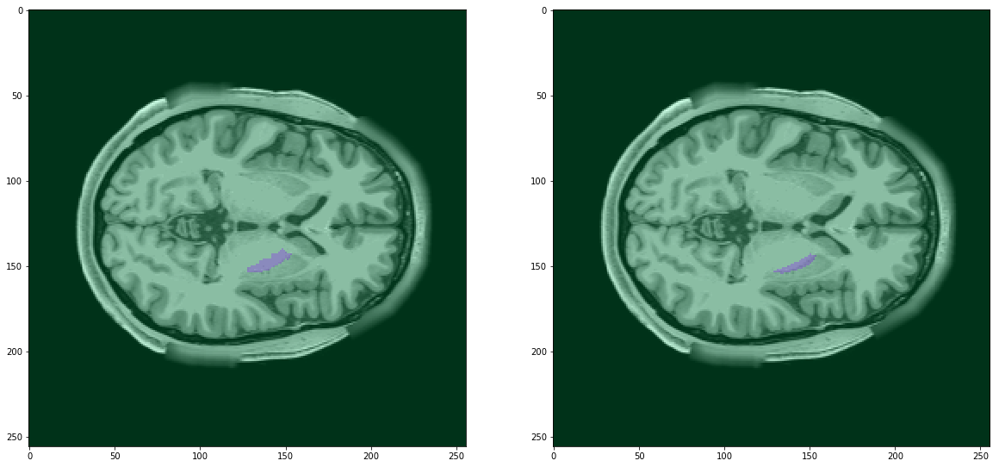

---------------------------------------------------------------------------
Grund Truth				Prediction


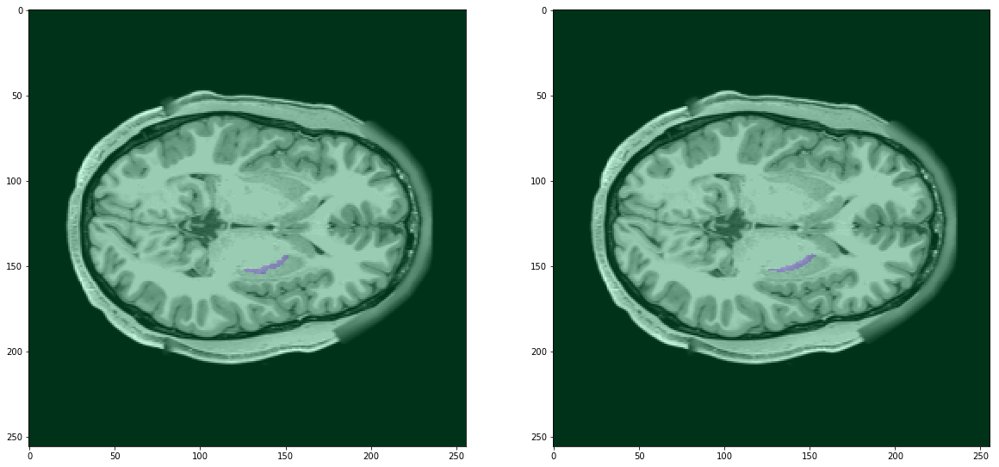

---------------------------------------------------------------------------
Grund Truth				Prediction


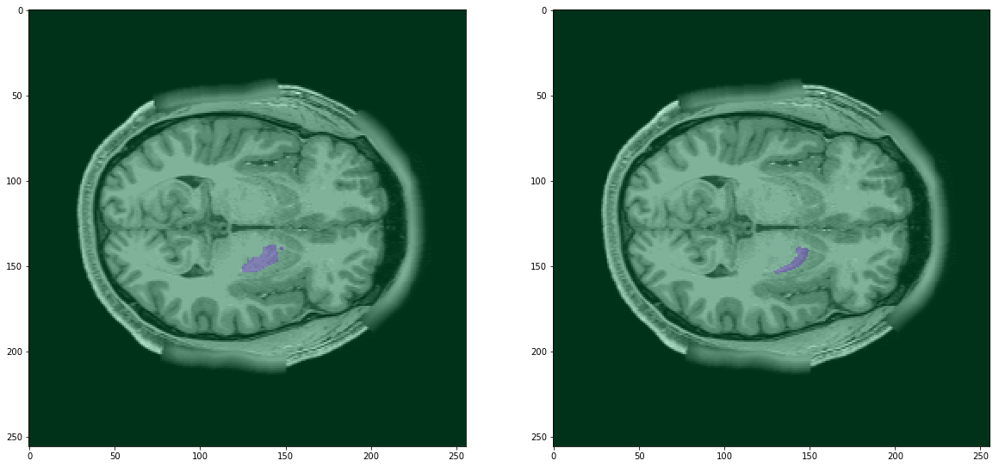

---------------------------------------------------------------------------


In [43]:
viz_given_seg(9)

Grund Truth				Prediction


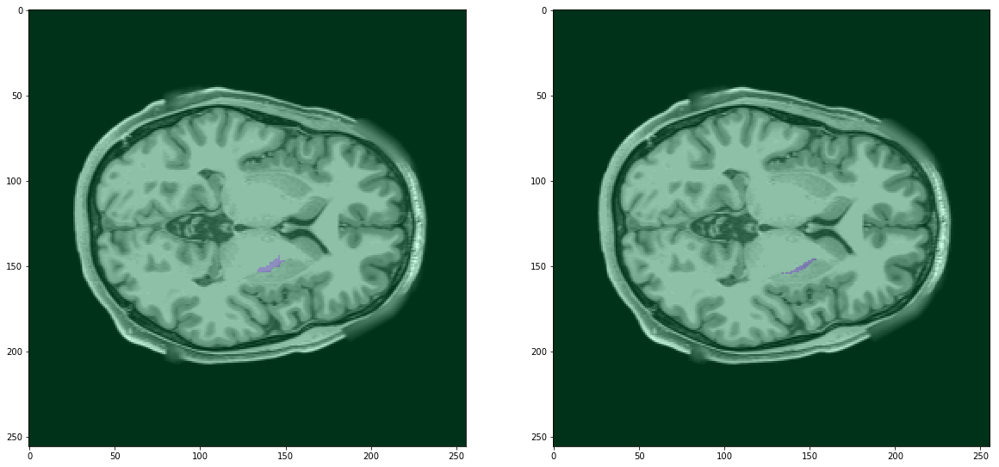

---------------------------------------------------------------------------
Grund Truth				Prediction


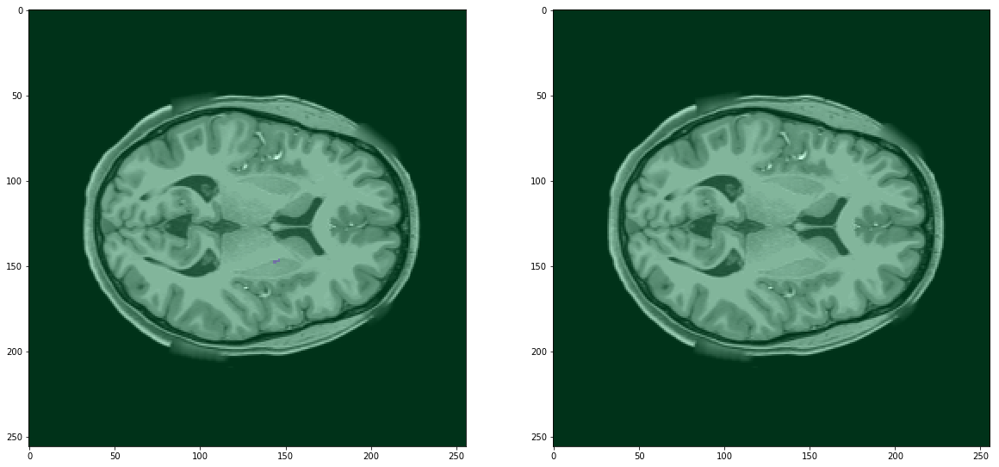

---------------------------------------------------------------------------
Grund Truth				Prediction


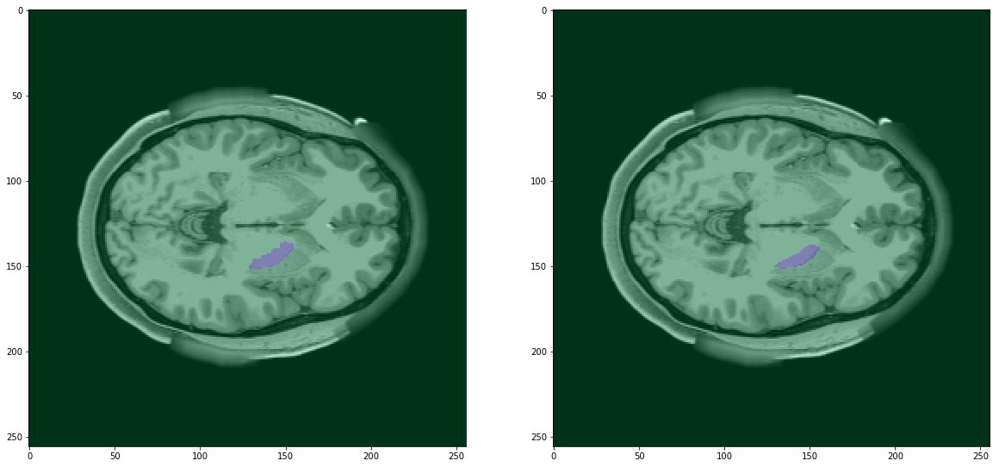

---------------------------------------------------------------------------
Grund Truth				Prediction


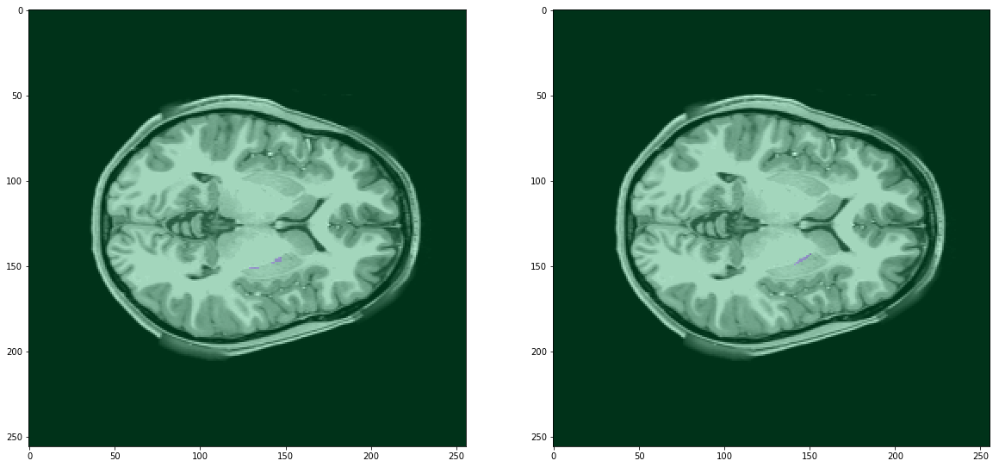

---------------------------------------------------------------------------
Grund Truth				Prediction


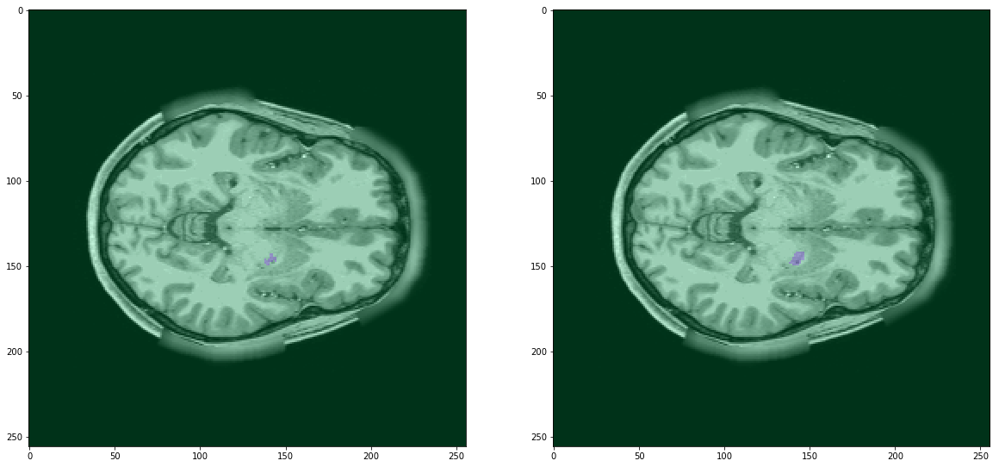

---------------------------------------------------------------------------
Grund Truth				Prediction


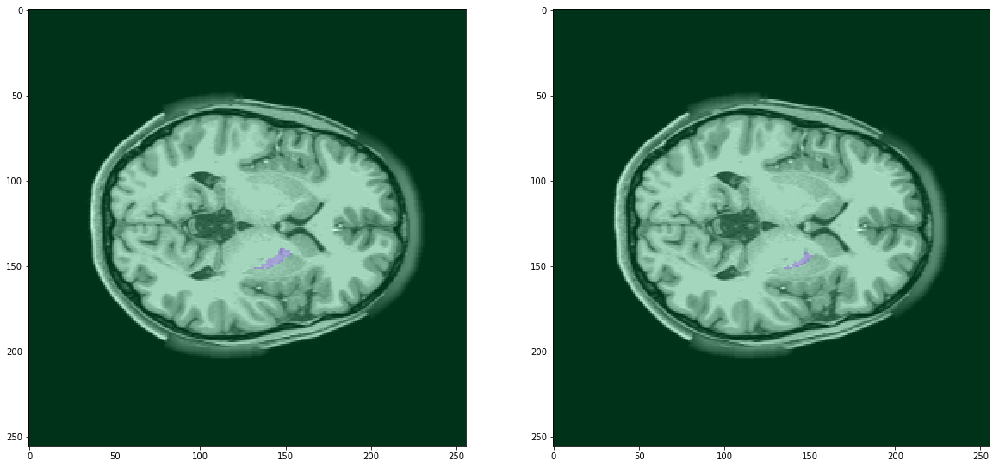

---------------------------------------------------------------------------
Grund Truth				Prediction


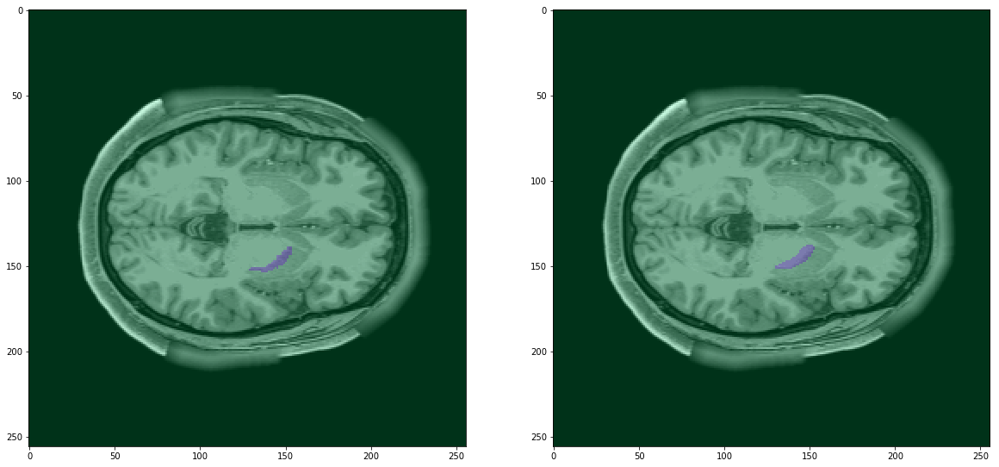

---------------------------------------------------------------------------


In [44]:
viz_given_seg(9)

Grund Truth				Prediction


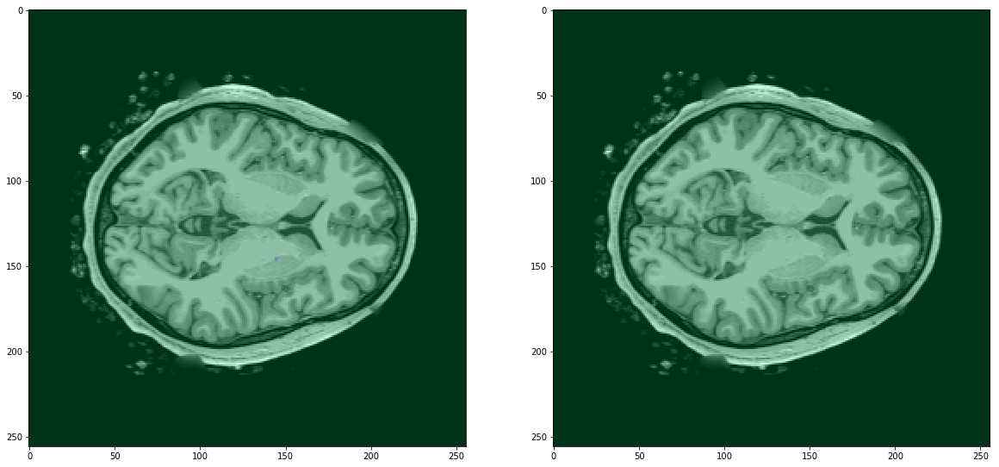

---------------------------------------------------------------------------
Grund Truth				Prediction


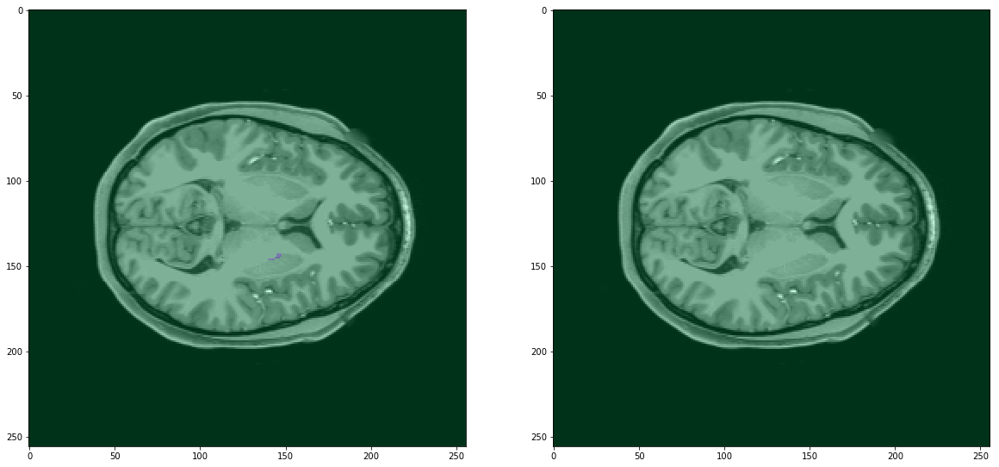

---------------------------------------------------------------------------
Grund Truth				Prediction


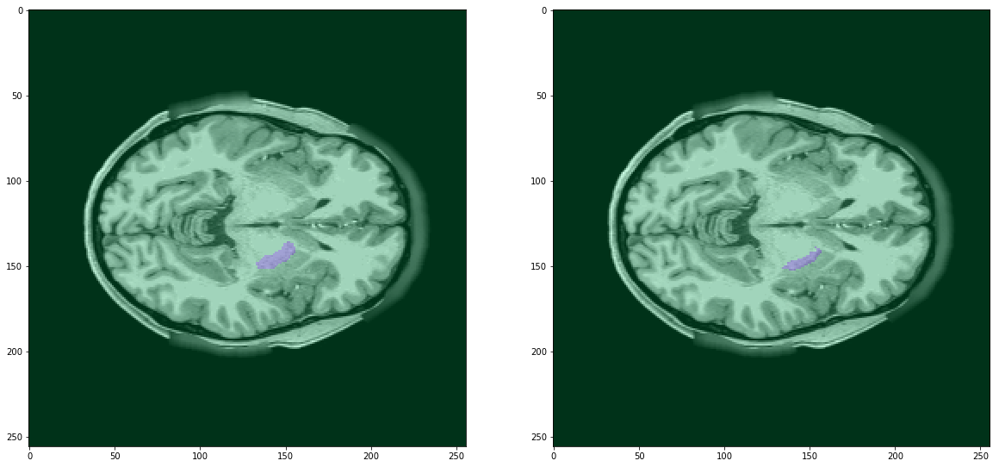

---------------------------------------------------------------------------
Grund Truth				Prediction


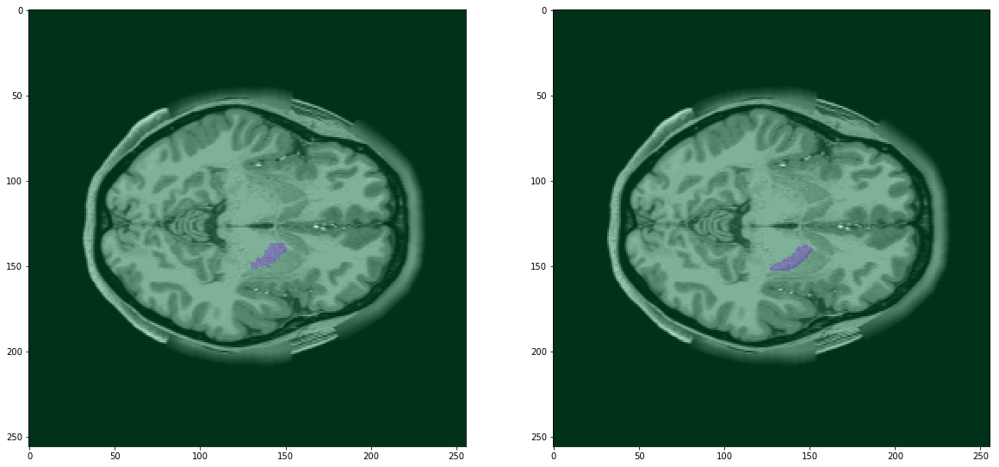

---------------------------------------------------------------------------


In [52]:
viz_given_seg(9)

Grund Truth				Prediction


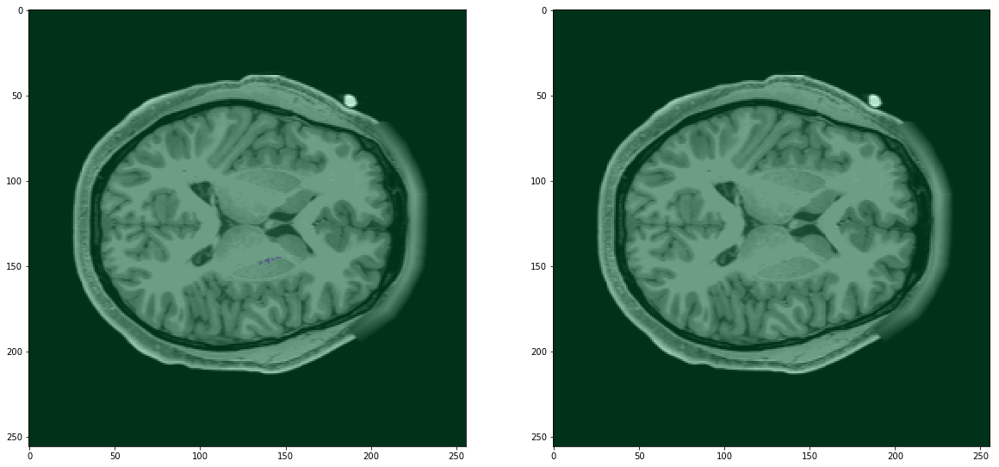

---------------------------------------------------------------------------
Grund Truth				Prediction


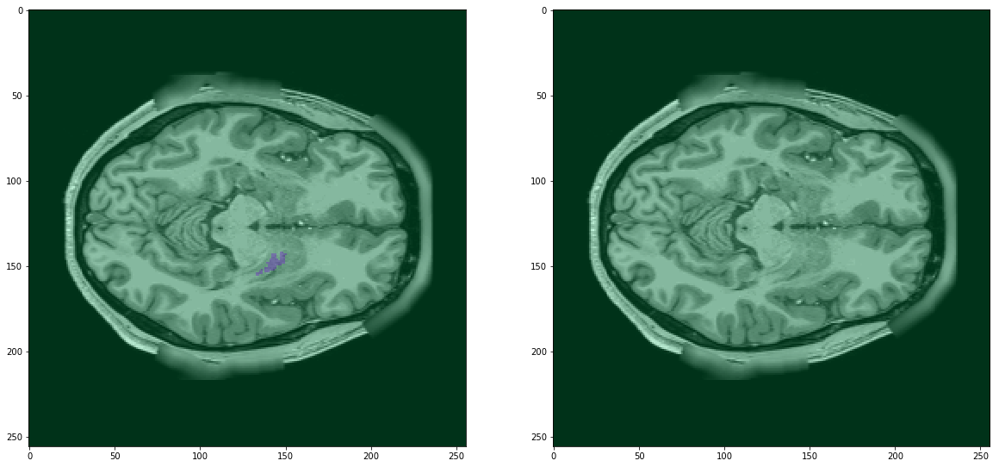

---------------------------------------------------------------------------
Grund Truth				Prediction


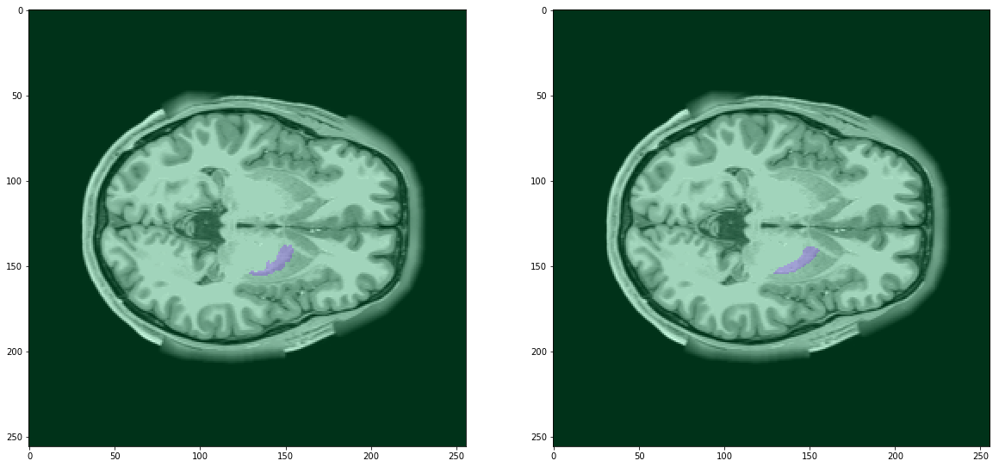

---------------------------------------------------------------------------
Grund Truth				Prediction


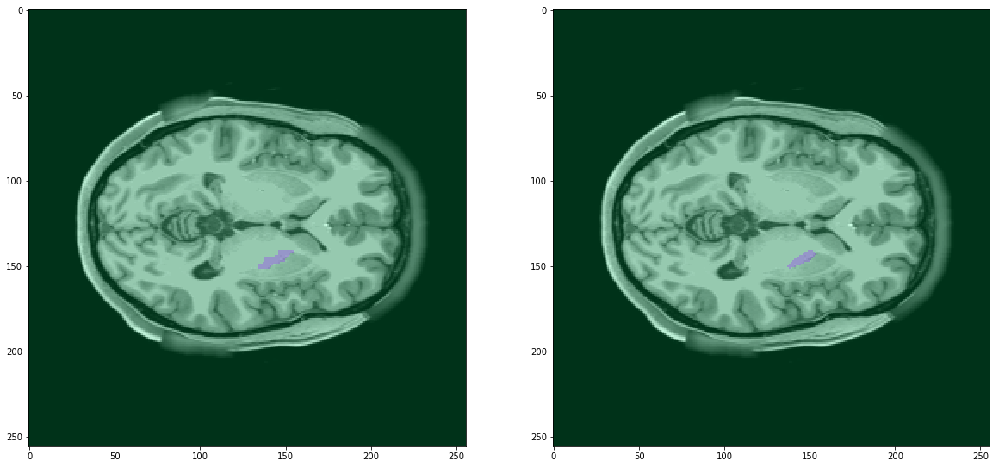

---------------------------------------------------------------------------
Grund Truth				Prediction


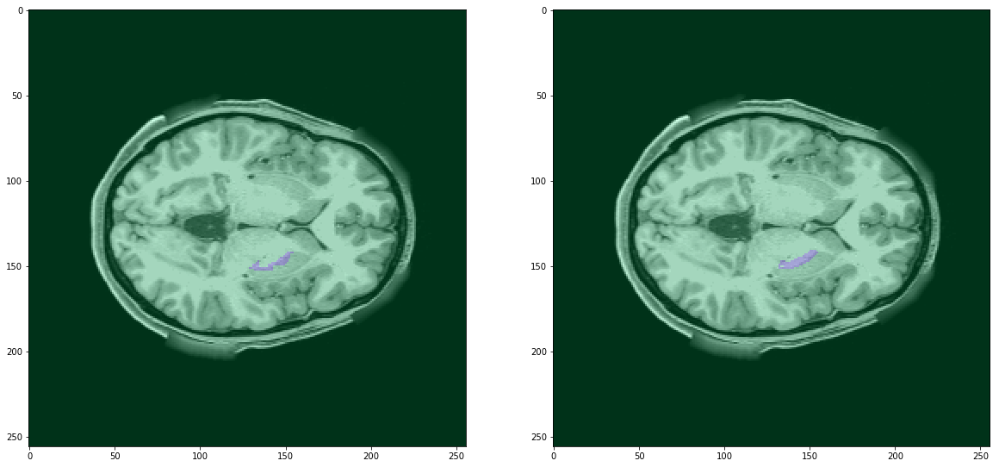

---------------------------------------------------------------------------
Grund Truth				Prediction


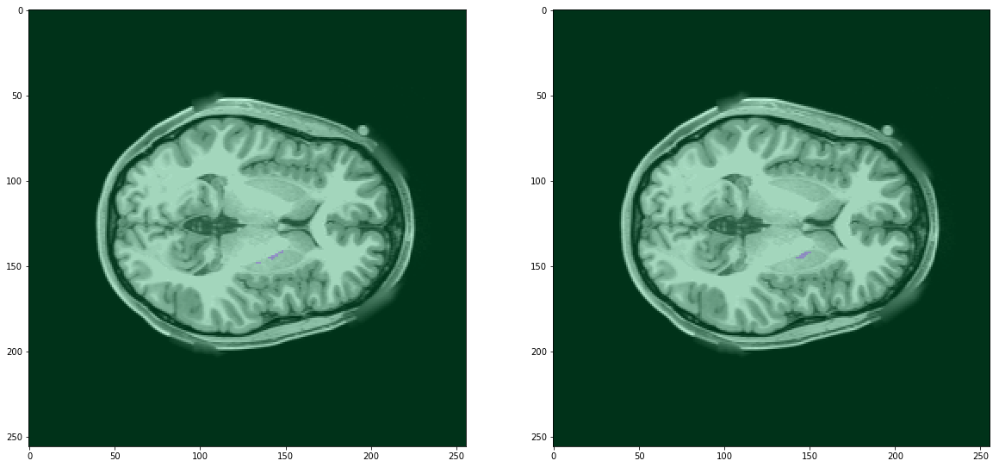

---------------------------------------------------------------------------
Grund Truth				Prediction


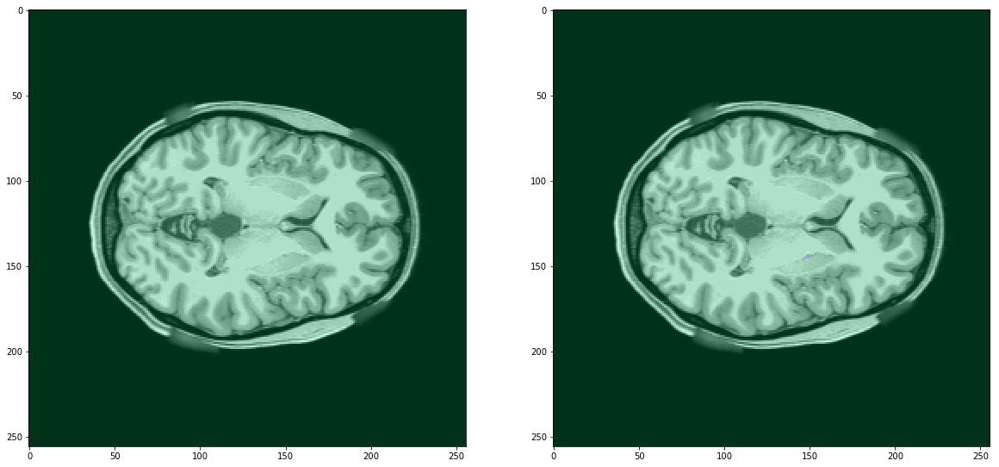

---------------------------------------------------------------------------
Grund Truth				Prediction


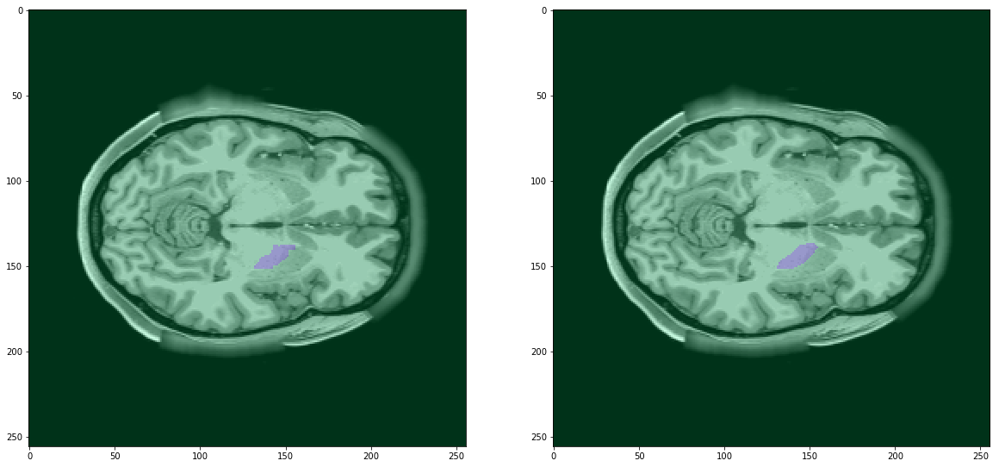

---------------------------------------------------------------------------
Grund Truth				Prediction


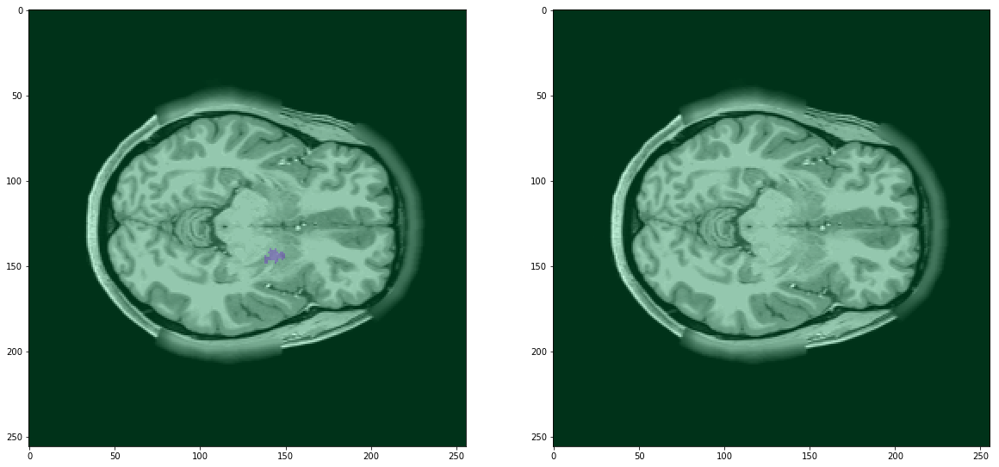

---------------------------------------------------------------------------


In [53]:
viz_given_seg(9)

Grund Truth				Prediction


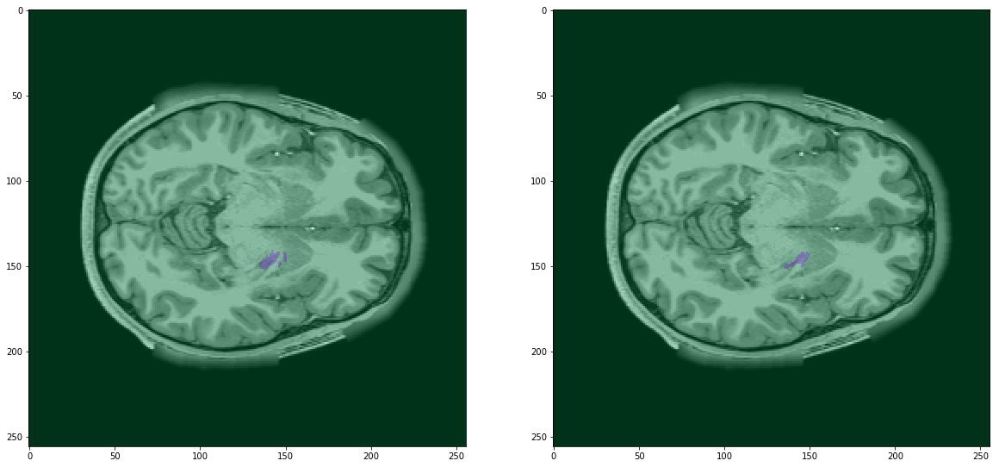

---------------------------------------------------------------------------
Grund Truth				Prediction


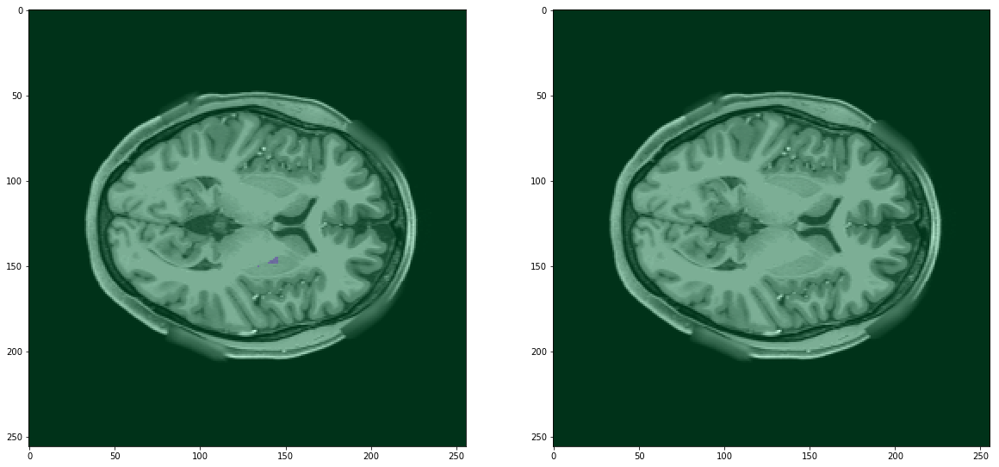

---------------------------------------------------------------------------
Grund Truth				Prediction


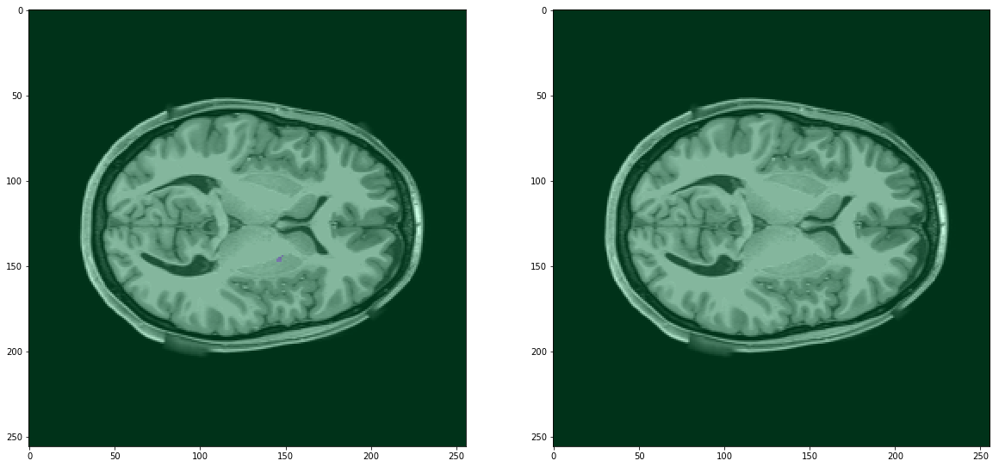

---------------------------------------------------------------------------


In [45]:
viz_given_seg(9)

# Right Palladium (52)

Grund Truth				Prediction


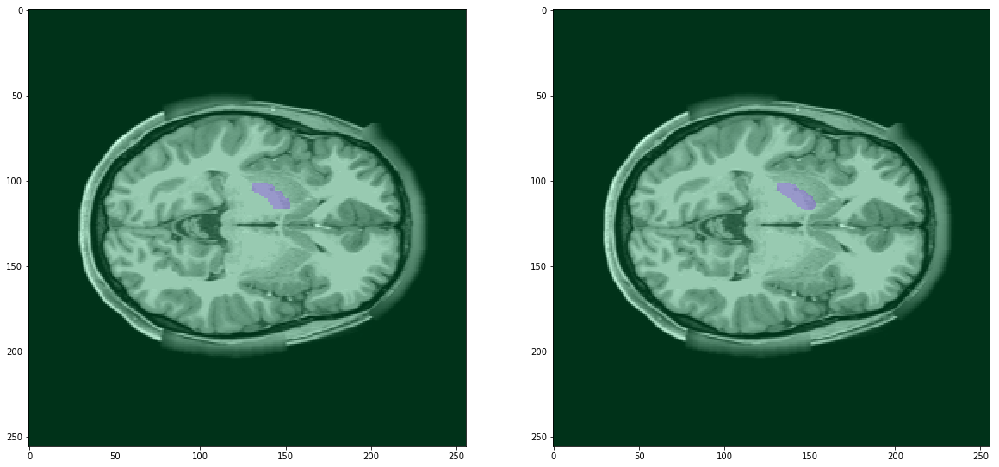

---------------------------------------------------------------------------
Grund Truth				Prediction


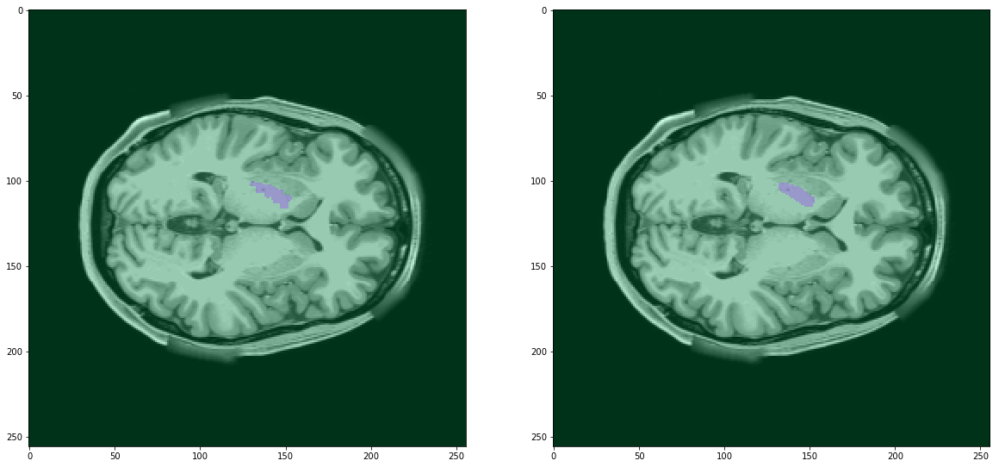

---------------------------------------------------------------------------
Grund Truth				Prediction


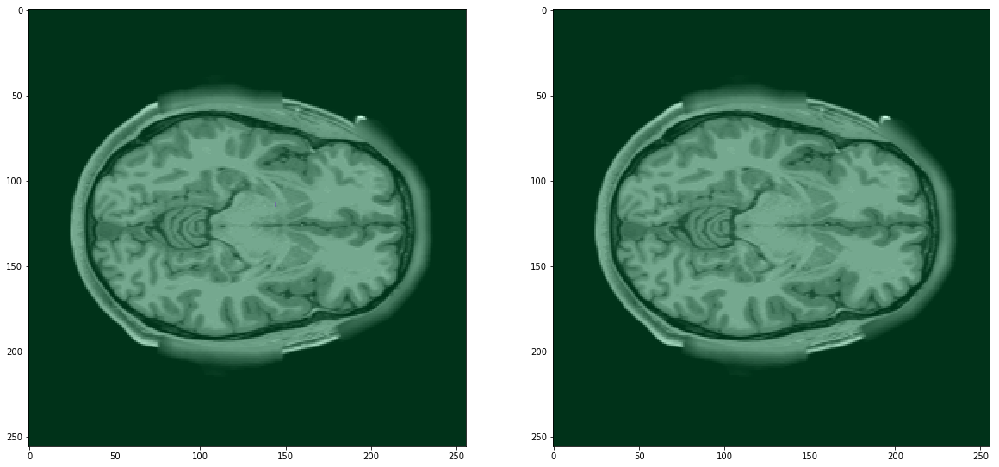

---------------------------------------------------------------------------
Grund Truth				Prediction


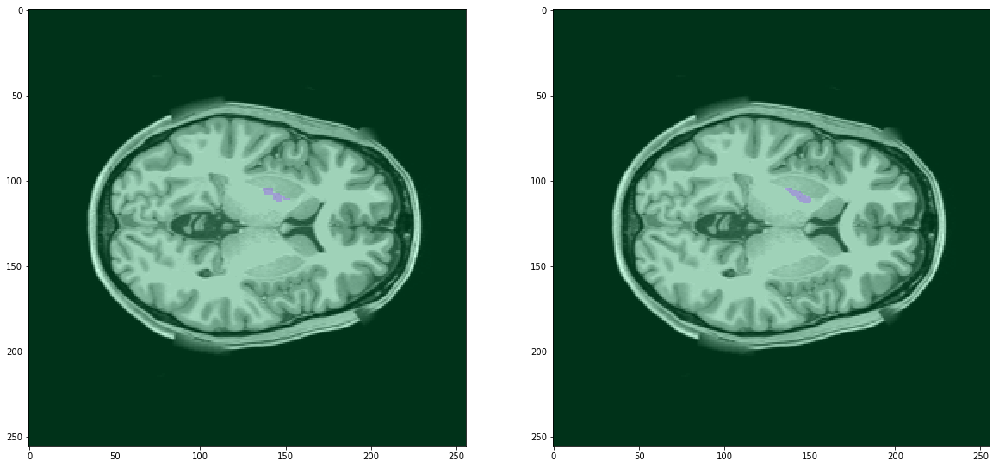

---------------------------------------------------------------------------
Grund Truth				Prediction


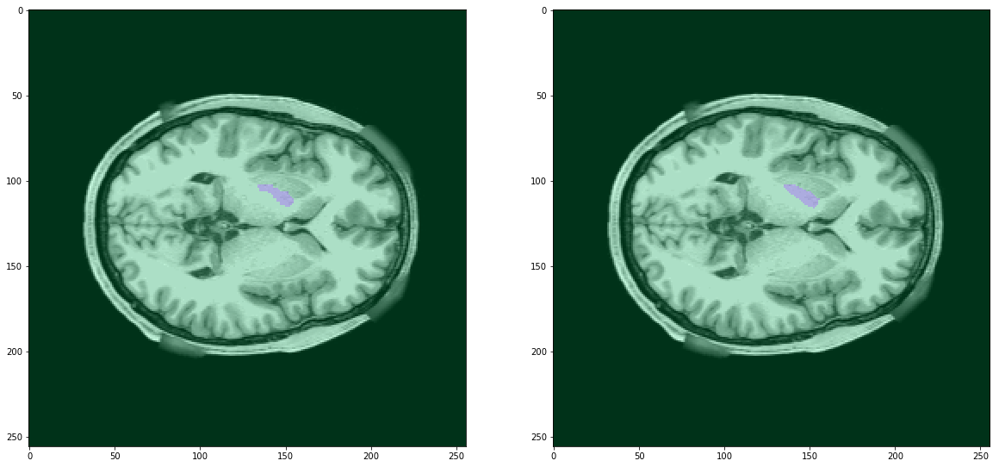

---------------------------------------------------------------------------
Grund Truth				Prediction


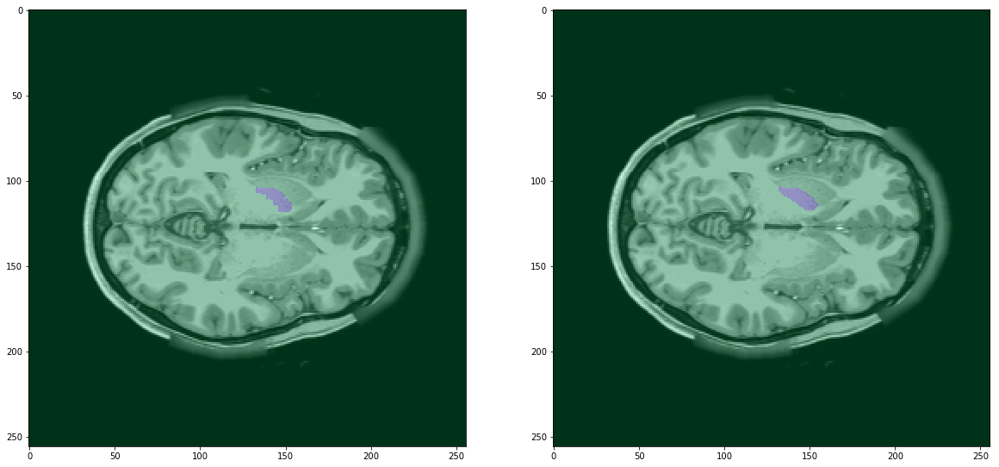

---------------------------------------------------------------------------


In [48]:
viz_given_seg(29)

Grund Truth				Prediction


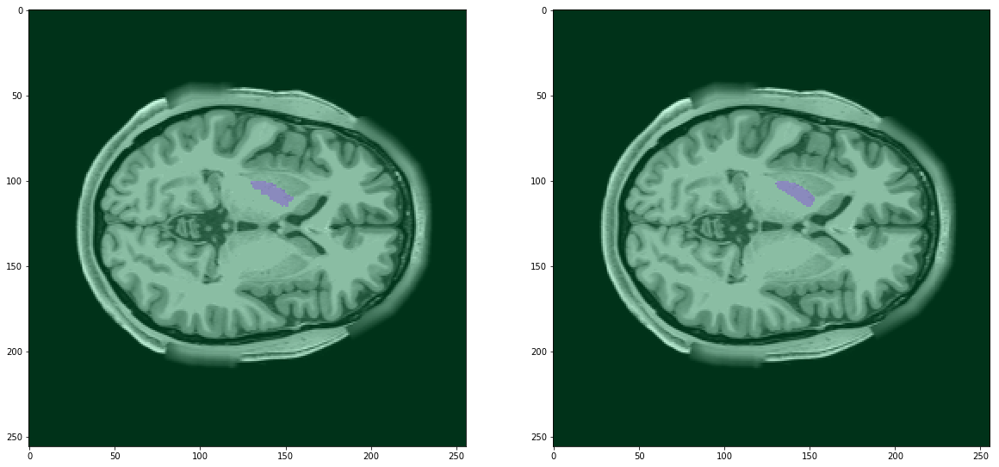

---------------------------------------------------------------------------
Grund Truth				Prediction


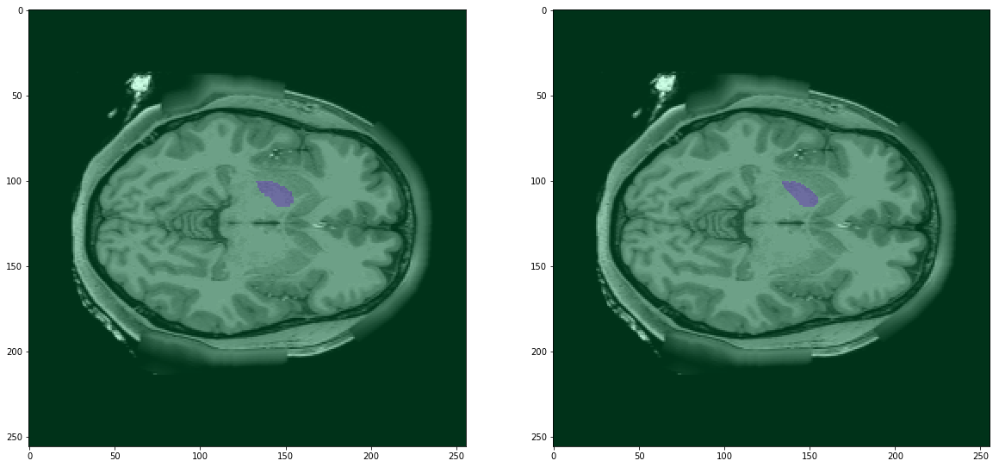

---------------------------------------------------------------------------
Grund Truth				Prediction


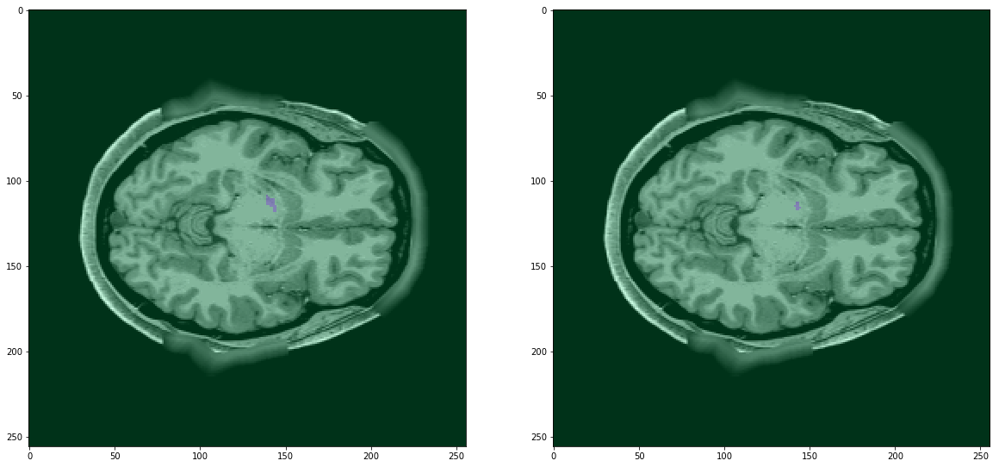

---------------------------------------------------------------------------
Grund Truth				Prediction


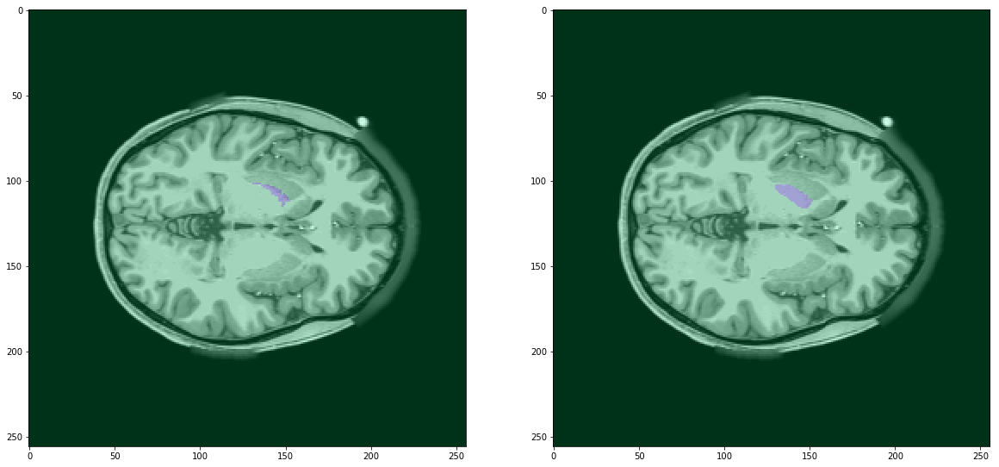

---------------------------------------------------------------------------
Grund Truth				Prediction


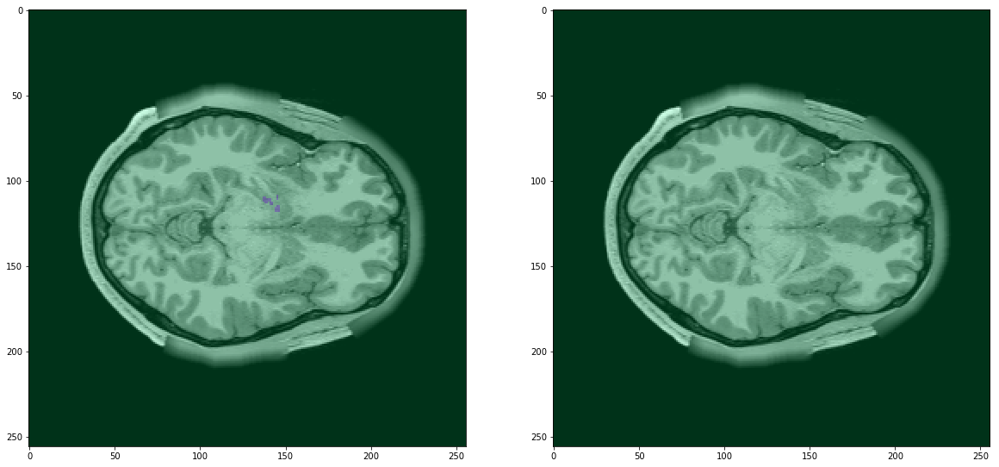

---------------------------------------------------------------------------
Grund Truth				Prediction


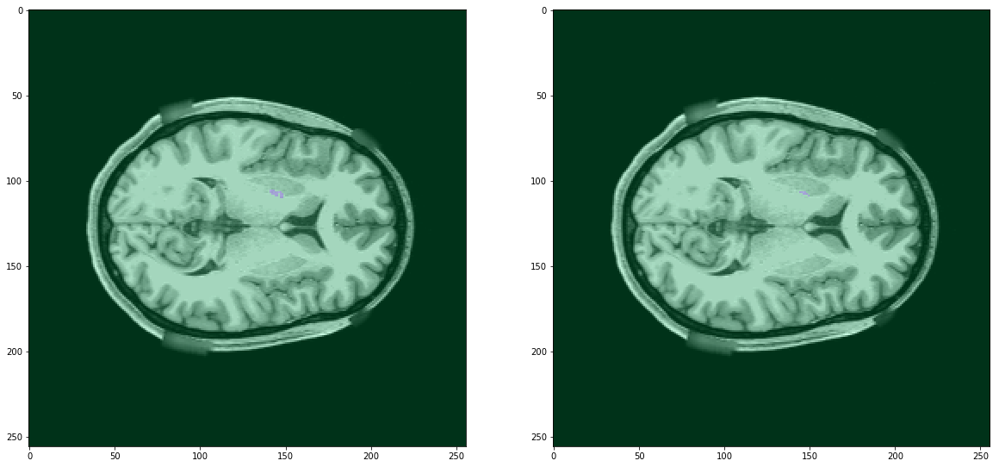

---------------------------------------------------------------------------
Grund Truth				Prediction


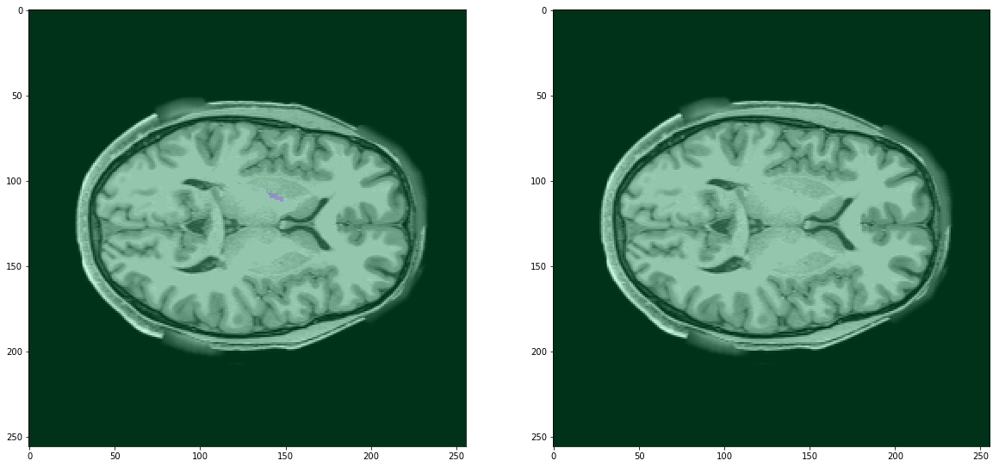

---------------------------------------------------------------------------
Grund Truth				Prediction


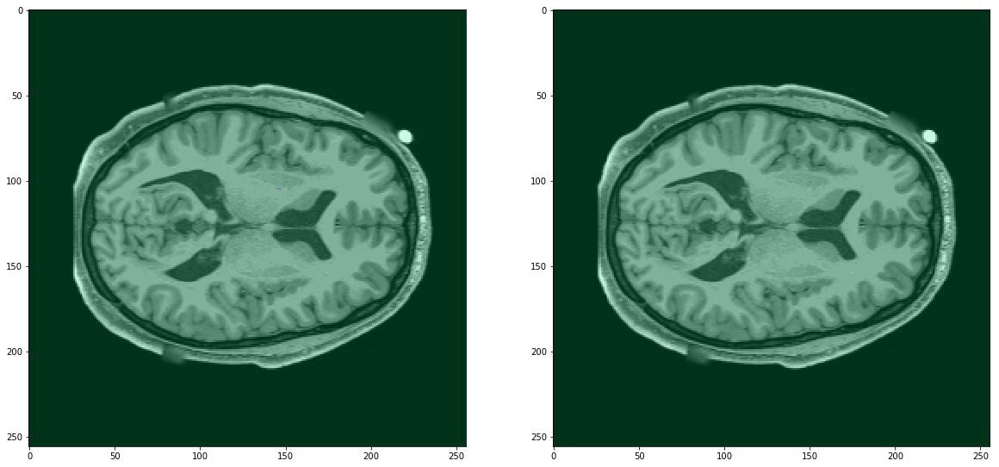

---------------------------------------------------------------------------


In [49]:
viz_given_seg(29)

Grund Truth				Prediction


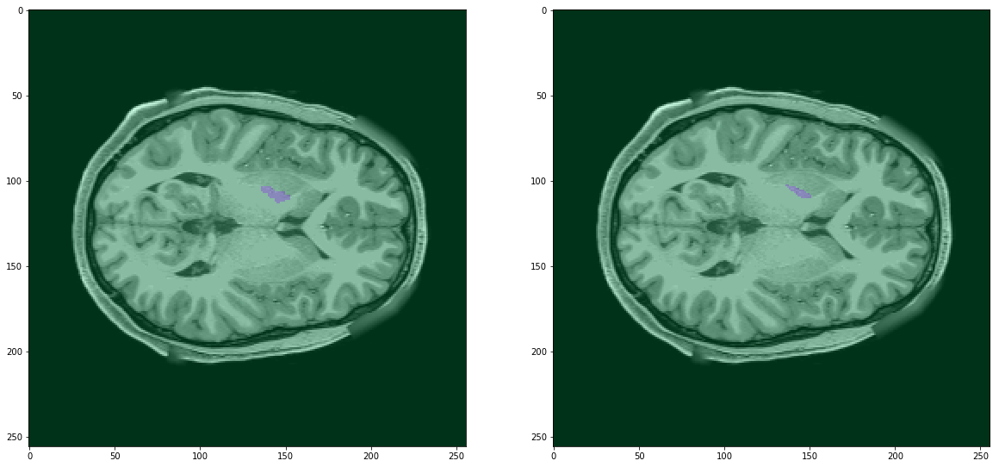

---------------------------------------------------------------------------
Grund Truth				Prediction


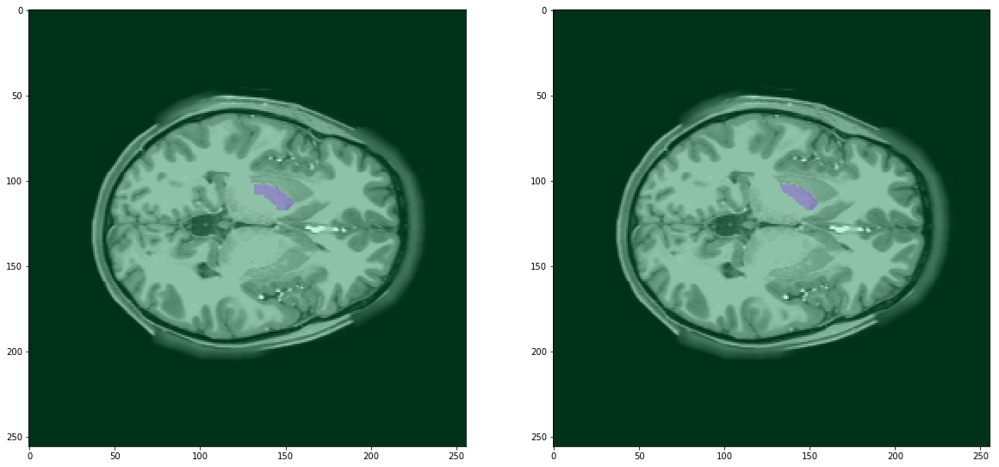

---------------------------------------------------------------------------
Grund Truth				Prediction


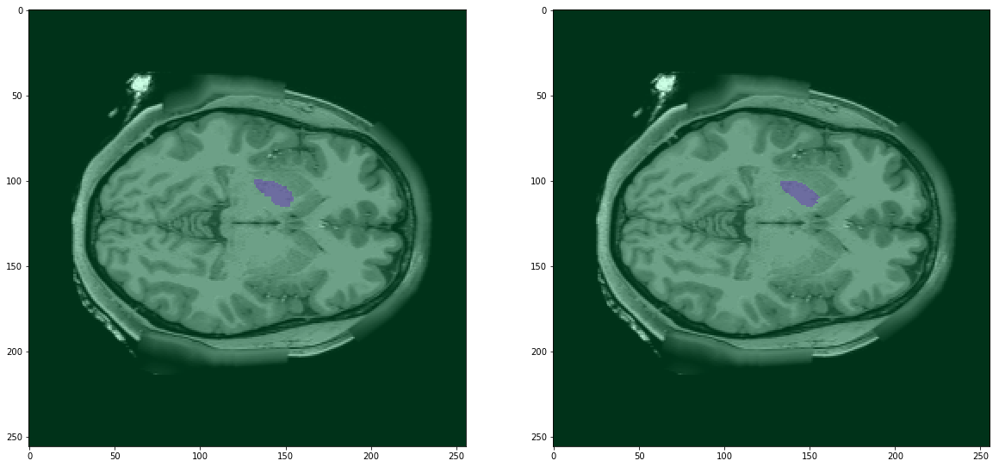

---------------------------------------------------------------------------


In [50]:
viz_given_seg(29)

Grund Truth				Prediction


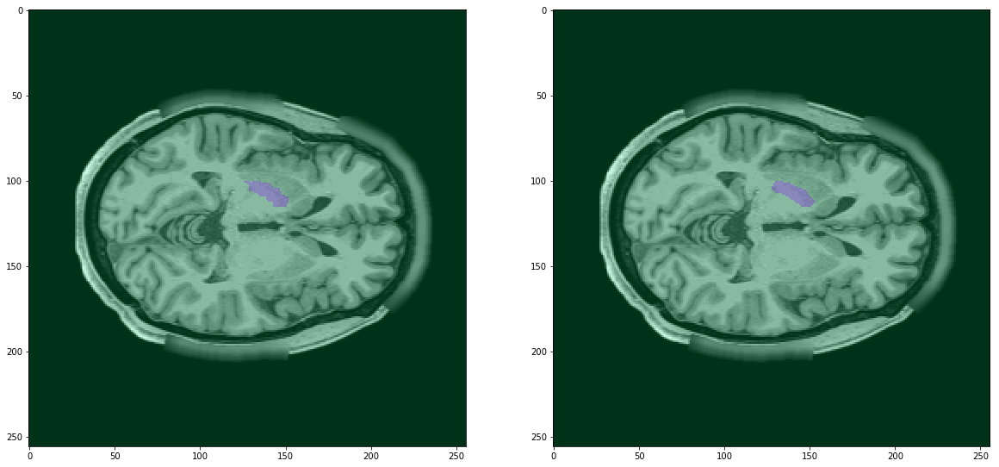

---------------------------------------------------------------------------
Grund Truth				Prediction


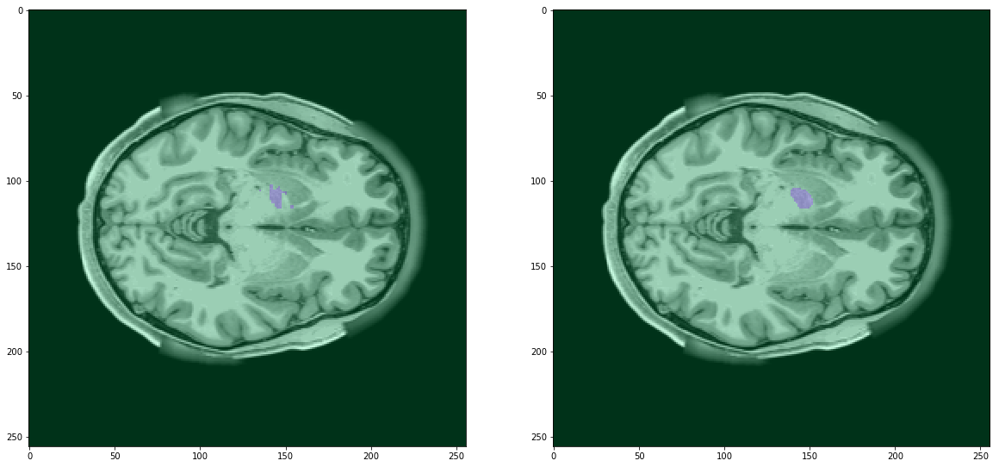

---------------------------------------------------------------------------
Grund Truth				Prediction


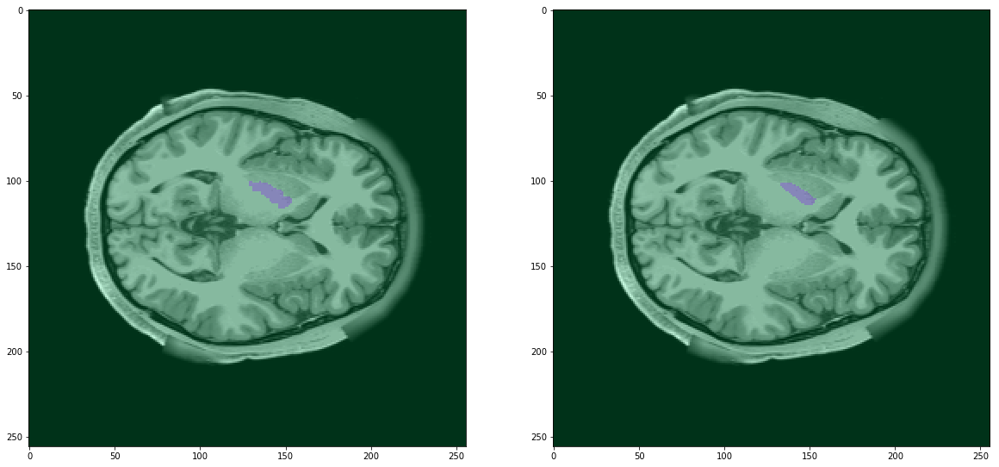

---------------------------------------------------------------------------
Grund Truth				Prediction


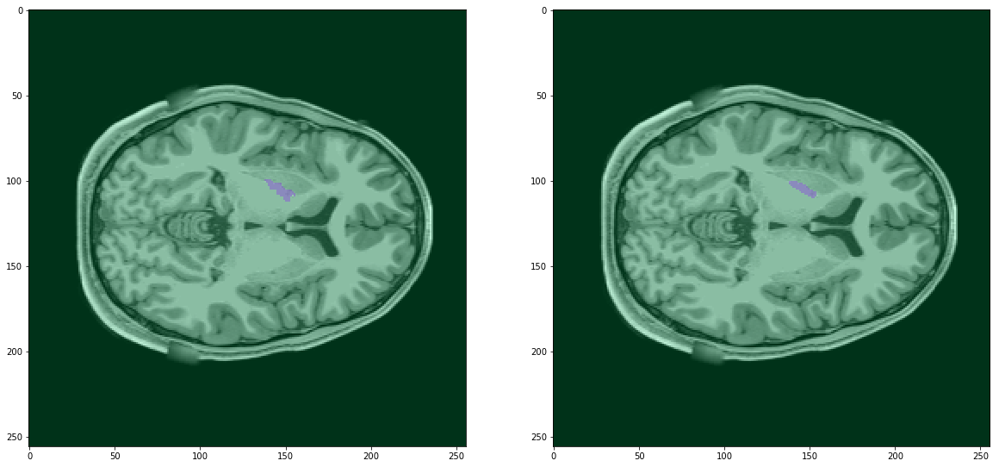

---------------------------------------------------------------------------


In [51]:
viz_given_seg(29)

In [54]:
rest_available.index(30)

18

# Left Vessel (30)

Grund Truth				Prediction


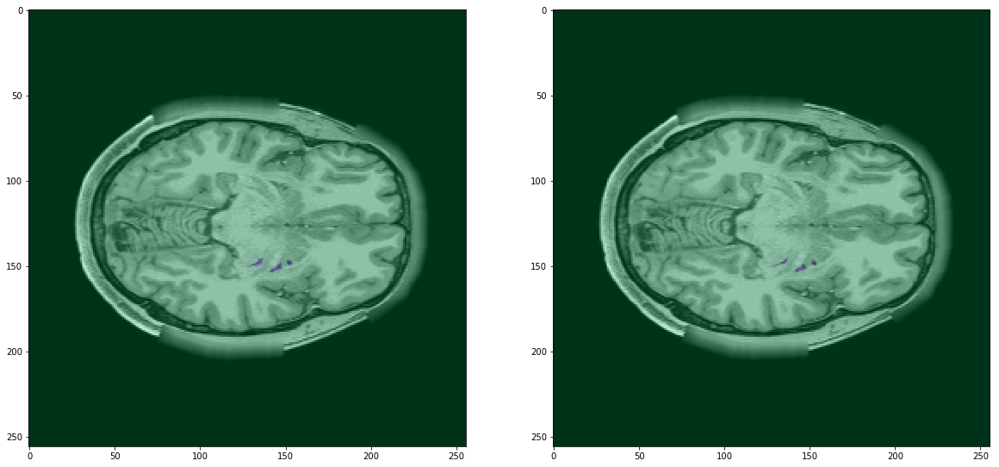

---------------------------------------------------------------------------


In [57]:
viz_given_seg(18)

Grund Truth				Prediction


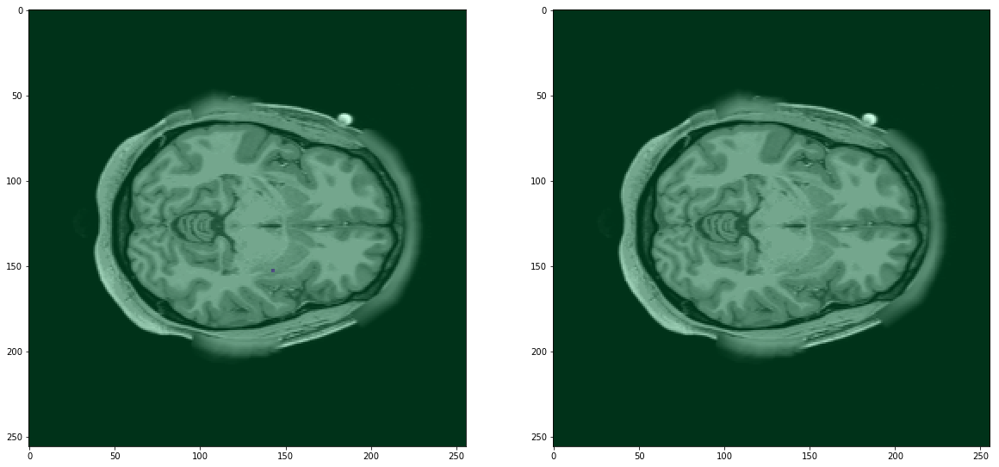

---------------------------------------------------------------------------
Grund Truth				Prediction


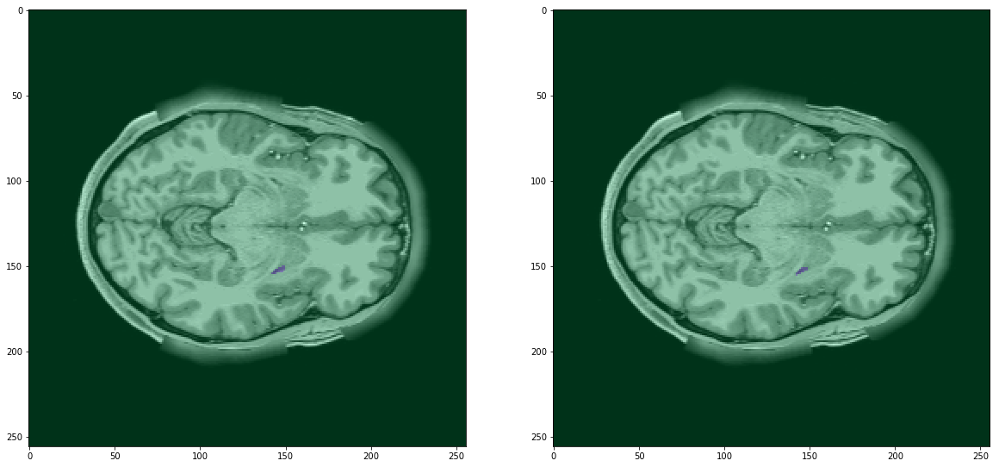

---------------------------------------------------------------------------
Grund Truth				Prediction


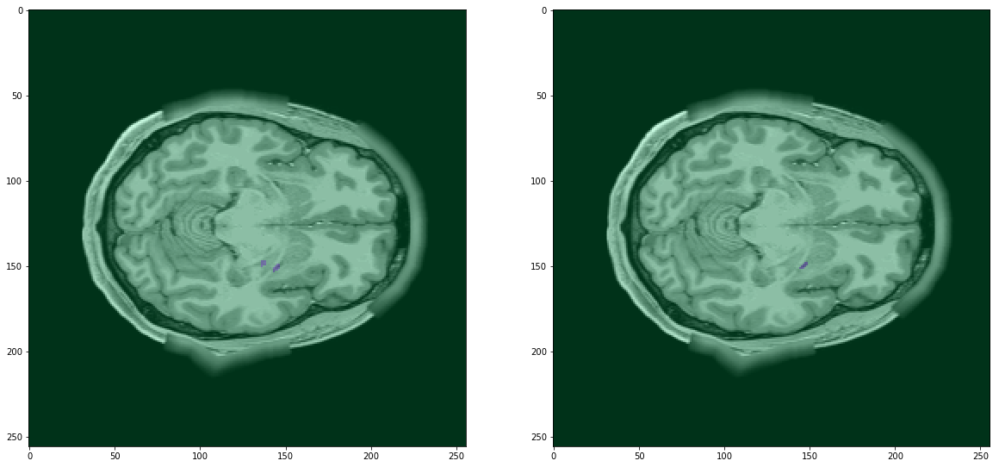

---------------------------------------------------------------------------
Grund Truth				Prediction


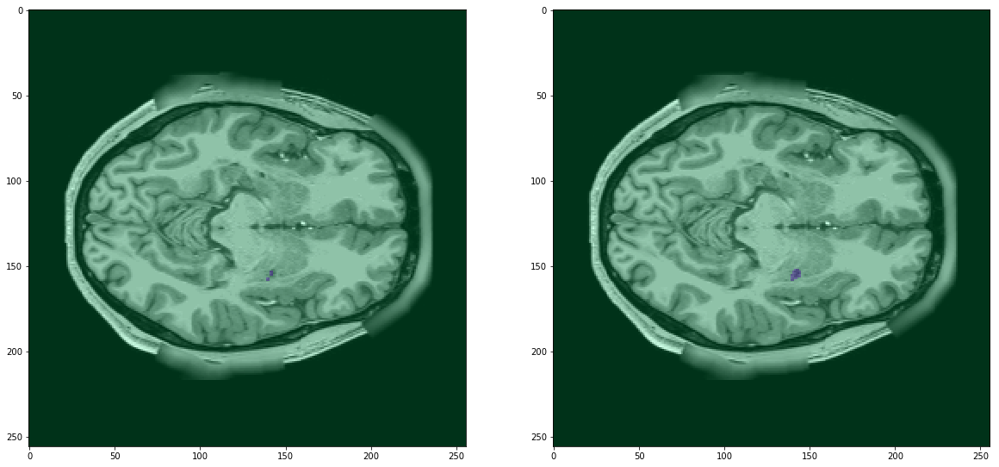

---------------------------------------------------------------------------


In [59]:
viz_given_seg(18)

Grund Truth				Prediction


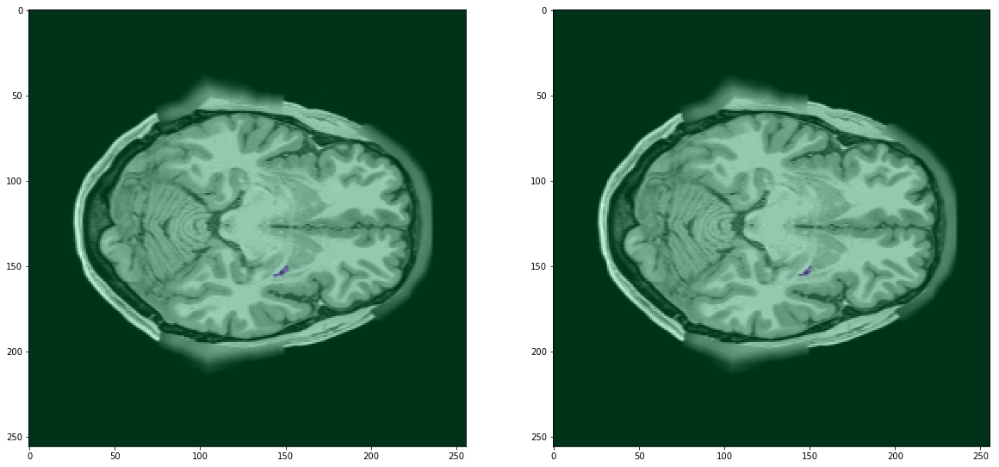

---------------------------------------------------------------------------
Grund Truth				Prediction


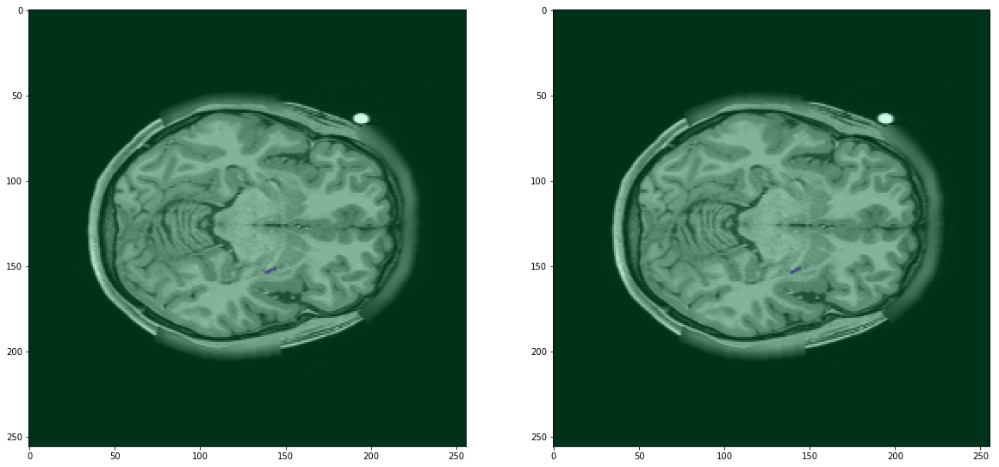

---------------------------------------------------------------------------
Grund Truth				Prediction


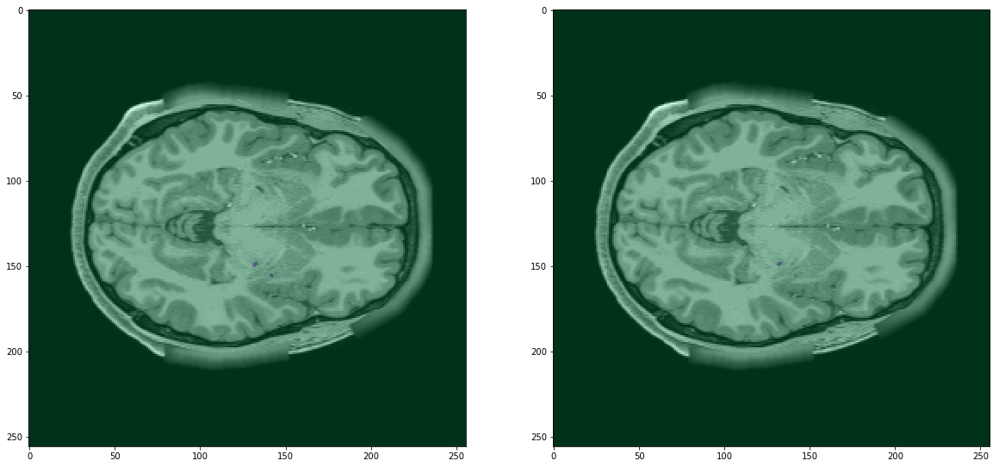

---------------------------------------------------------------------------


In [60]:
viz_given_seg(18)

Grund Truth				Prediction


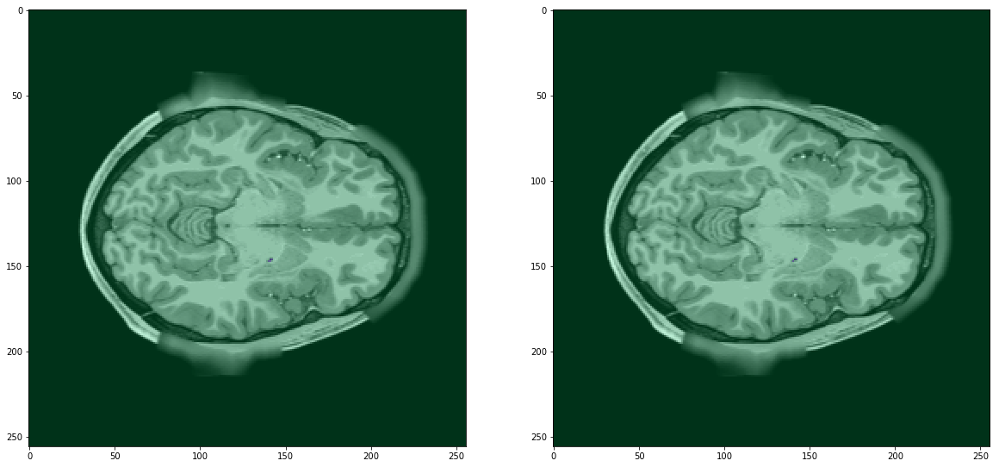

---------------------------------------------------------------------------
Grund Truth				Prediction


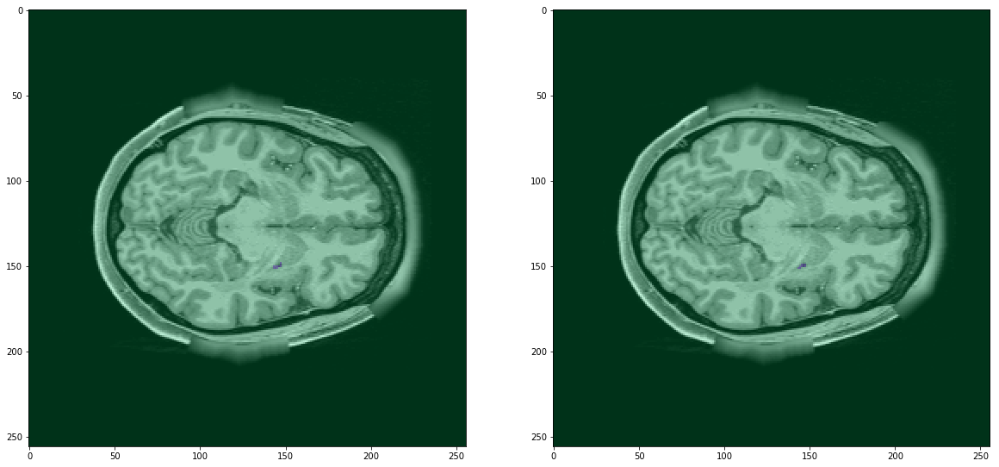

---------------------------------------------------------------------------
Grund Truth				Prediction


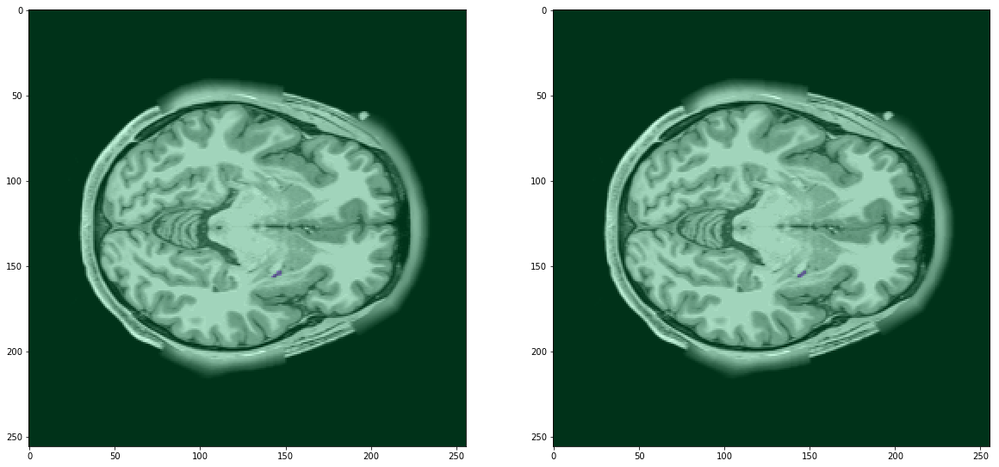

---------------------------------------------------------------------------


In [61]:
viz_given_seg(18)

Grund Truth				Prediction


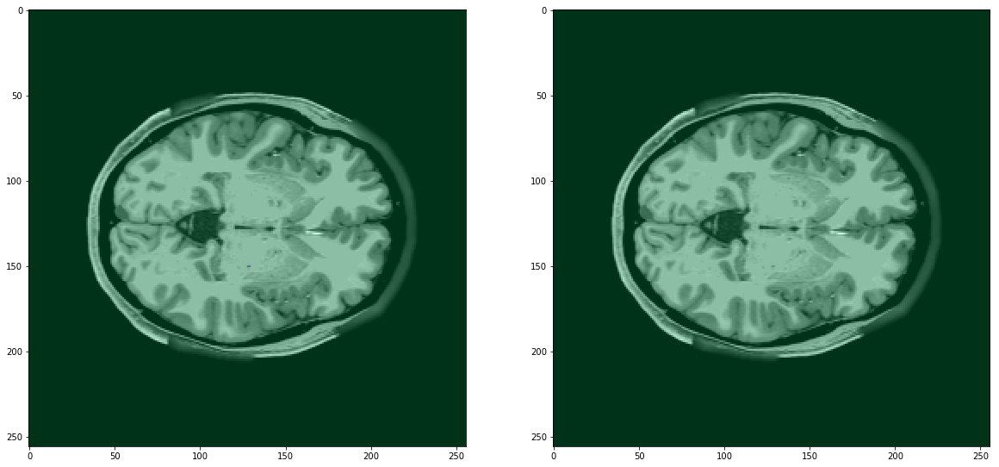

---------------------------------------------------------------------------
Grund Truth				Prediction


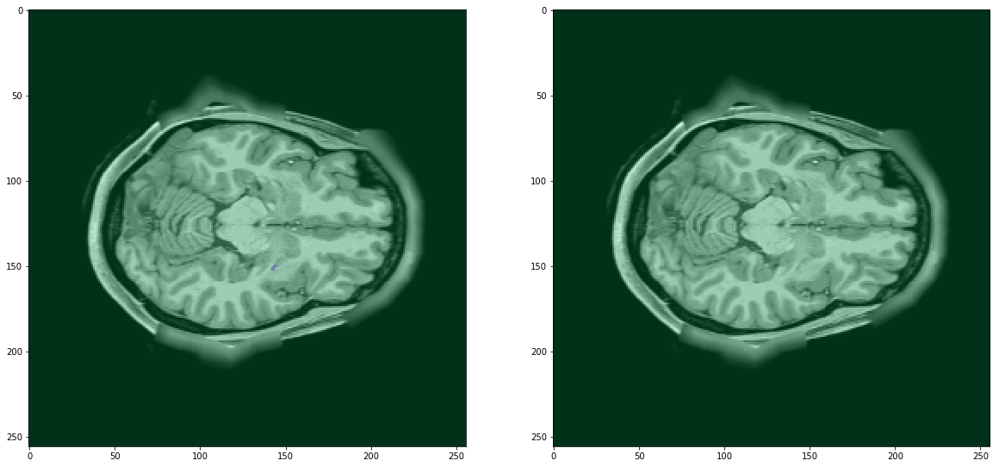

---------------------------------------------------------------------------


In [62]:
viz_given_seg(18)

In [64]:
rest_available.index(5)

3

# Left Cerebral Cortex (5)

Grund Truth				Prediction


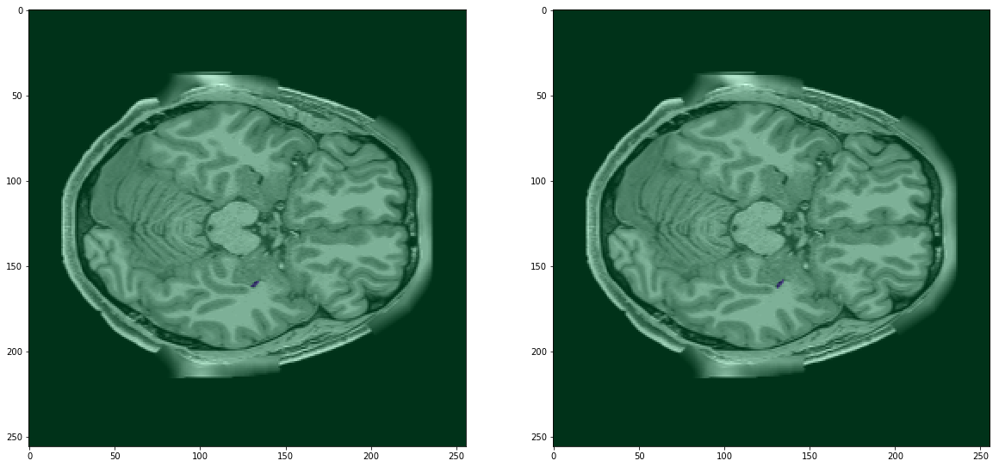

---------------------------------------------------------------------------
Grund Truth				Prediction


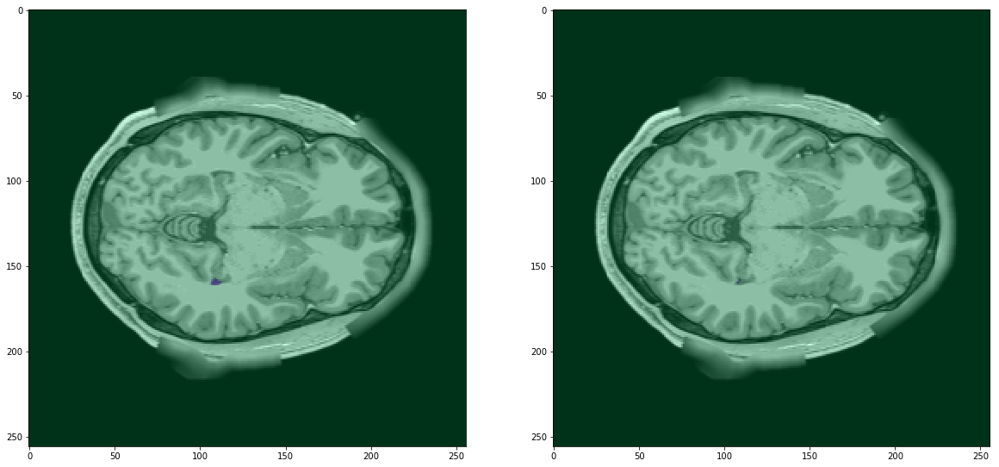

---------------------------------------------------------------------------
Grund Truth				Prediction


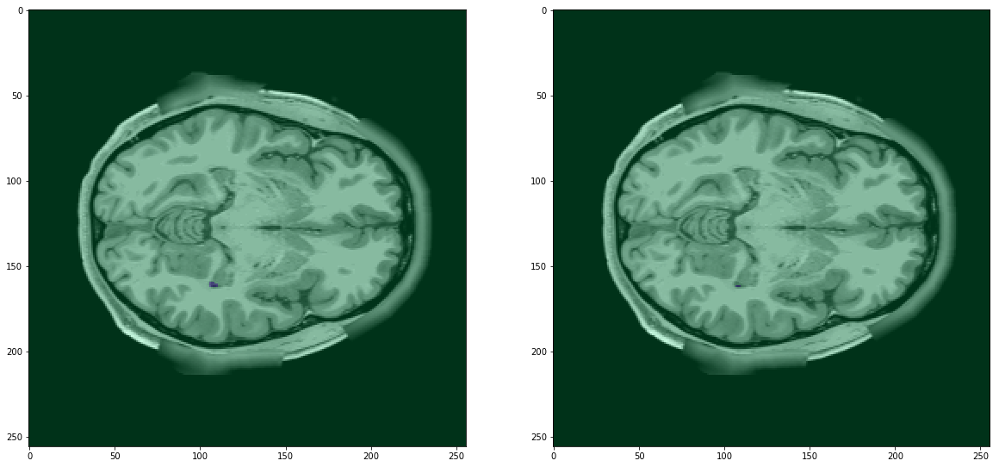

---------------------------------------------------------------------------


In [65]:
viz_given_seg(3)

Grund Truth				Prediction


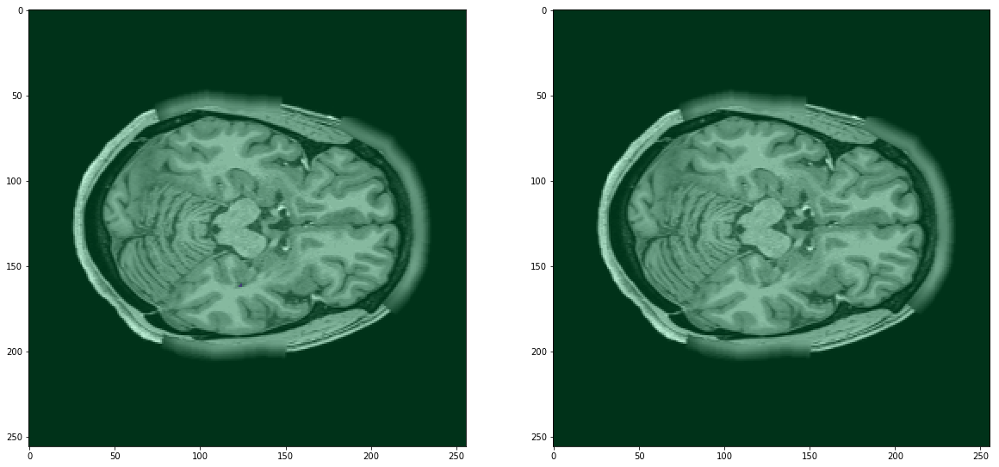

---------------------------------------------------------------------------
Grund Truth				Prediction


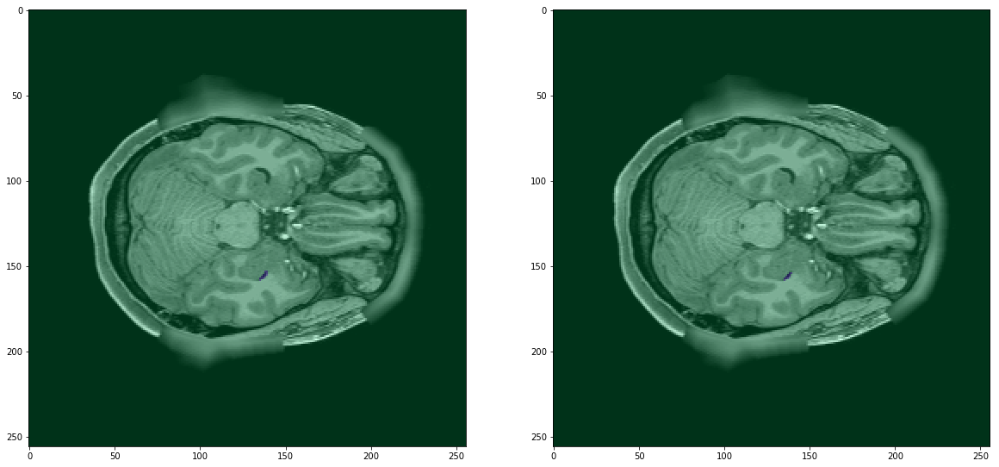

---------------------------------------------------------------------------
Grund Truth				Prediction


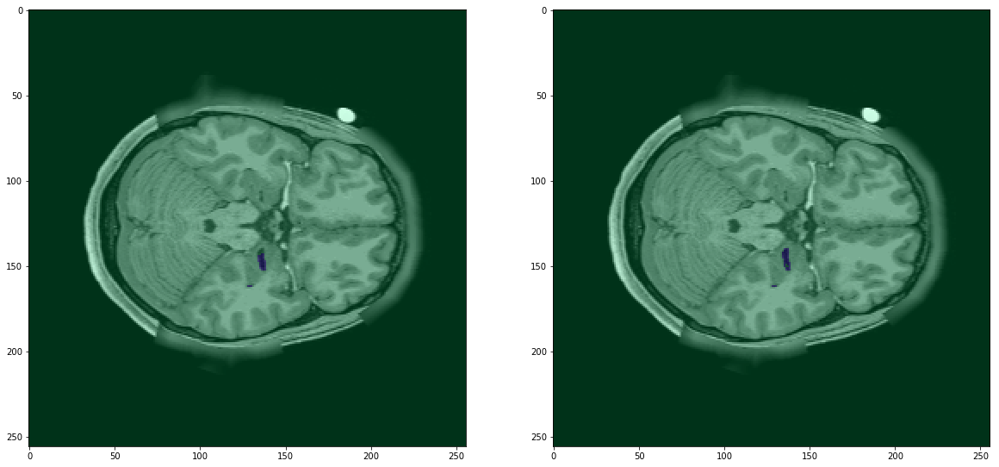

---------------------------------------------------------------------------
Grund Truth				Prediction


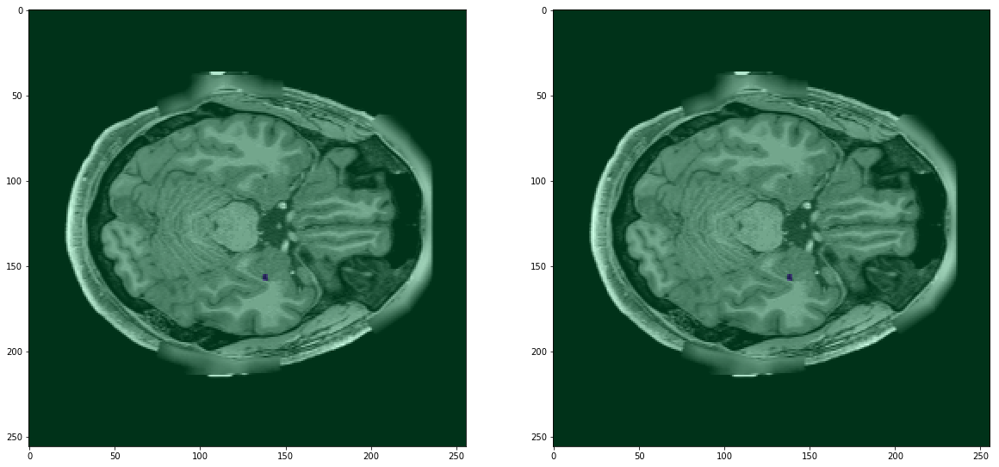

---------------------------------------------------------------------------


In [66]:
viz_given_seg(3)

Grund Truth				Prediction


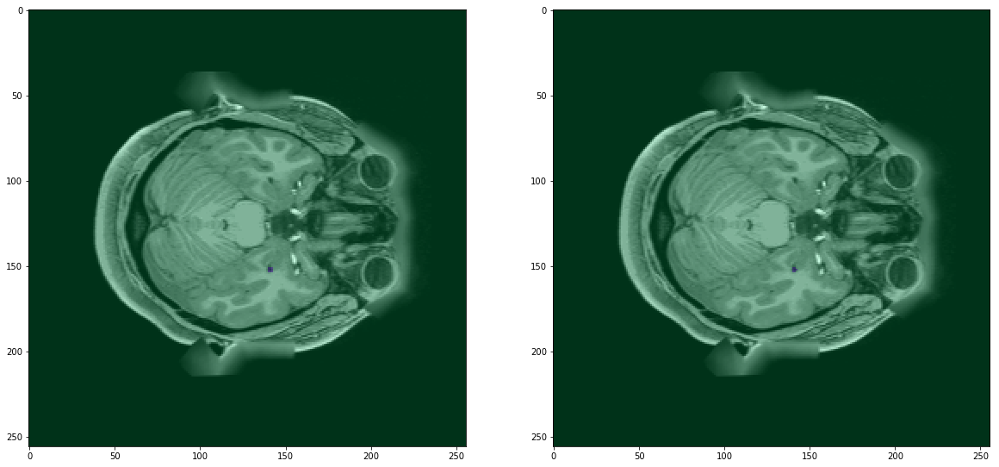

---------------------------------------------------------------------------
Grund Truth				Prediction


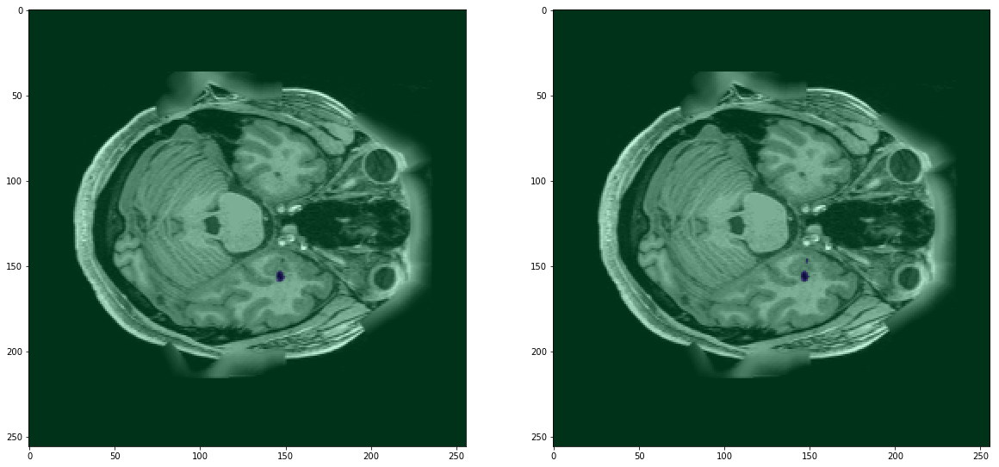

---------------------------------------------------------------------------
Grund Truth				Prediction


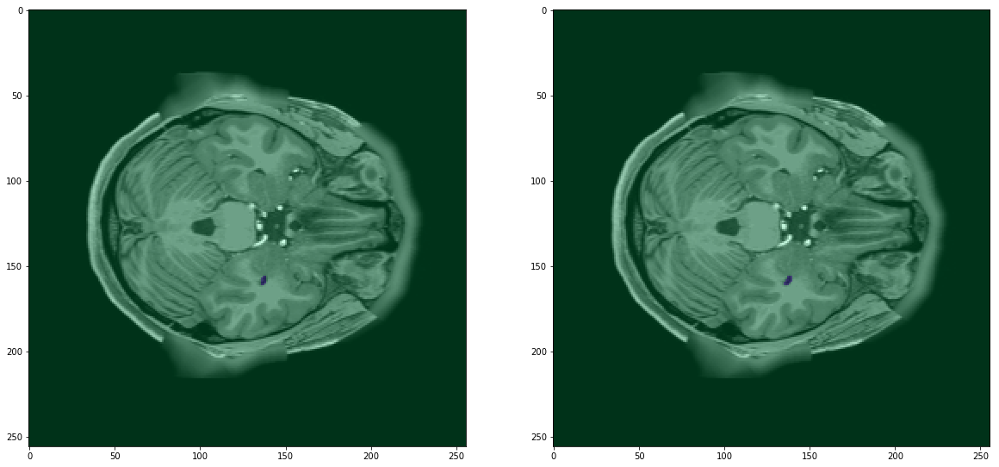

---------------------------------------------------------------------------
Grund Truth				Prediction


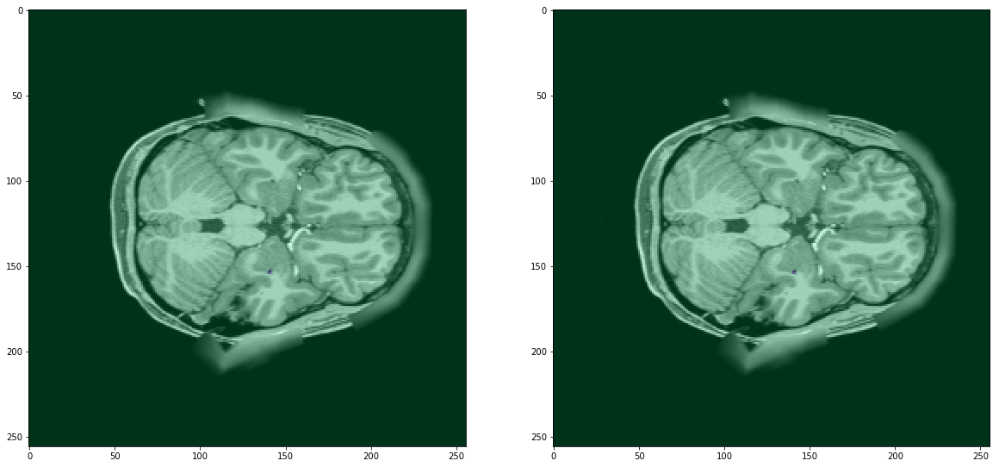

---------------------------------------------------------------------------
Grund Truth				Prediction


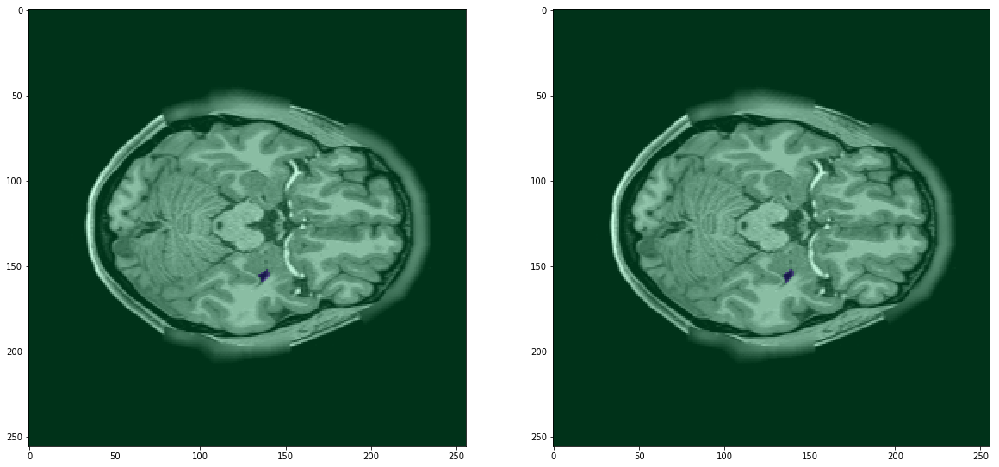

---------------------------------------------------------------------------


In [67]:
viz_given_seg(3)

In [68]:
rest_available.index(31)

19

# Left Insula (31)

Grund Truth				Prediction


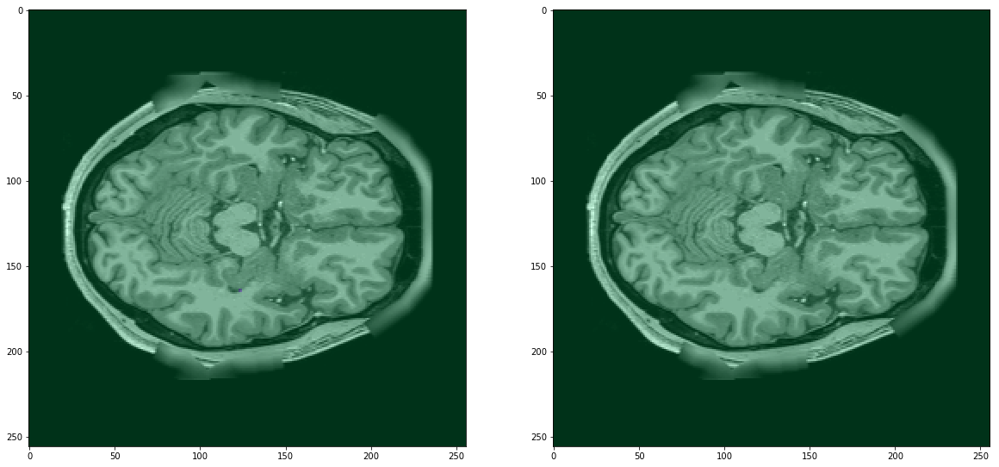

---------------------------------------------------------------------------
Grund Truth				Prediction


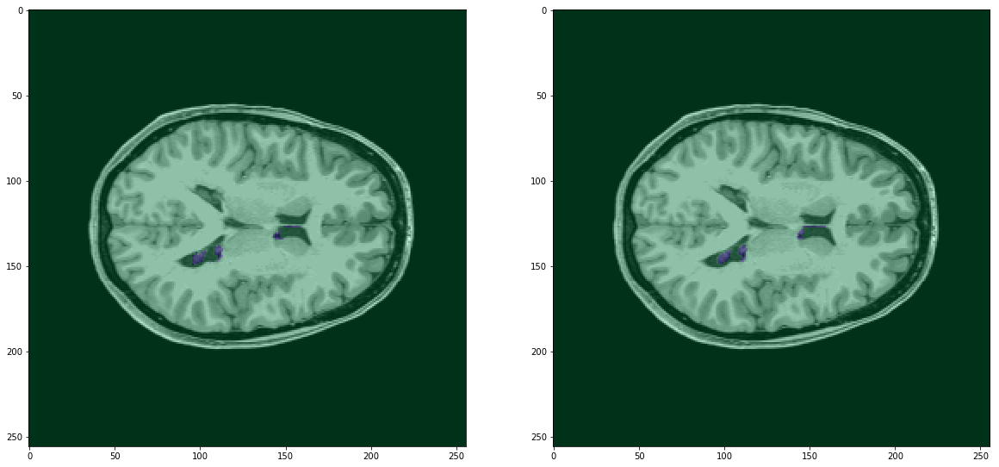

---------------------------------------------------------------------------
Grund Truth				Prediction


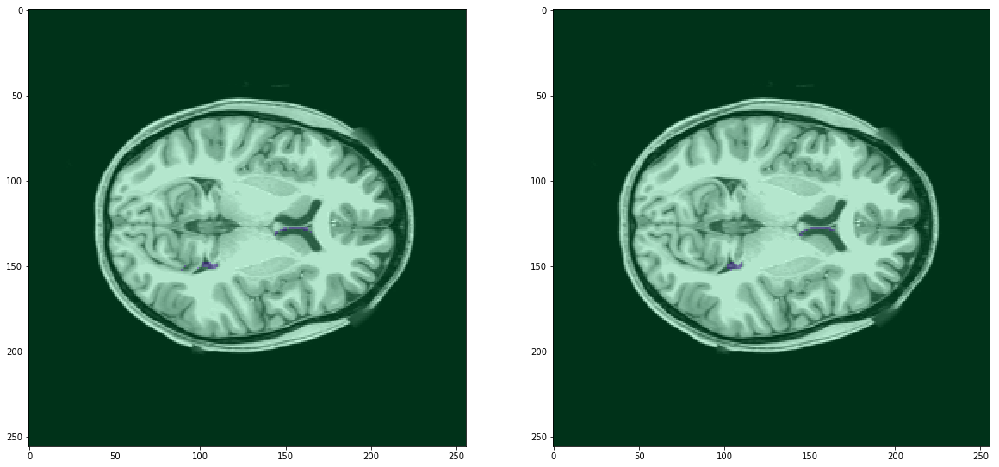

---------------------------------------------------------------------------
Grund Truth				Prediction


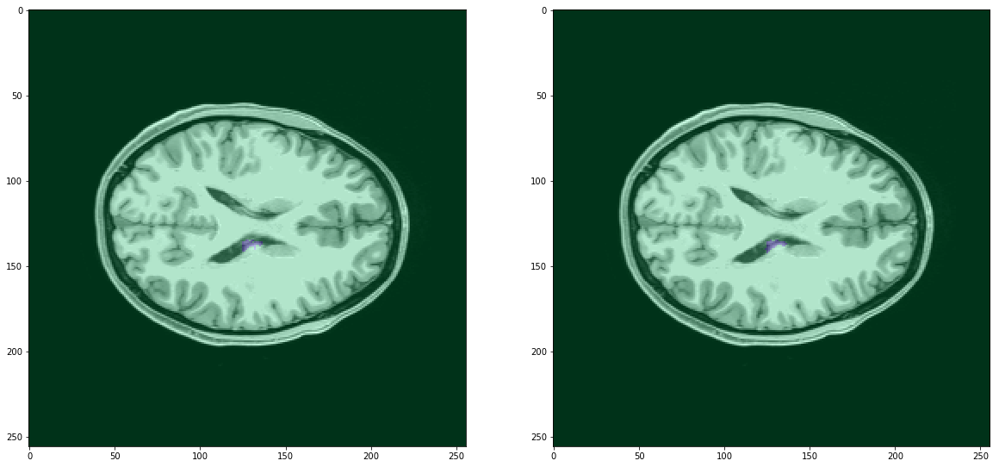

---------------------------------------------------------------------------
Grund Truth				Prediction


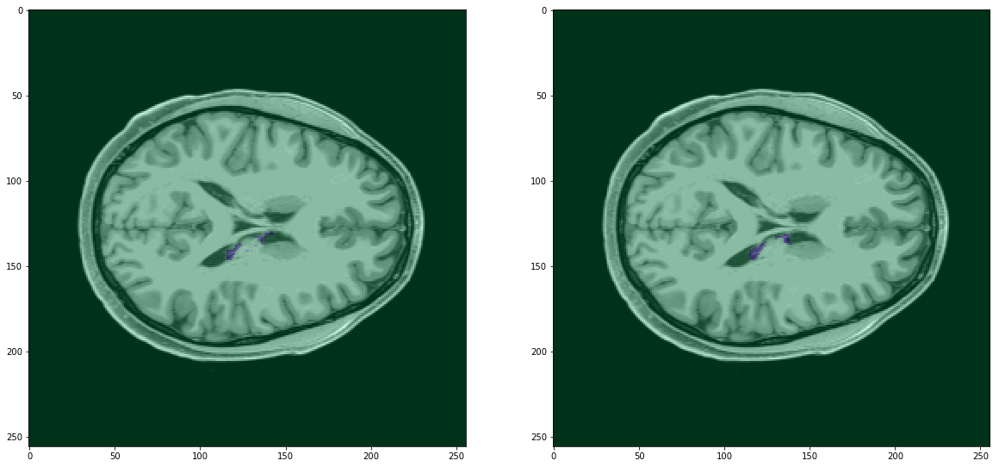

---------------------------------------------------------------------------
Grund Truth				Prediction


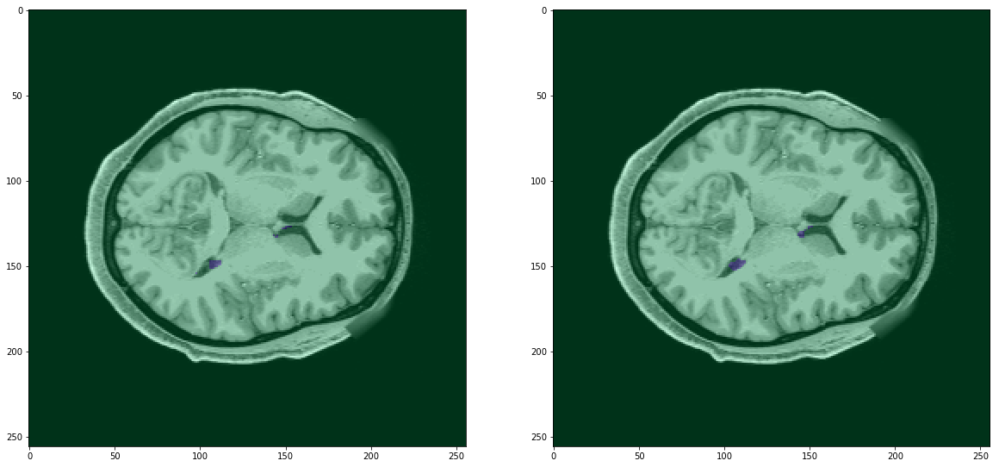

---------------------------------------------------------------------------
Grund Truth				Prediction


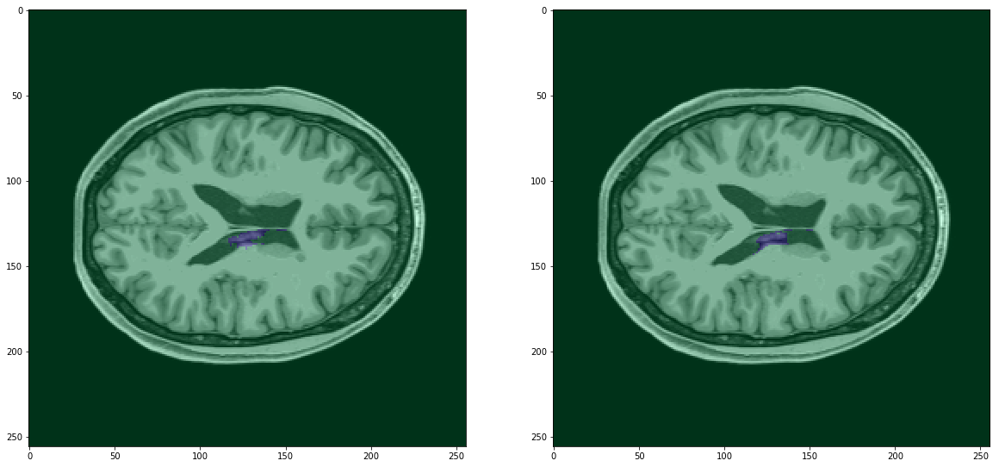

---------------------------------------------------------------------------
Grund Truth				Prediction


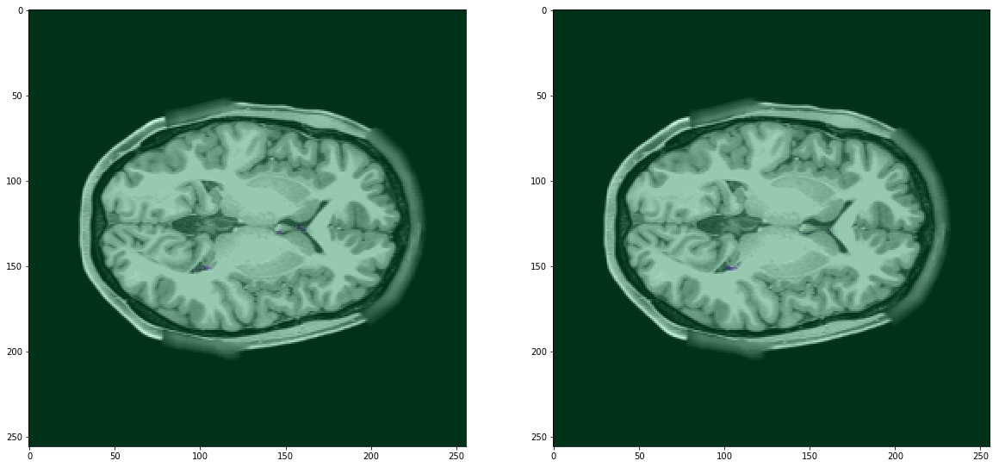

---------------------------------------------------------------------------
Grund Truth				Prediction


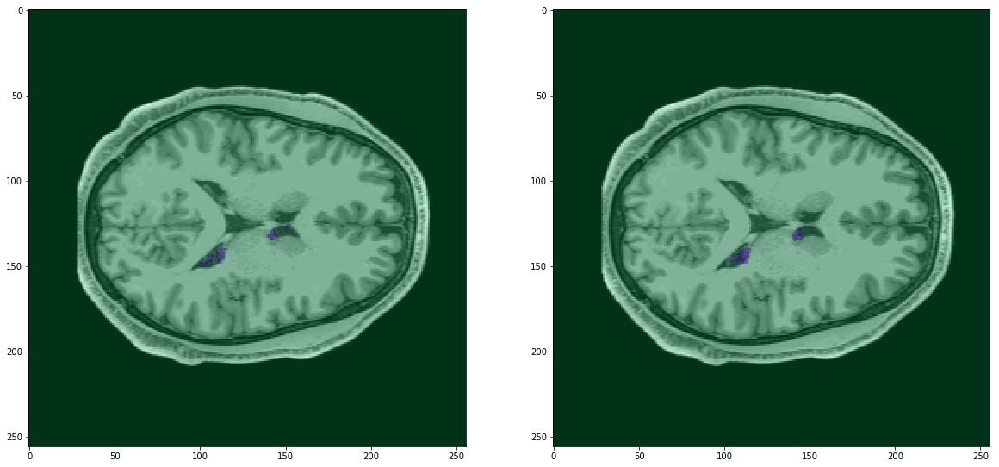

---------------------------------------------------------------------------
Grund Truth				Prediction


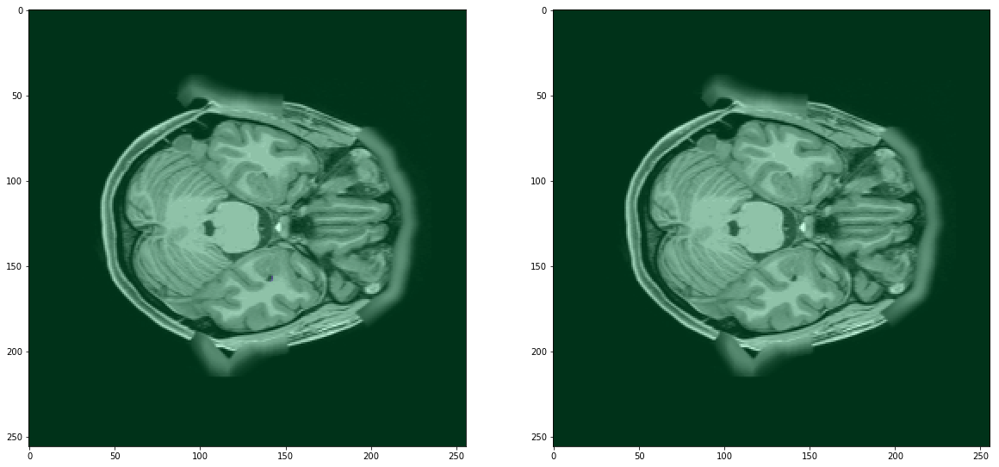

---------------------------------------------------------------------------
Grund Truth				Prediction


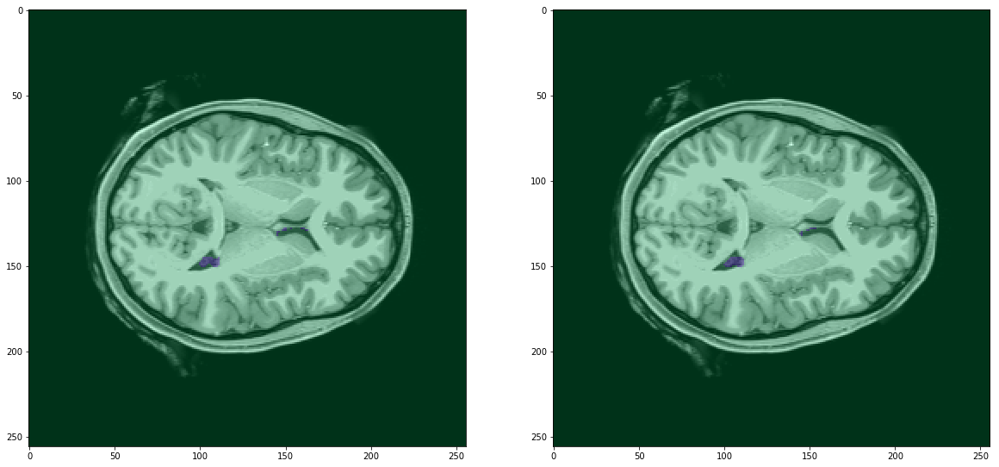

---------------------------------------------------------------------------
Grund Truth				Prediction


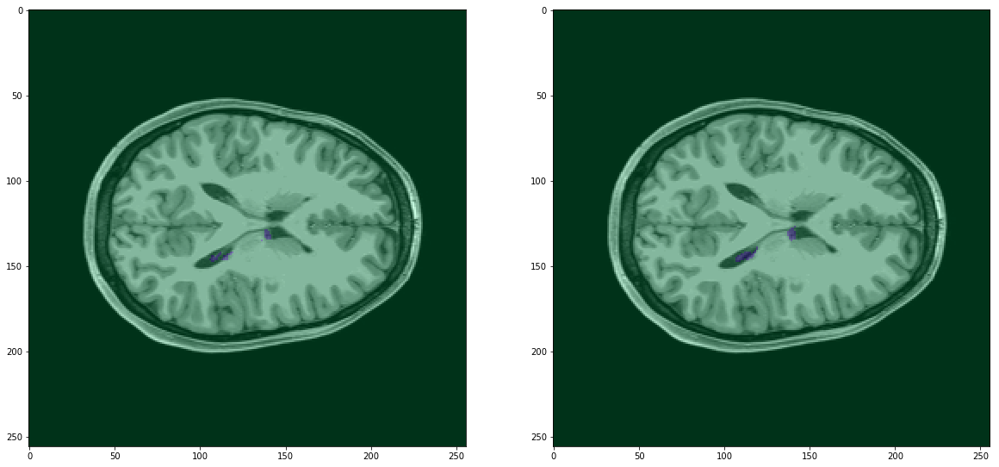

---------------------------------------------------------------------------
Grund Truth				Prediction


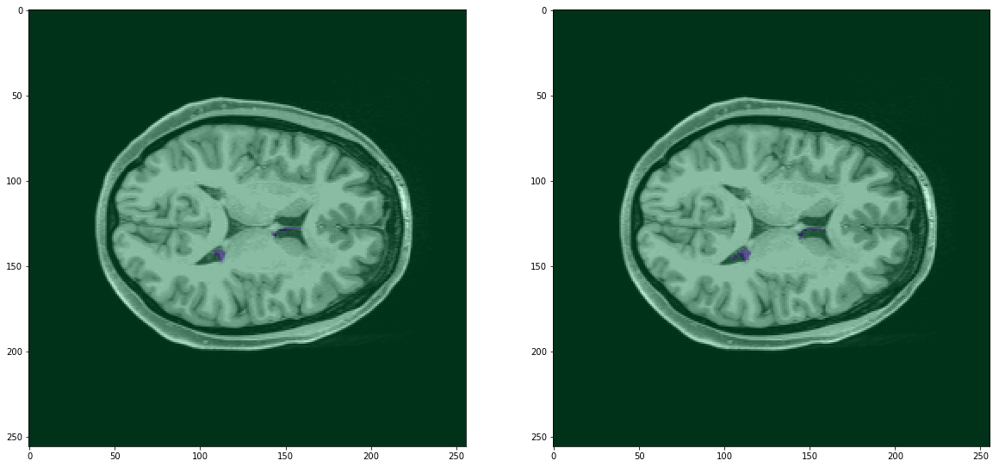

---------------------------------------------------------------------------
Grund Truth				Prediction


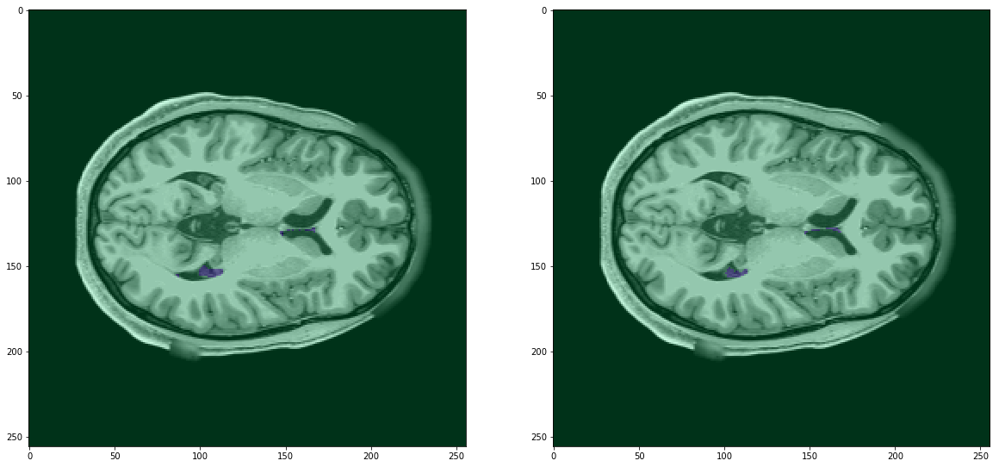

---------------------------------------------------------------------------
Grund Truth				Prediction


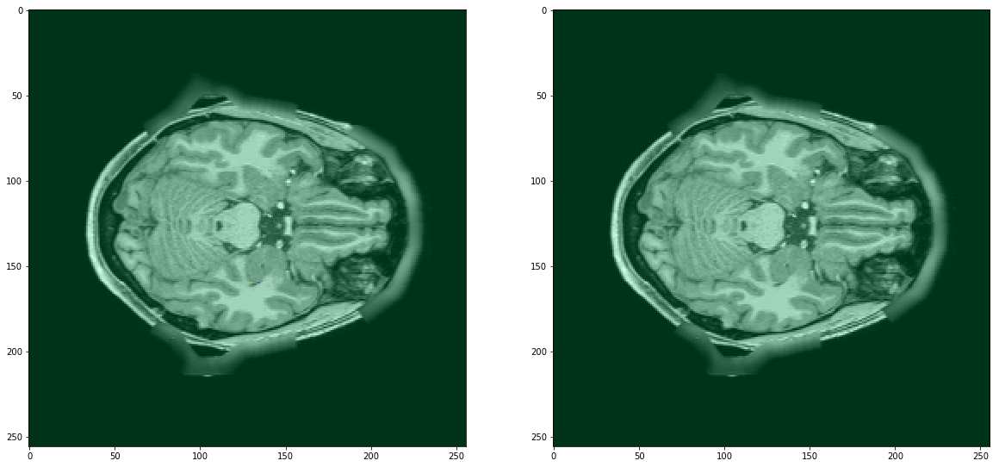

---------------------------------------------------------------------------


In [69]:
viz_given_seg(19)

Grund Truth				Prediction


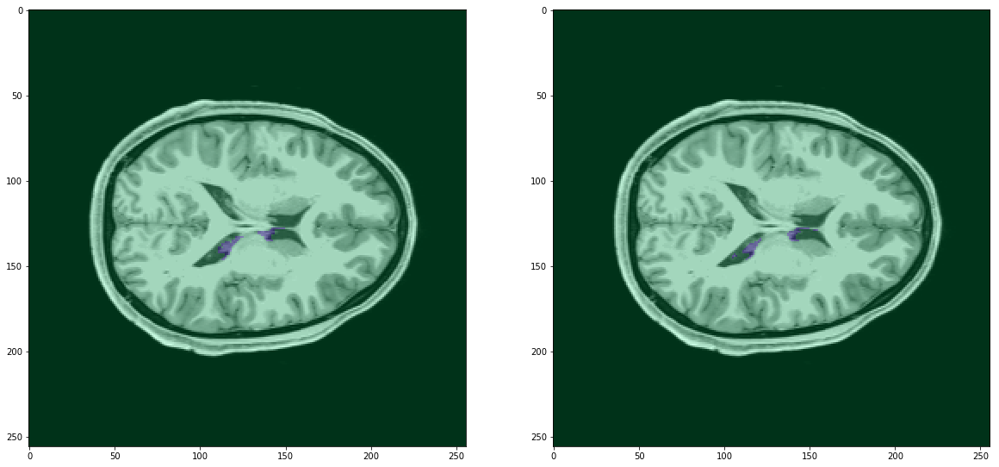

---------------------------------------------------------------------------
Grund Truth				Prediction


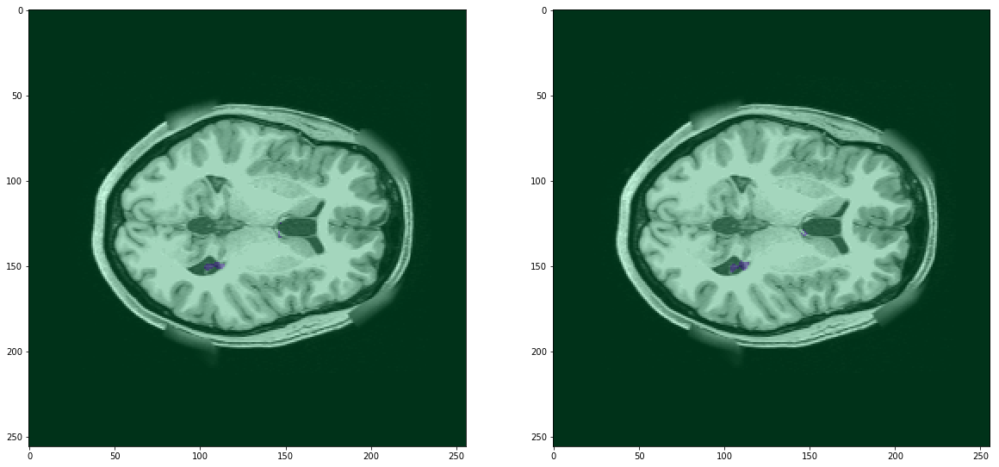

---------------------------------------------------------------------------
Grund Truth				Prediction


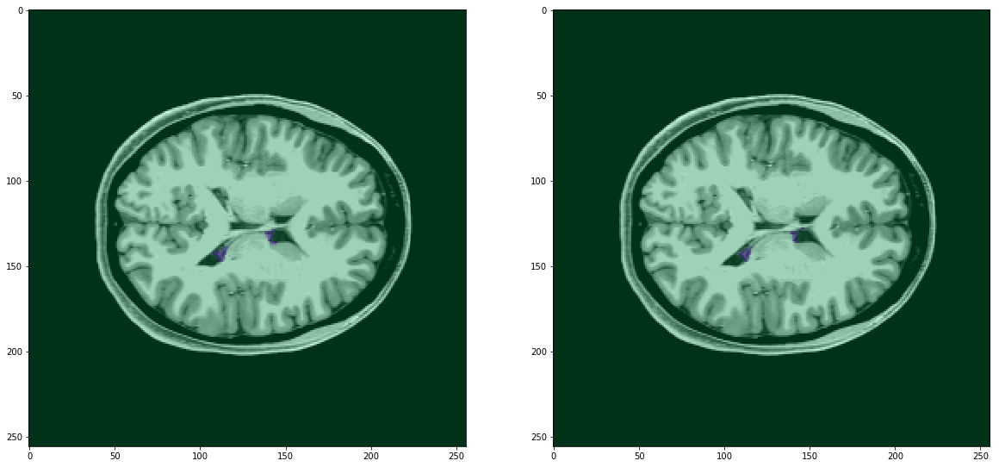

---------------------------------------------------------------------------
Grund Truth				Prediction


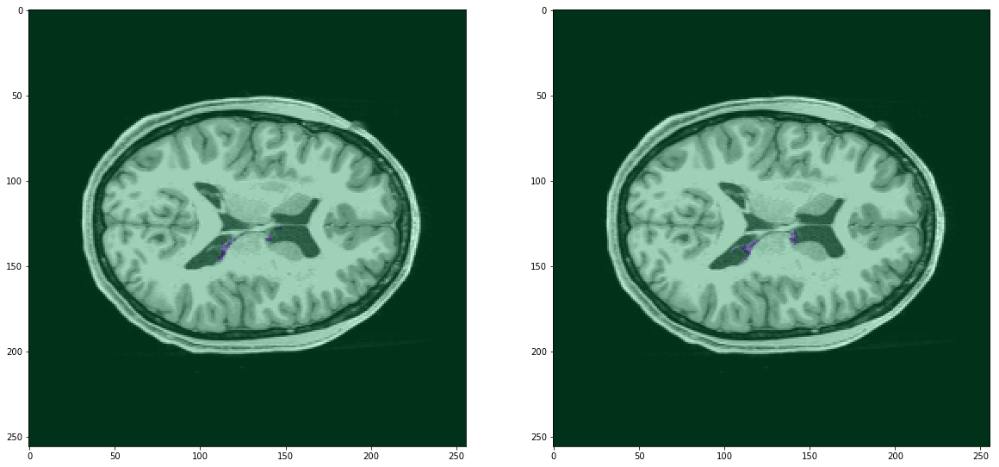

---------------------------------------------------------------------------
Grund Truth				Prediction


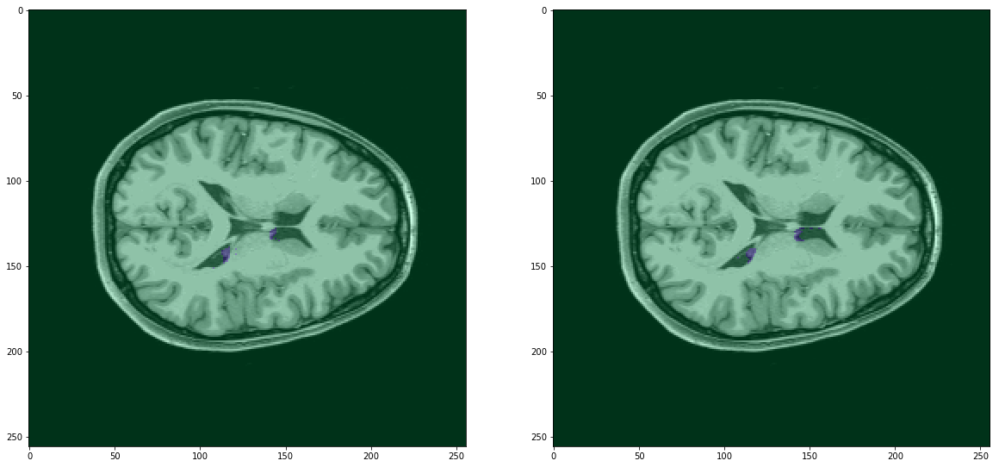

---------------------------------------------------------------------------
Grund Truth				Prediction


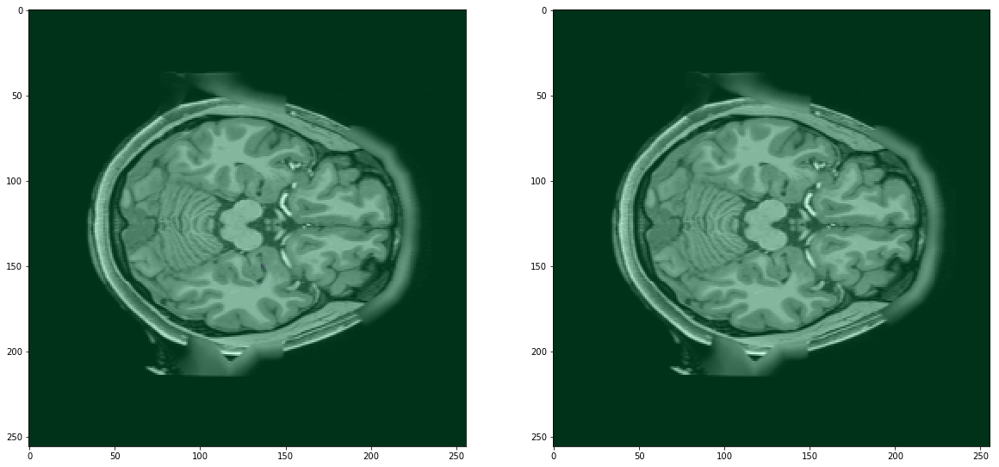

---------------------------------------------------------------------------
Grund Truth				Prediction


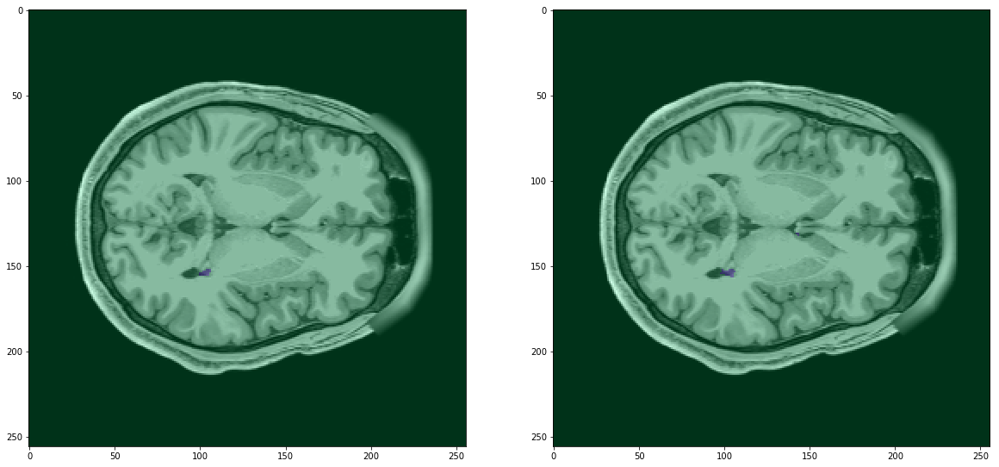

---------------------------------------------------------------------------
Grund Truth				Prediction


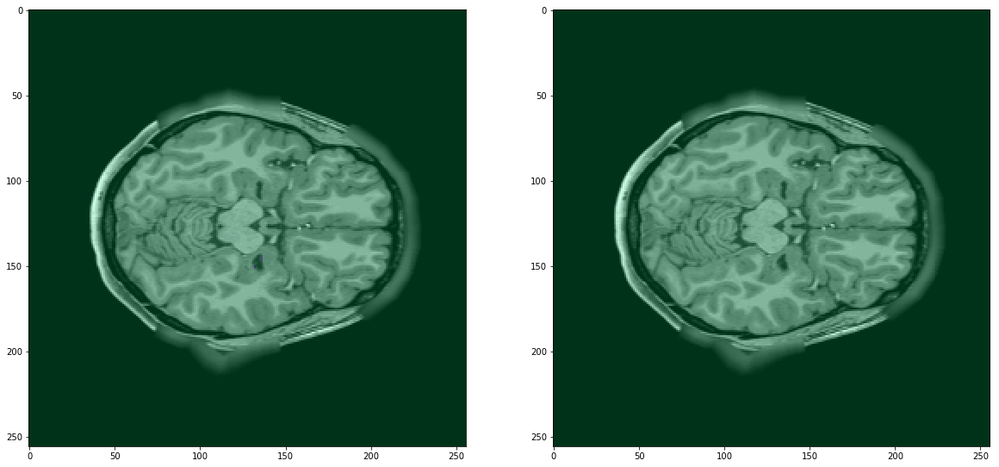

---------------------------------------------------------------------------
Grund Truth				Prediction


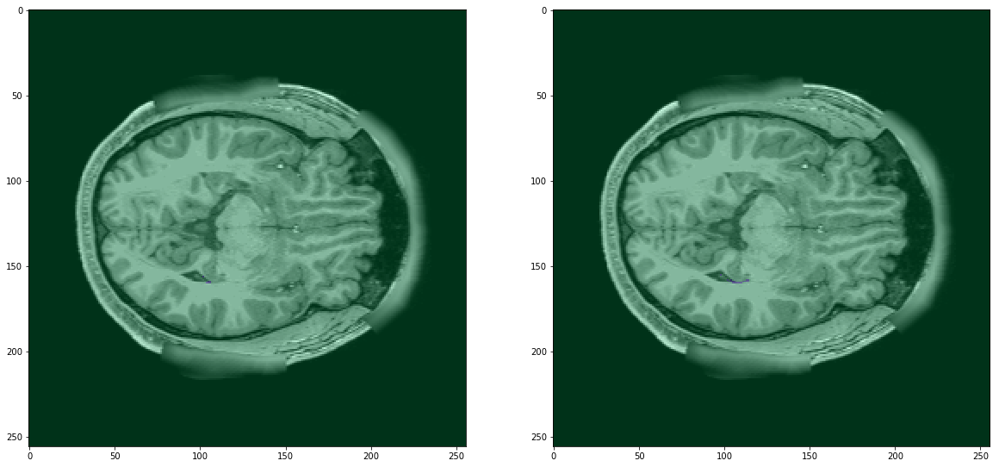

---------------------------------------------------------------------------
Grund Truth				Prediction


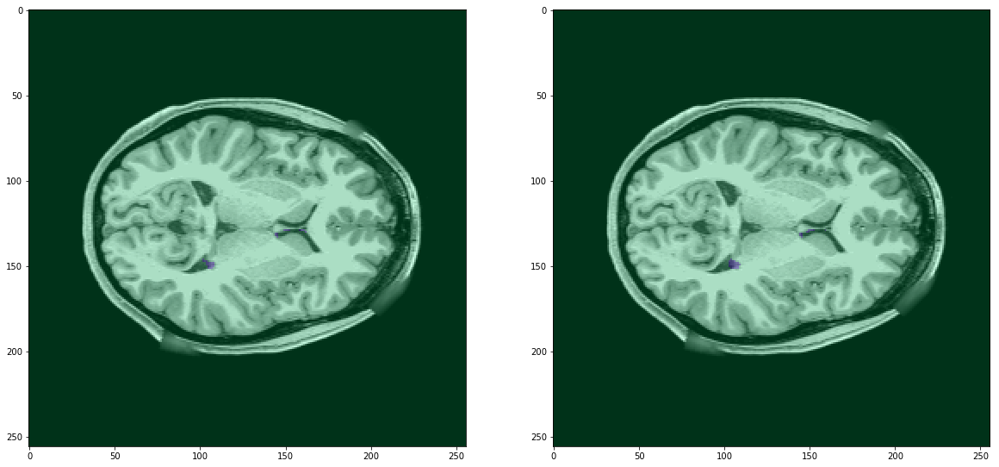

---------------------------------------------------------------------------
Grund Truth				Prediction


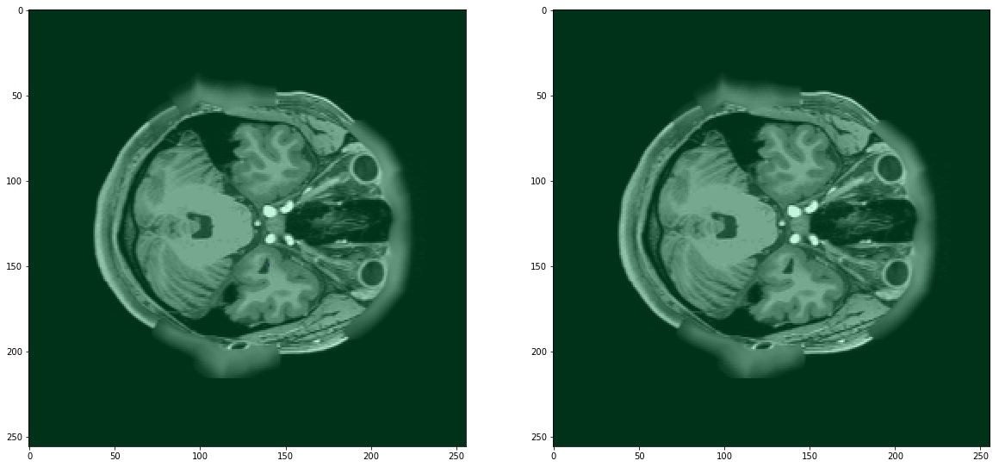

---------------------------------------------------------------------------
Grund Truth				Prediction


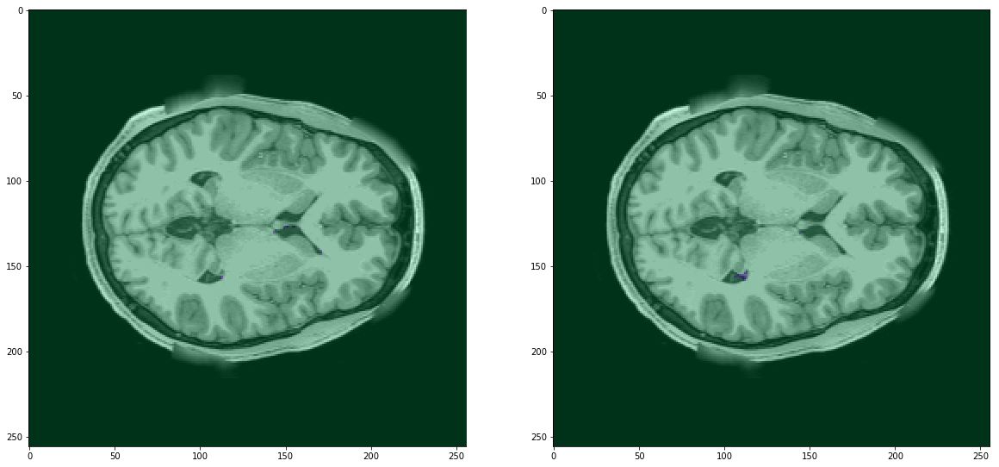

---------------------------------------------------------------------------
Grund Truth				Prediction


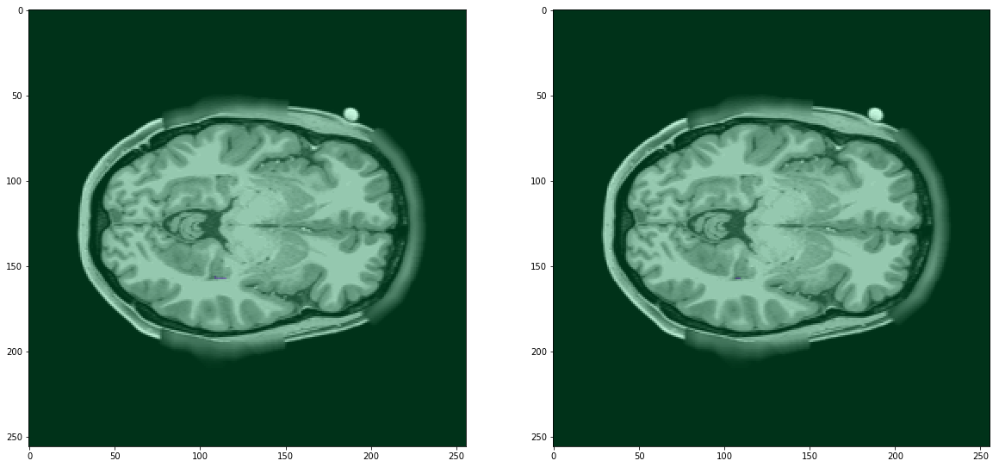

---------------------------------------------------------------------------
Grund Truth				Prediction


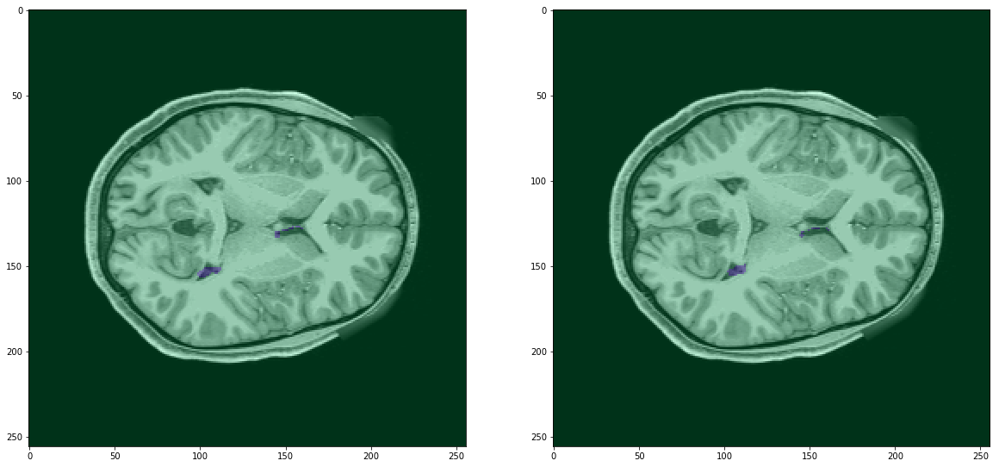

---------------------------------------------------------------------------
Grund Truth				Prediction


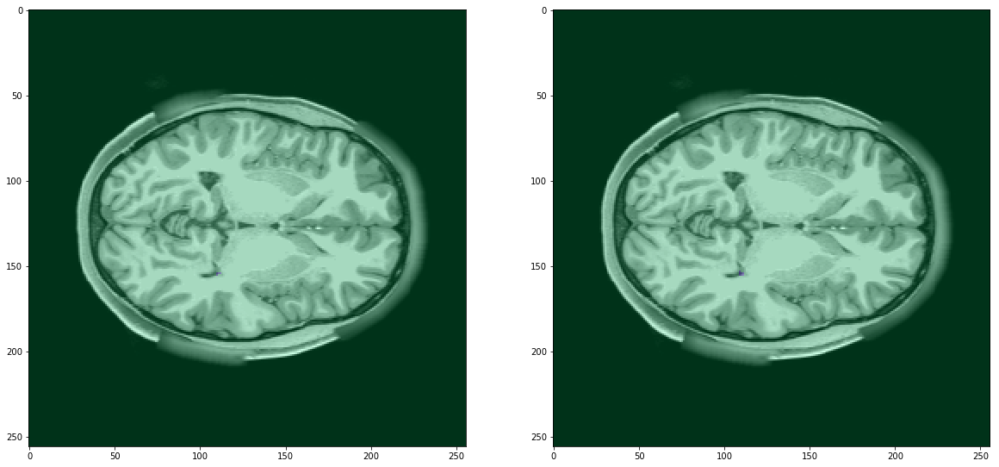

---------------------------------------------------------------------------
Grund Truth				Prediction


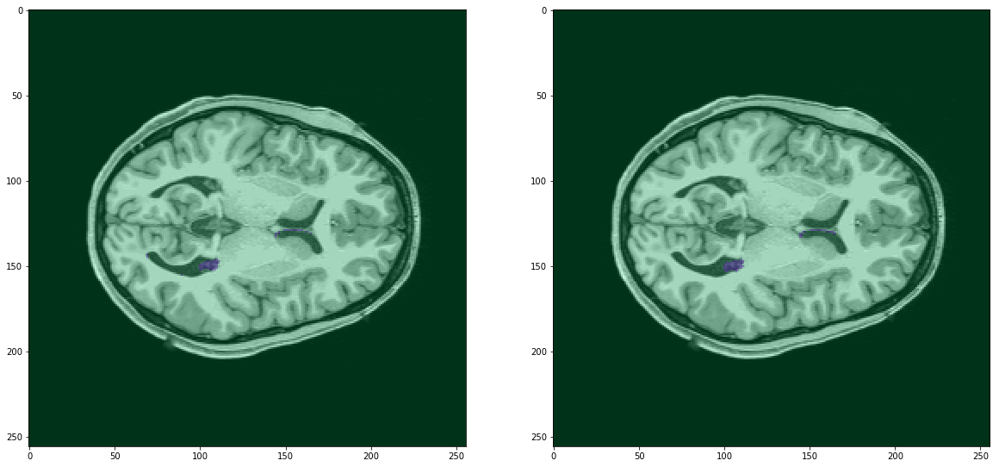

---------------------------------------------------------------------------
Grund Truth				Prediction


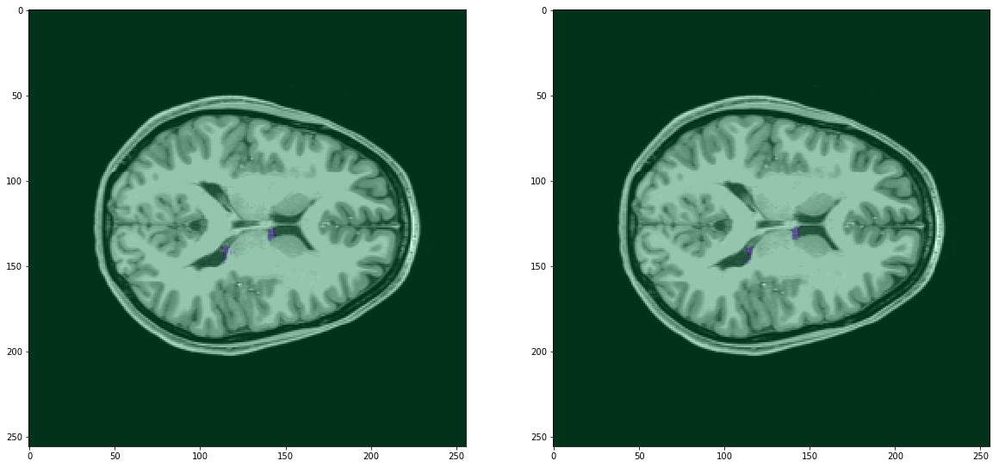

---------------------------------------------------------------------------


In [70]:
viz_given_seg(19)

In [71]:
rest_available.index(72)

36

# 5th Ventricle (72)

Grund Truth				Prediction


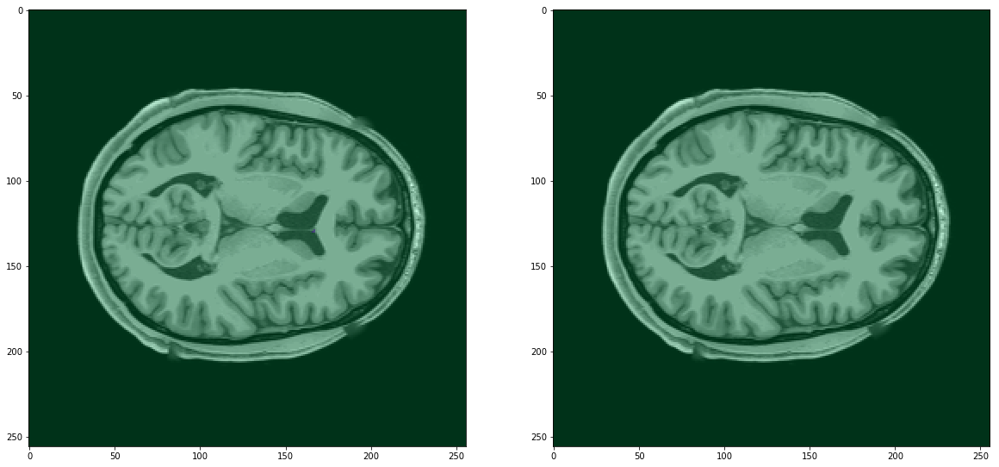

---------------------------------------------------------------------------
Grund Truth				Prediction


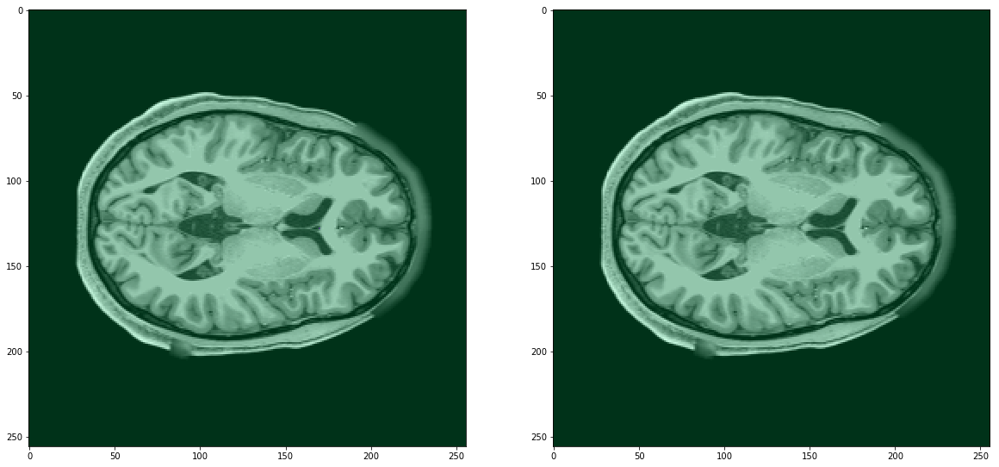

---------------------------------------------------------------------------


In [73]:
viz_given_seg(36)

Grund Truth				Prediction


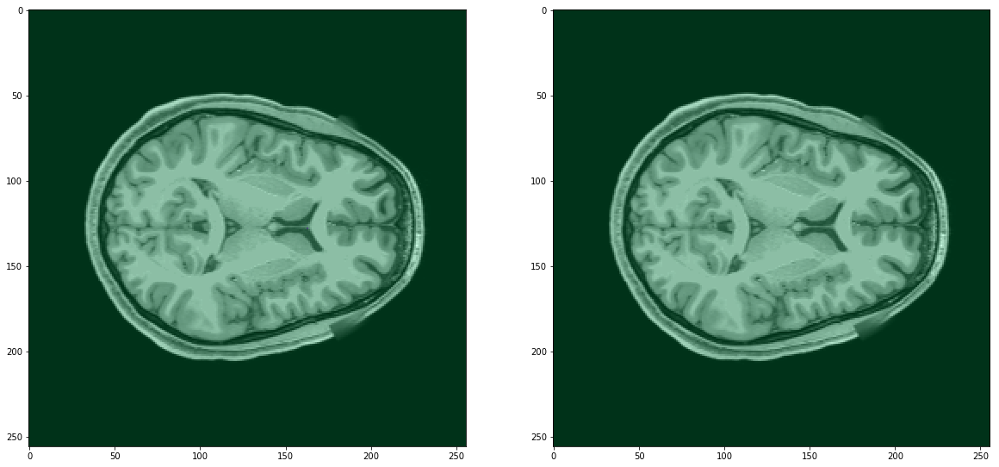

---------------------------------------------------------------------------


In [75]:
viz_given_seg(36)

Grund Truth				Prediction


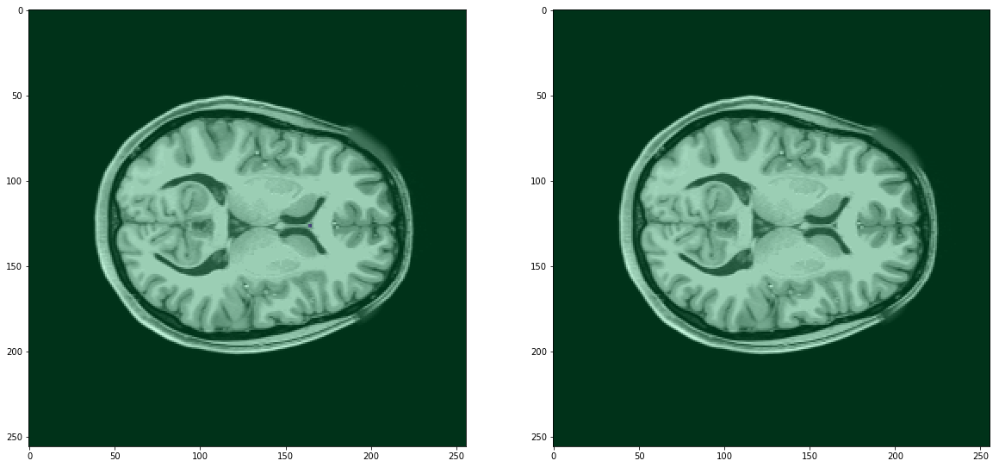

---------------------------------------------------------------------------
Grund Truth				Prediction


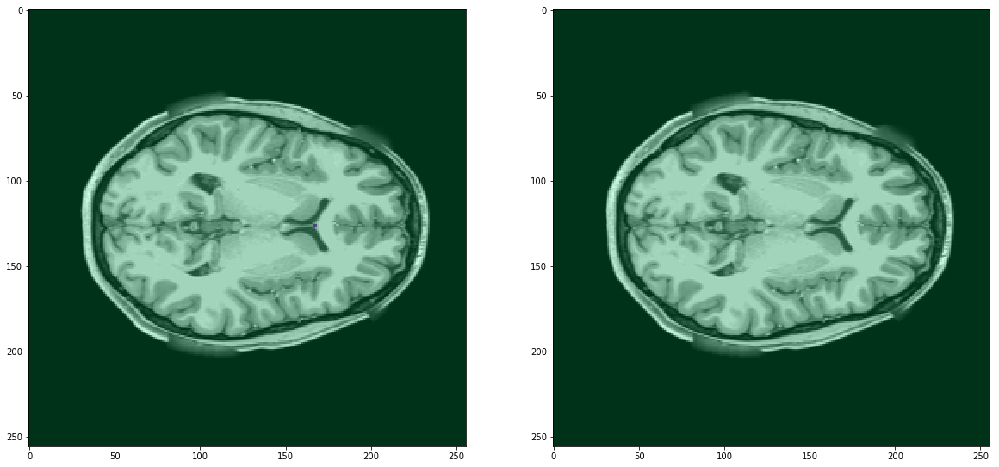

---------------------------------------------------------------------------


In [82]:
viz_given_seg(36)

Grund Truth				Prediction


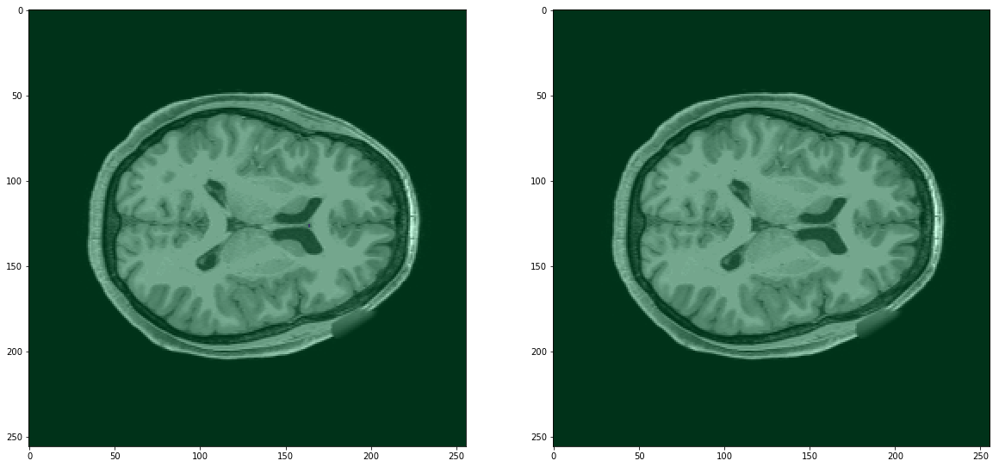

---------------------------------------------------------------------------


In [85]:
viz_given_seg(36)

In [86]:
rest_available.index(77)

37

Grund Truth				Prediction


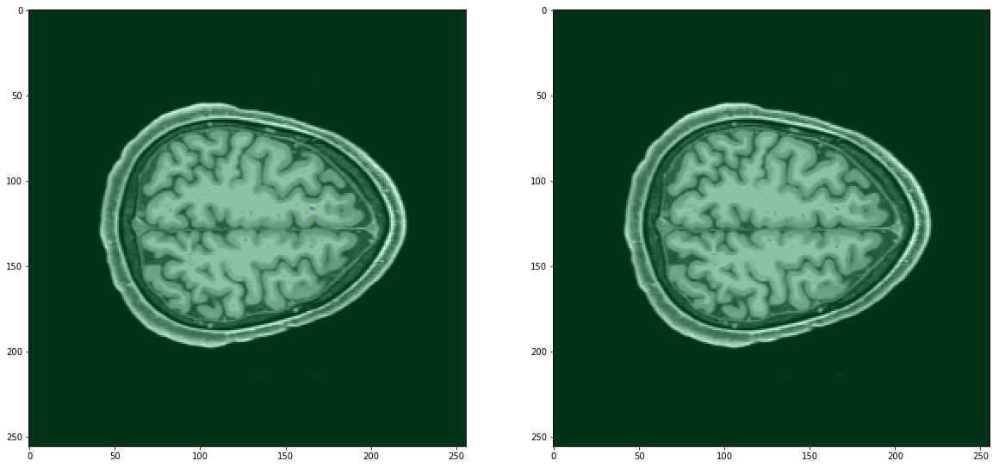

---------------------------------------------------------------------------
Grund Truth				Prediction


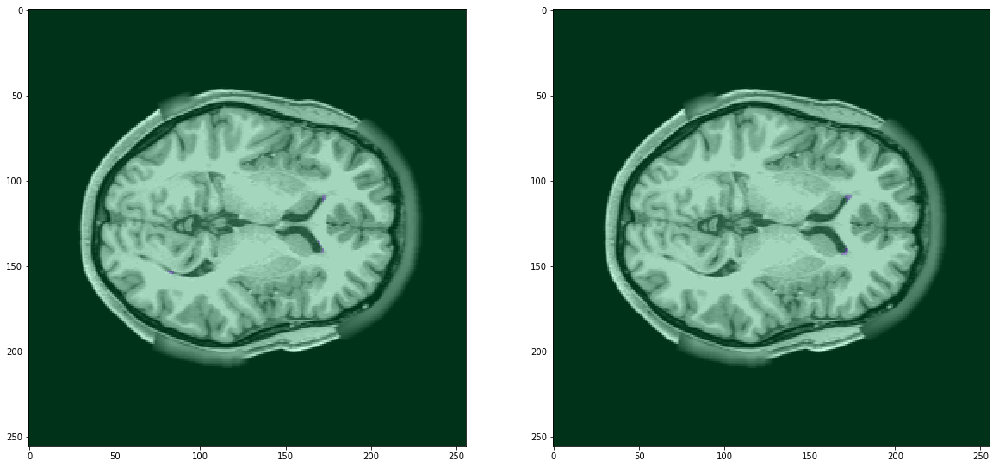

---------------------------------------------------------------------------
Grund Truth				Prediction


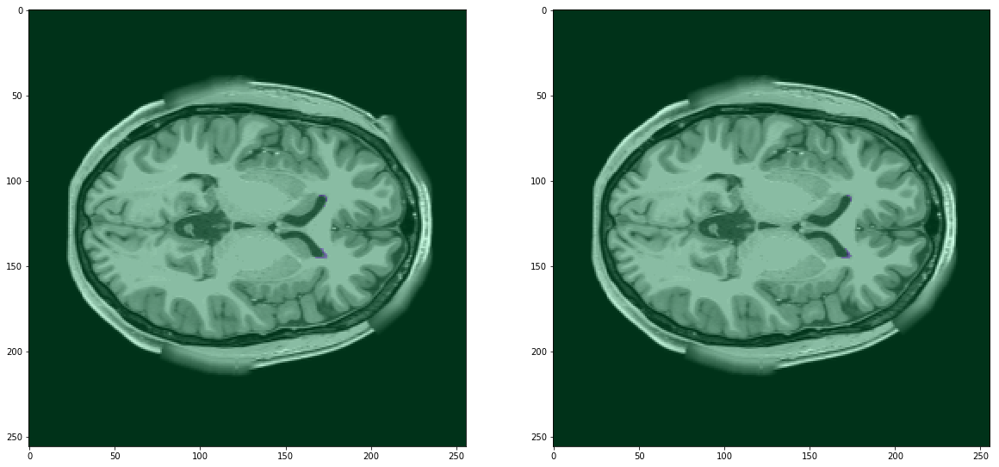

---------------------------------------------------------------------------
Grund Truth				Prediction


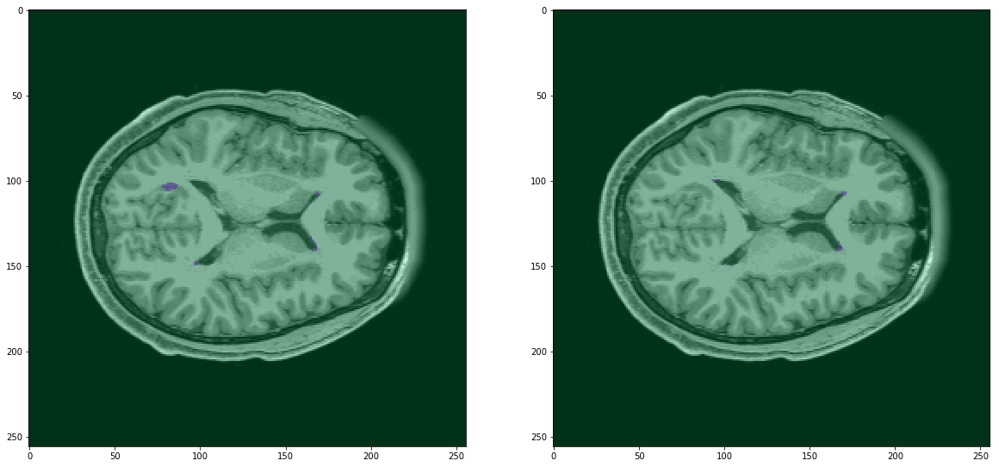

---------------------------------------------------------------------------
Grund Truth				Prediction


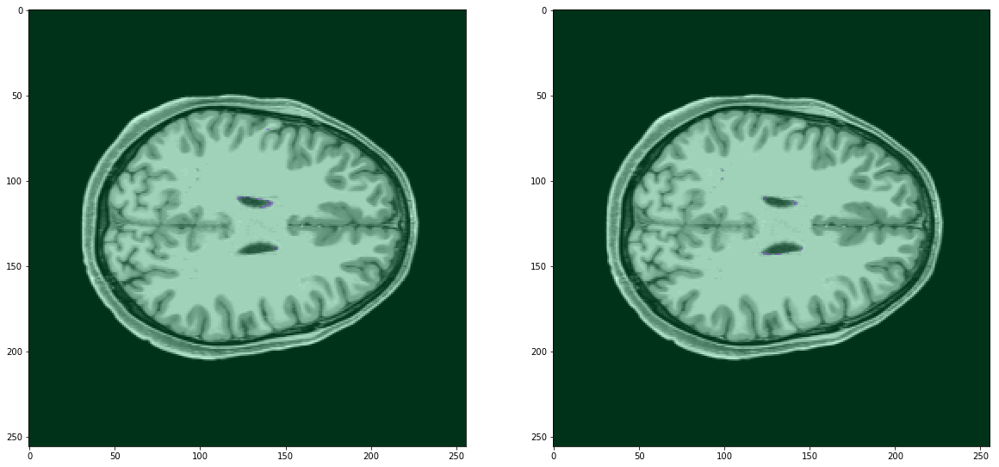

---------------------------------------------------------------------------
Grund Truth				Prediction


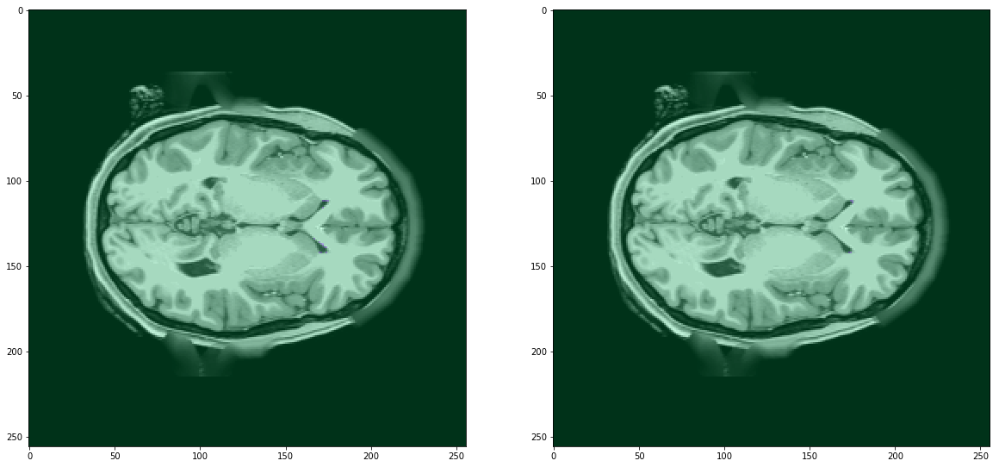

---------------------------------------------------------------------------
Grund Truth				Prediction


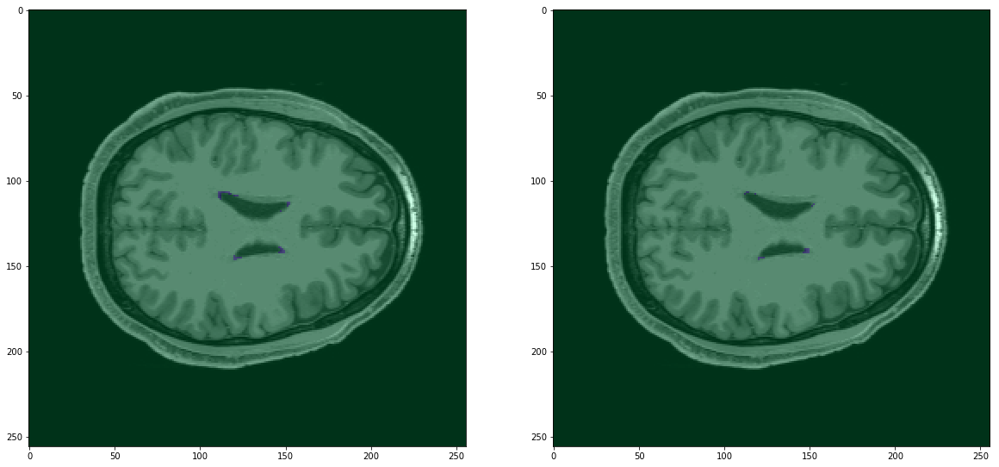

---------------------------------------------------------------------------
Grund Truth				Prediction


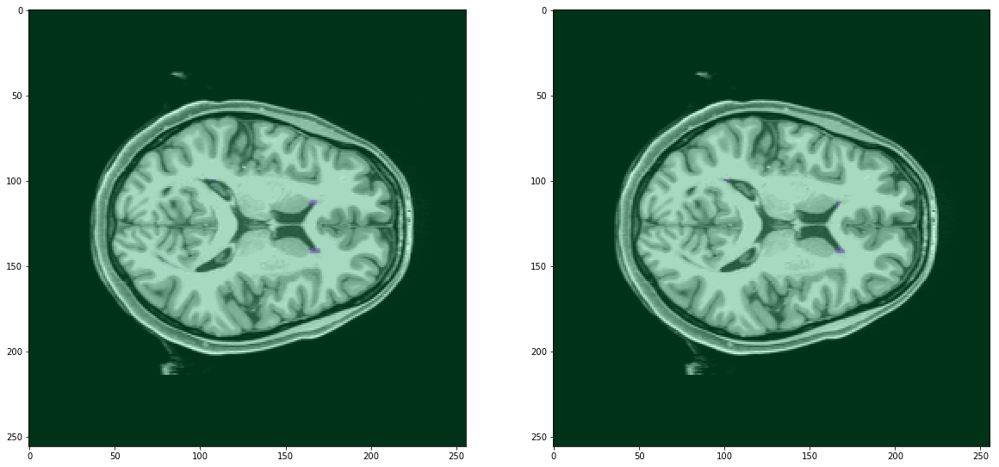

---------------------------------------------------------------------------
Grund Truth				Prediction


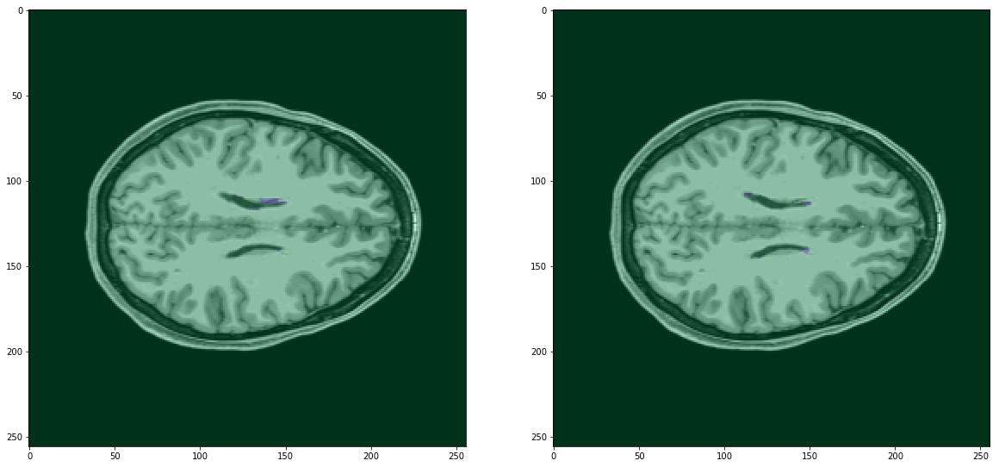

---------------------------------------------------------------------------
Grund Truth				Prediction


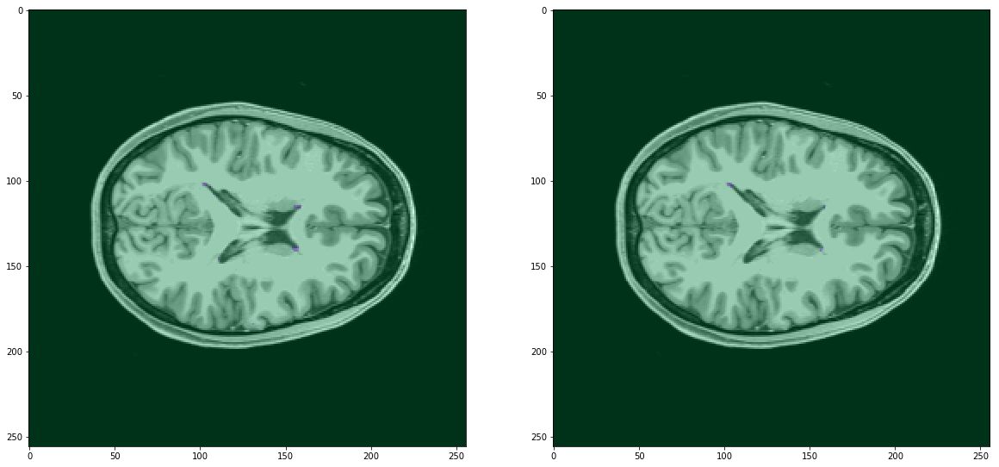

---------------------------------------------------------------------------
Grund Truth				Prediction


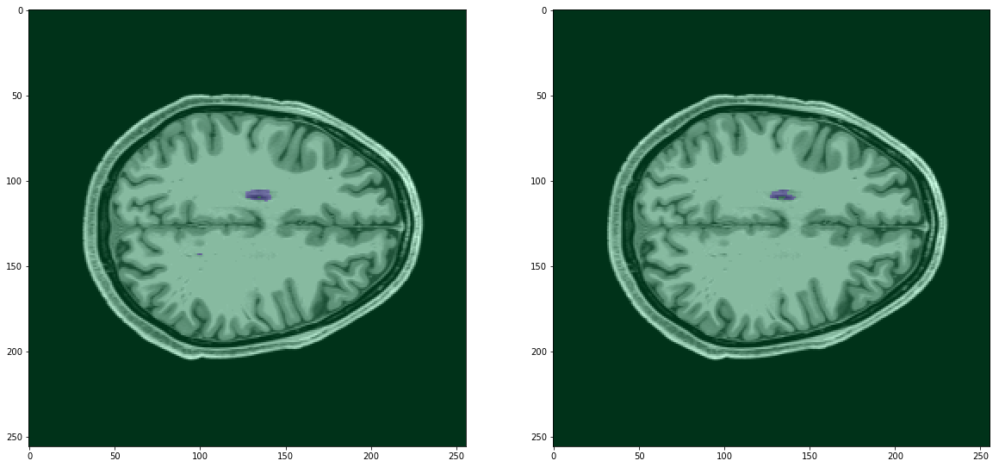

---------------------------------------------------------------------------
Grund Truth				Prediction


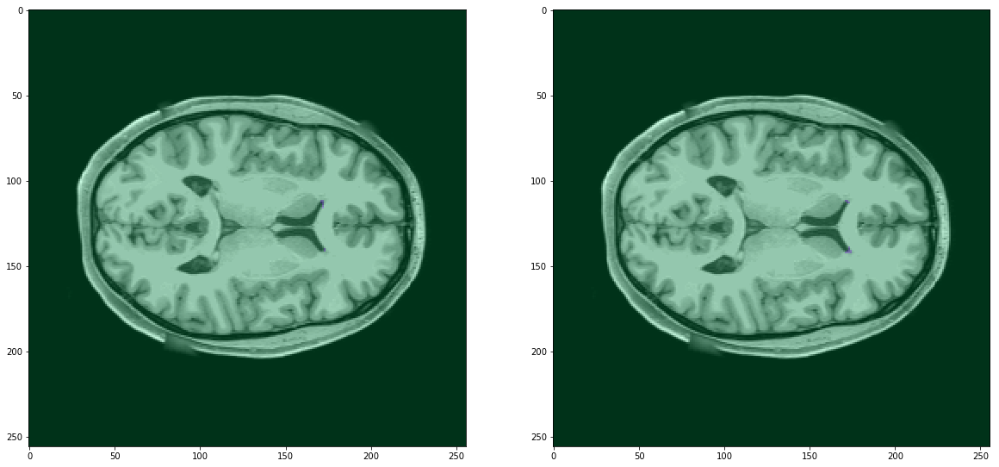

---------------------------------------------------------------------------
Grund Truth				Prediction


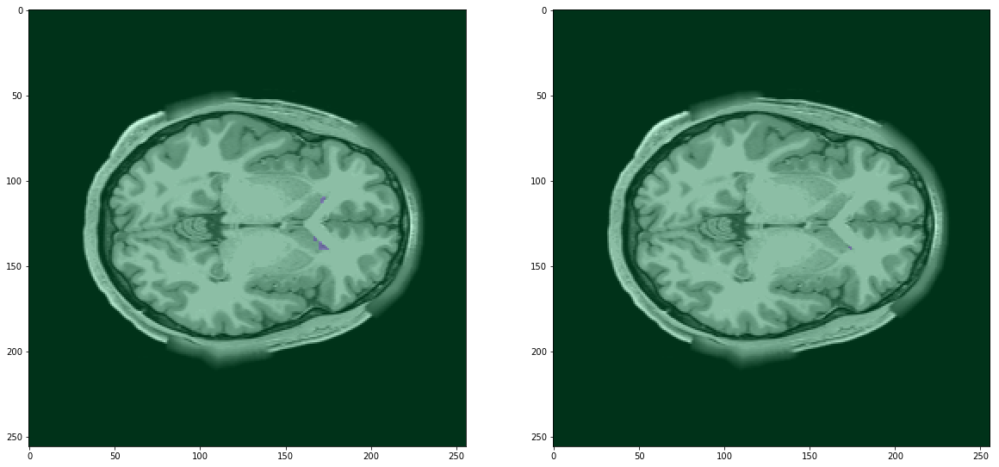

---------------------------------------------------------------------------
Grund Truth				Prediction


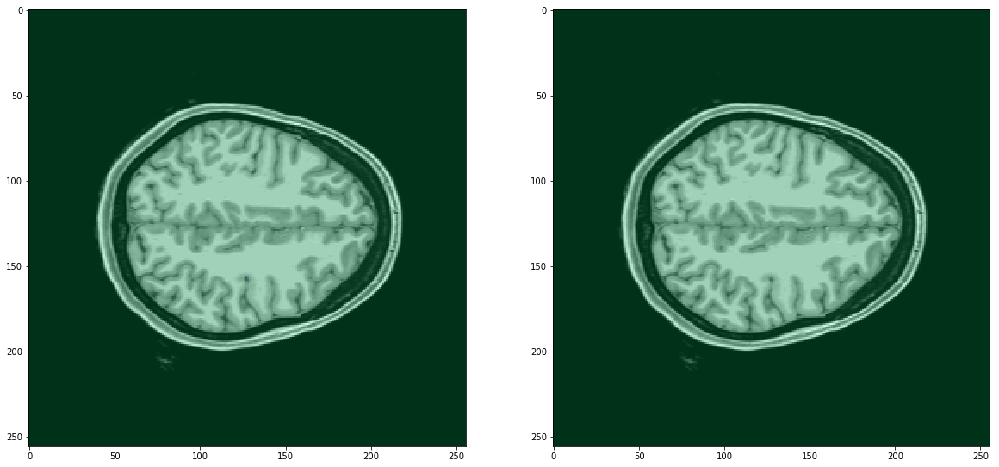

---------------------------------------------------------------------------
Grund Truth				Prediction


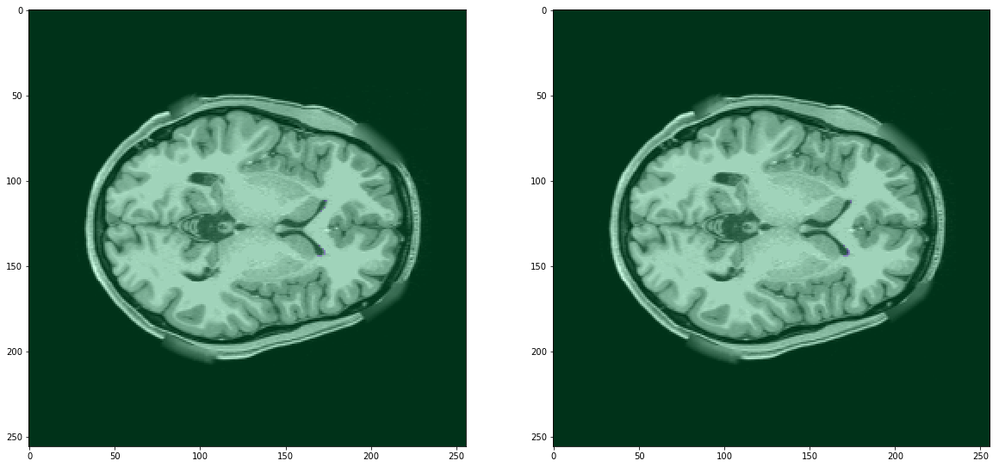

---------------------------------------------------------------------------
Grund Truth				Prediction


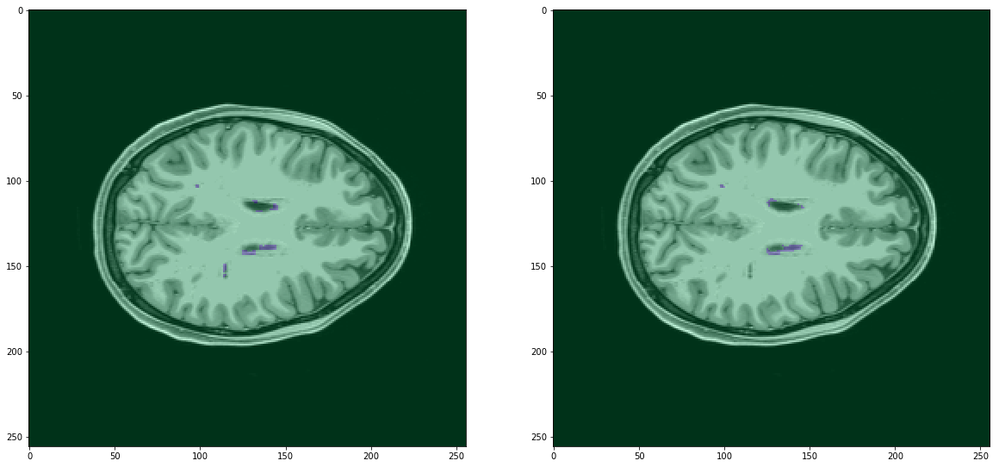

---------------------------------------------------------------------------


In [87]:
viz_given_seg(37)

# To be Ignored

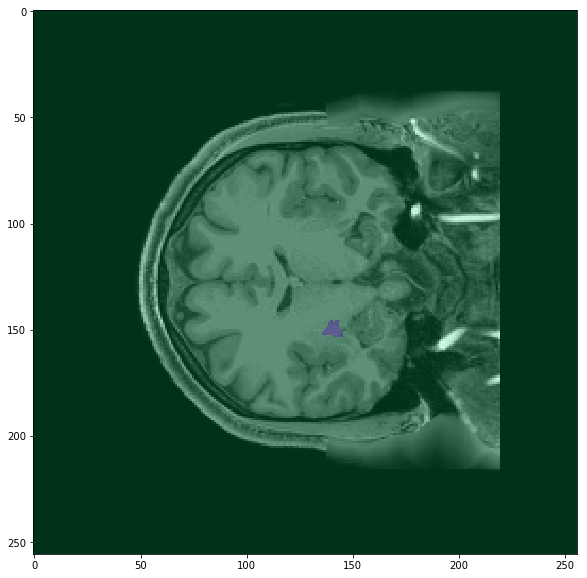

In [69]:
i=3
plt.figure(figsize=(10,10))
plt.imshow(x[i,0], cmap = 'gray')
# plt.imshow(pred[i,9],alpha=0.4, cmap = 'winter')
plt.imshow(y[i,9], alpha = 0.2, cmap = 'winter_r')

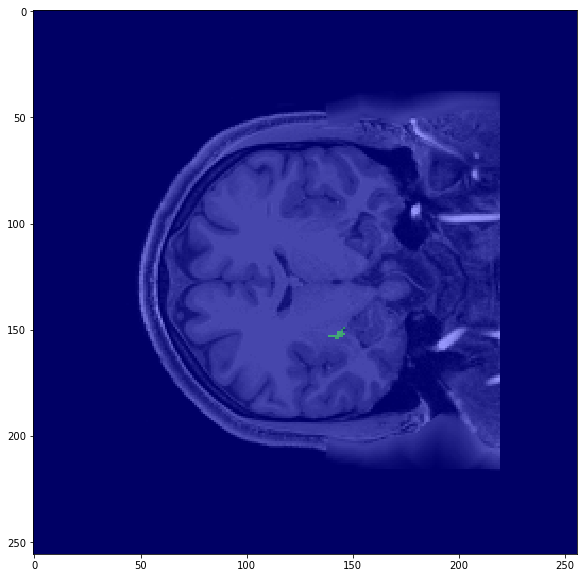

In [70]:
i=3
plt.figure(figsize=(10,10))
plt.imshow(x[i,0], cmap = 'gray')
plt.imshow(pred[i,9],alpha=0.4, cmap = 'winter')
# plt.imshow(y[i,9], alpha = 0.2, cmap = 'winter_r')

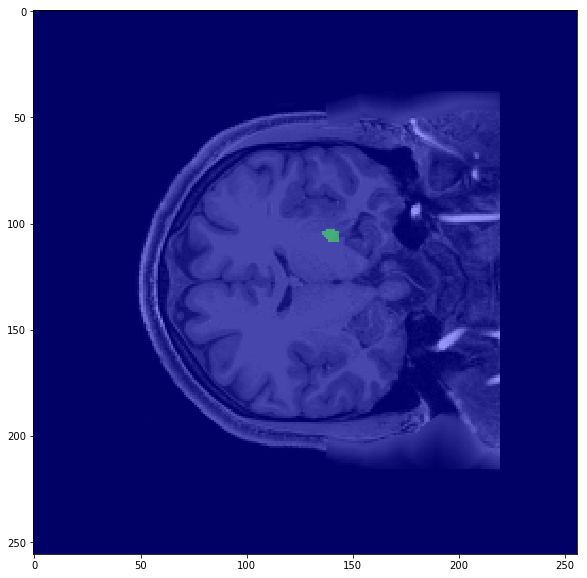

In [71]:
i=3
plt.figure(figsize=(10,10))
plt.imshow(x[i,0], cmap = 'gray')
plt.imshow(pred[i,29],alpha=0.4, cmap = 'winter')
# plt.imshow(y[i,9], alpha = 0.2, cmap = 'winter_r')

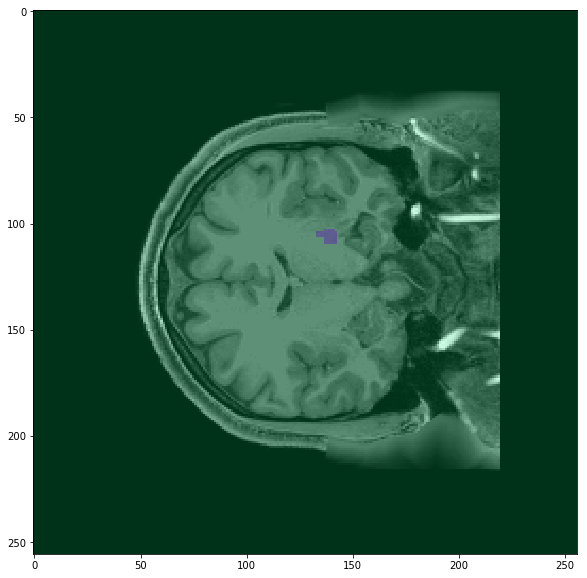

In [72]:
i=3
plt.figure(figsize=(10,10))
plt.imshow(x[i,0], cmap = 'gray')
# plt.imshow(pred[i,9],alpha=0.4, cmap = 'winter')
plt.imshow(y[i,29], alpha = 0.2, cmap = 'winter_r')

In [26]:
y.shape

(10, 46, 256, 256)

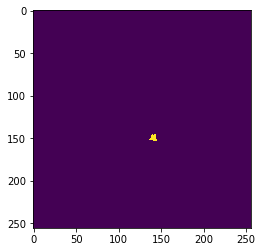

In [27]:
plt.imshow(y[i,9])

In [ ]:
plt

In [42]:
import pickle
backfront = pickle.load(open("back_front_model3_dicescores",'rb'))

In [43]:
leftright = pickle.load(open("left_right_model1_2_dicescores",'rb'))

In [44]:
topbottom = pickle.load(open("exp_2_dnc_then_d_lr_5e-5_dicescores",'rb'))

In [45]:
bf_tb = backfront-topbottom

In [46]:
import matplotlib.pyplot as plt

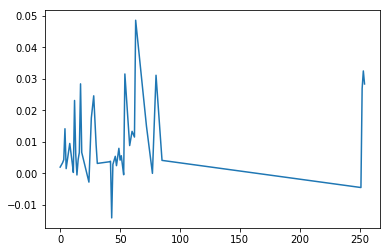

In [47]:
plt.plot(available_segments[:-1],bf_tb)

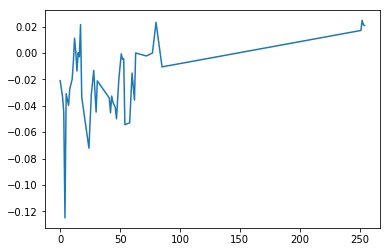

In [53]:
plt.plot(available_segments[:-1],leftright-topbottom)

In [ ]:
plt.plot(leftright-topbottom)
plt.xticks(available_segments[:-1])
plt.show()

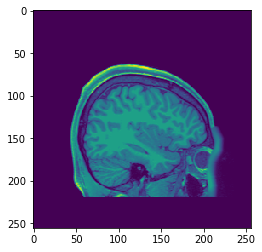

In [137]:
plt.imshow(x[0,0])

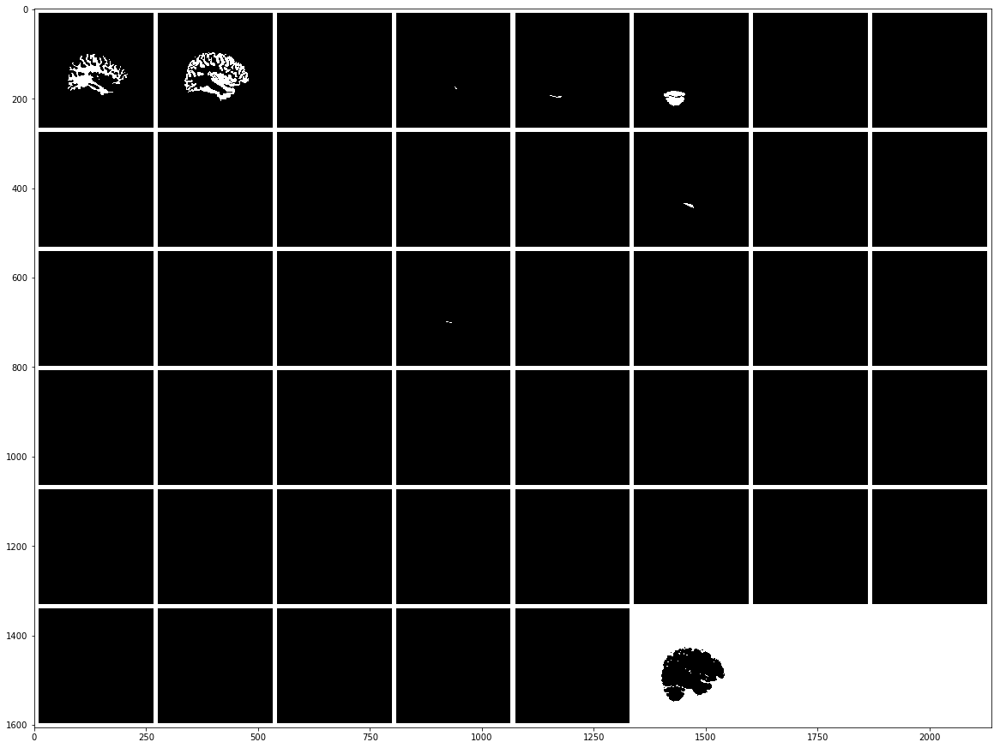

In [138]:
bcd = torch.from_numpy(y[0,:,:,:].reshape(46,1,256,256))
show(make_grid(bcd,padding=10,pad_value=1))

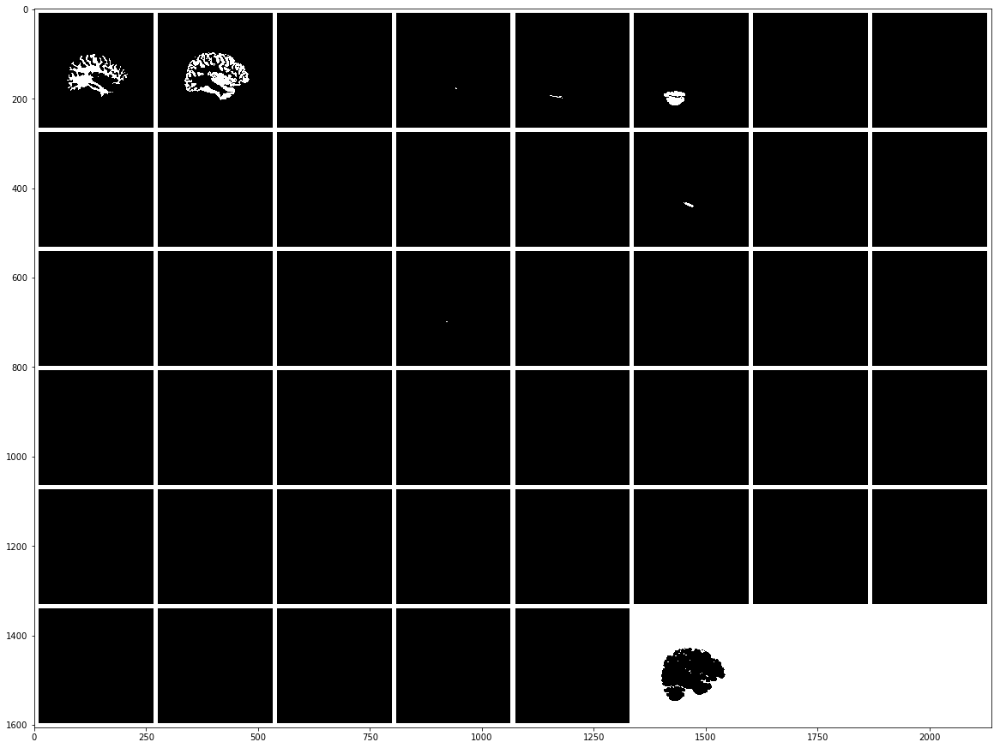

In [139]:
show(make_grid(torch.from_numpy(pred[0,:,:,:].reshape(46,1,256,256)),padding=10,pad_value=1))


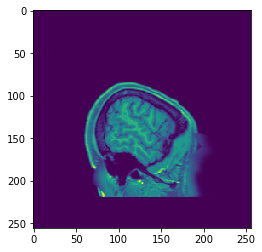

In [133]:
plt.imshow(x[0,0])

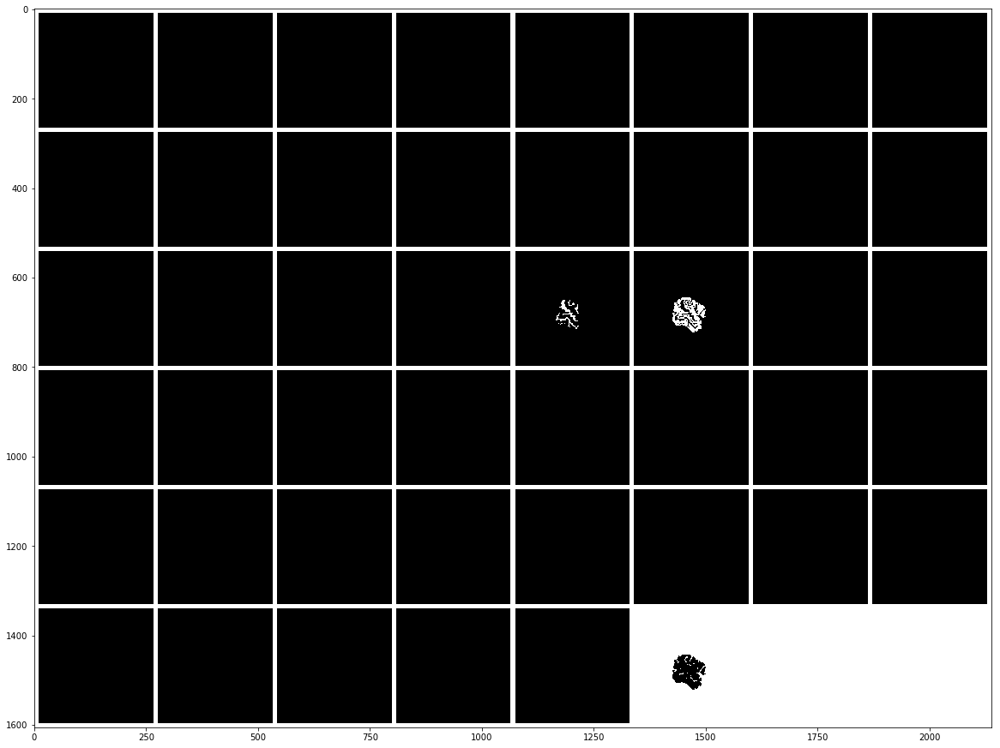

In [134]:
bcd = torch.from_numpy(y[0,:,:,:].reshape(46,1,256,256))
show(make_grid(bcd,padding=10,pad_value=1))

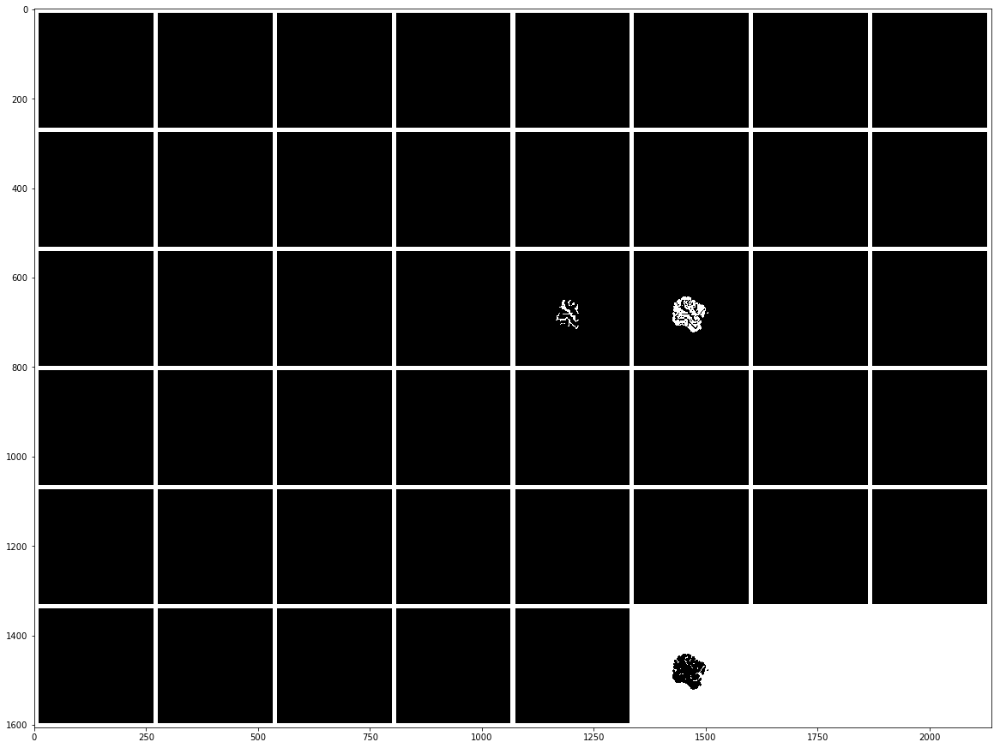

In [135]:
show(make_grid(torch.from_numpy(pred[0,:,:,:].reshape(46,1,256,256)),padding=10,pad_value=1))


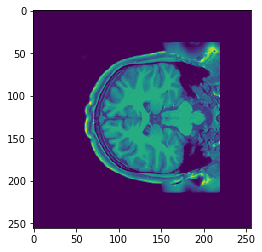

In [122]:
plt.imshow(x[0,0])

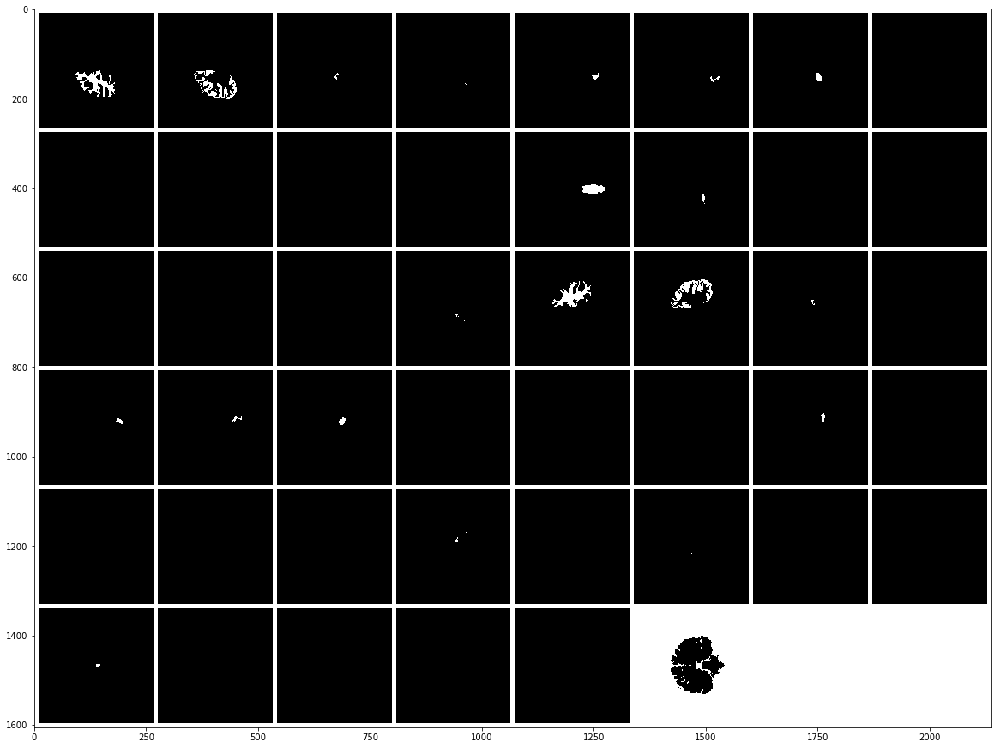

In [123]:
bcd = torch.from_numpy(y[0,:,:,:].reshape(46,1,256,256))
show(make_grid(bcd,padding=10,pad_value=1))

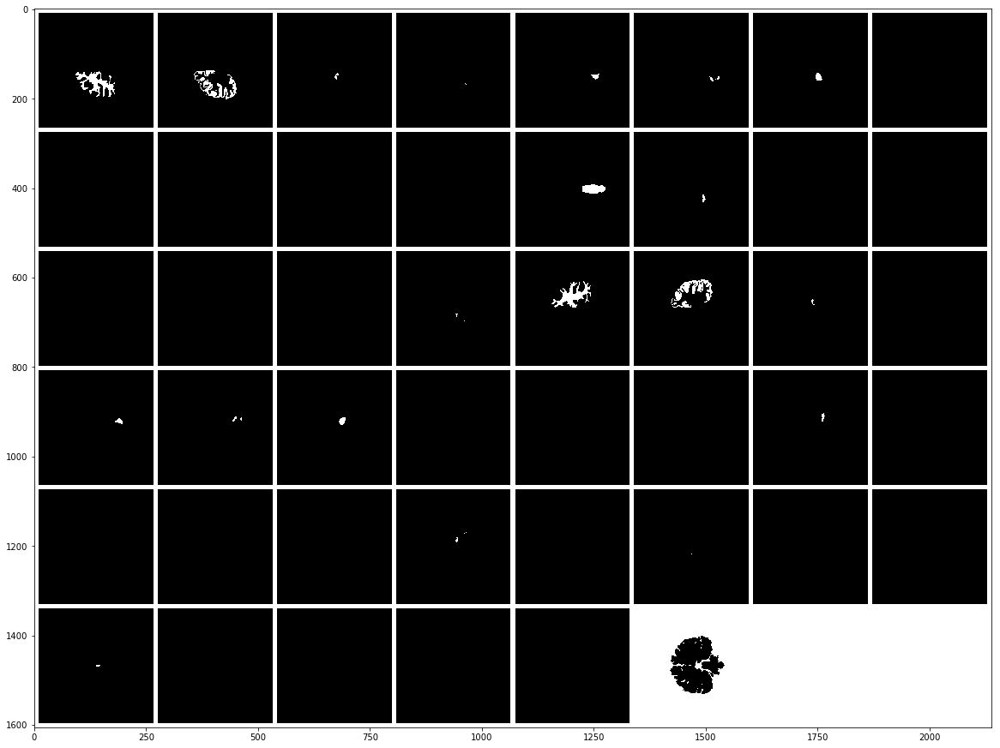

In [124]:
show(make_grid(torch.from_numpy(pred[0,:,:,:].reshape(46,1,256,256)),padding=10,pad_value=1))


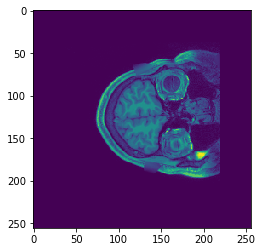

In [117]:
plt.imshow(x[0,0])

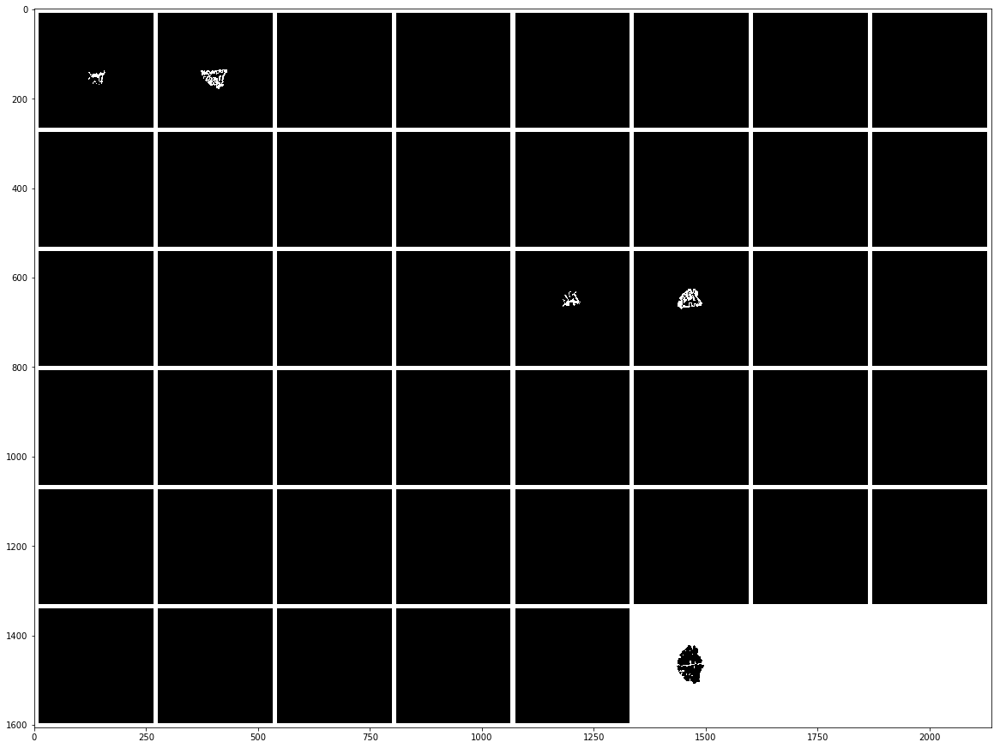

In [118]:
bcd = torch.from_numpy(y[0,:,:,:].reshape(46,1,256,256))
show(make_grid(bcd,padding=10,pad_value=1))

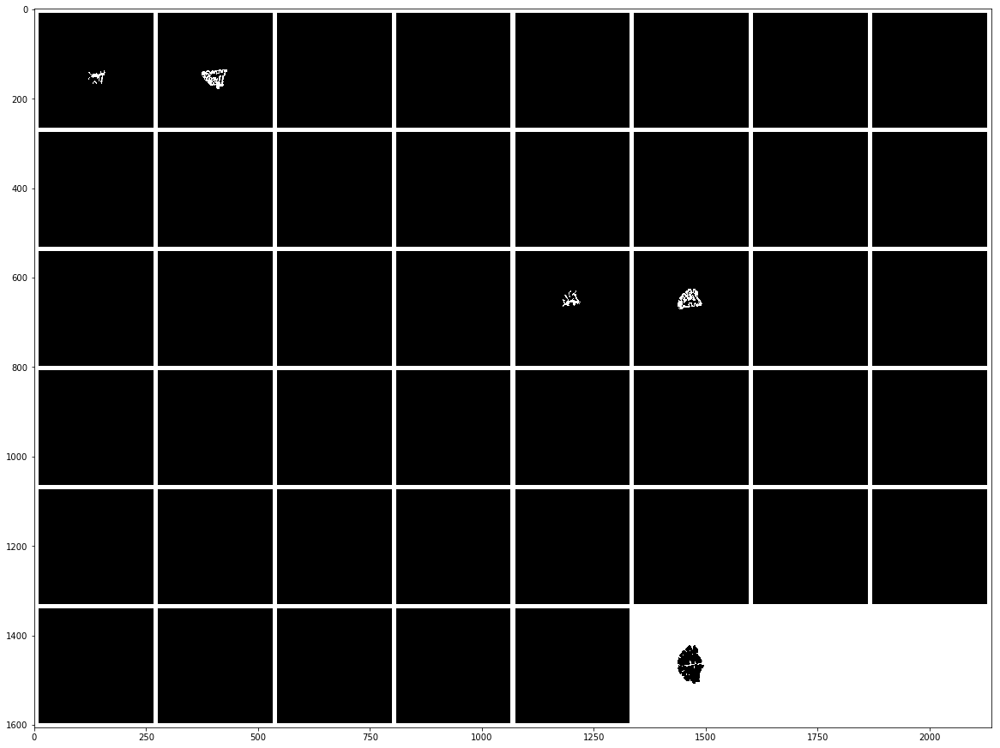

In [119]:
show(make_grid(torch.from_numpy(pred[0,:,:,:].reshape(46,1,256,256)),padding=10,pad_value=1))


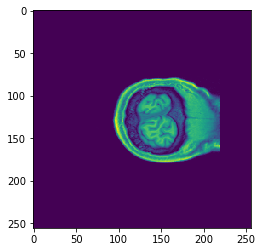

In [115]:
plt.imshow(x[0,0])

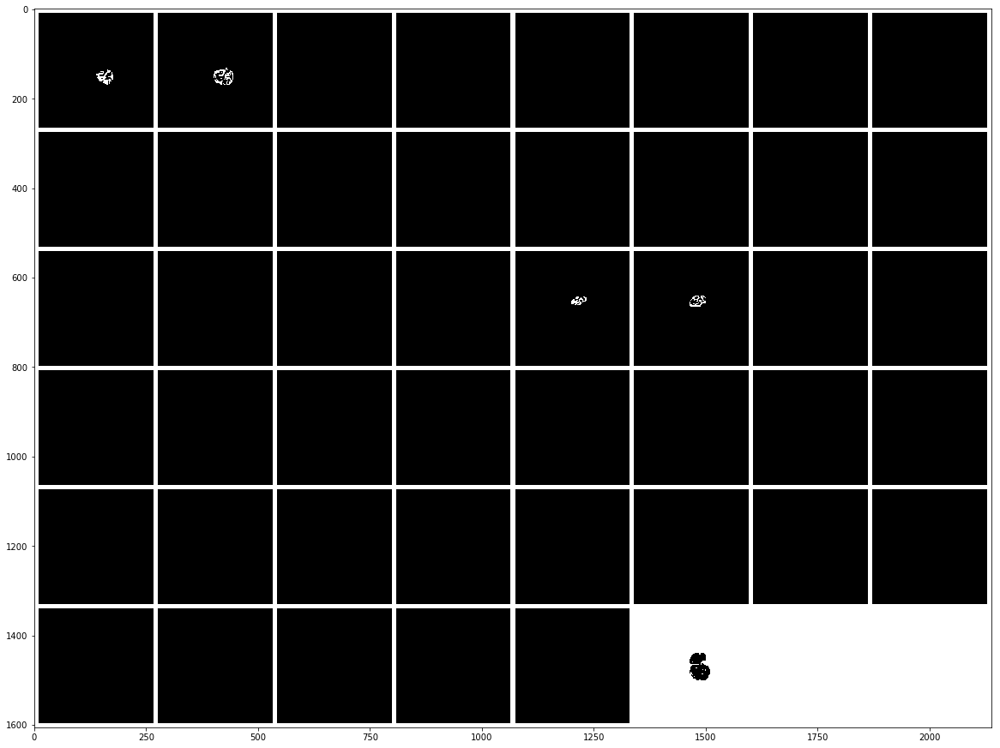

In [113]:
bcd = torch.from_numpy(y[0,:,:,:].reshape(46,1,256,256))
show(make_grid(bcd,padding=10,pad_value=1))

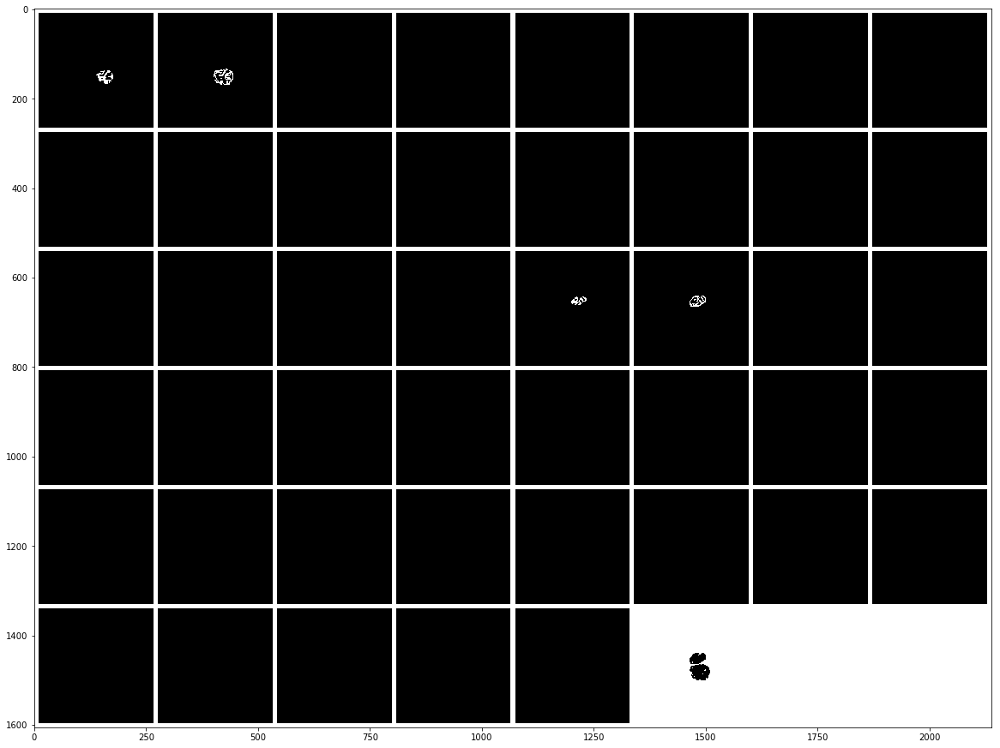

In [114]:
show(make_grid(torch.from_numpy(pred[0,:,:,:].reshape(46,1,256,256)),padding=10,pad_value=1))


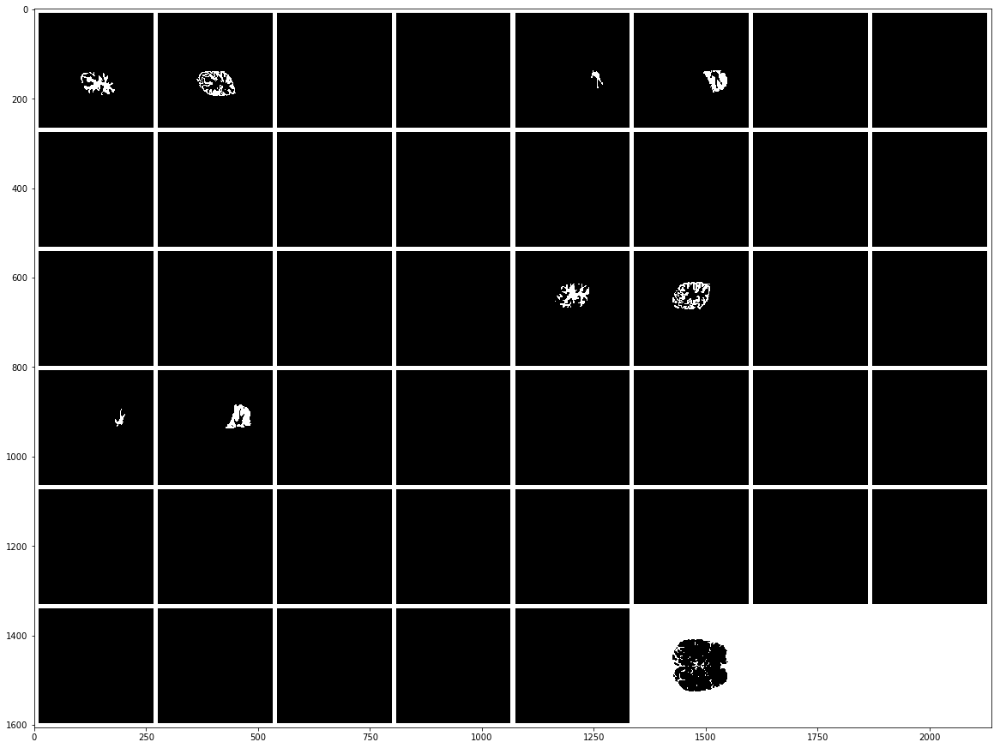

In [106]:
bcd = torch.from_numpy(y[0,:,:,:].reshape(46,1,256,256))
show(make_grid(bcd,padding=10,pad_value=1))

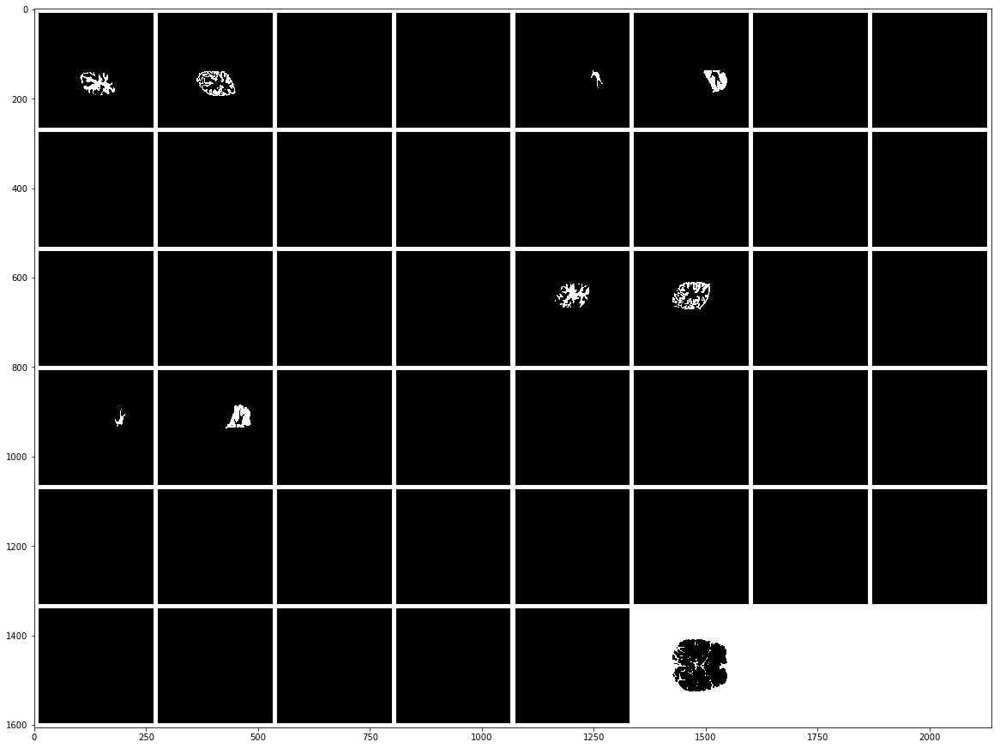

In [107]:
show(make_grid(torch.from_numpy(pred[0,:,:,:].reshape(46,1,256,256)),padding=10,pad_value=1))
